## Importing Modules used

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import pickle
import bisect
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix as cm
from scipy.stats import mstats
from sklearn.feature_selection import RFE
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance


## Jupyter settings

In [2]:
pd.get_option('max_columns')

20

In [3]:
pd.get_option('max_rows')

60

In [4]:
sns.set(style="darkgrid")
import warnings
warnings.filterwarnings('ignore')
pd.set_option('max_rows',100)
pd.set_option('max_columns',50)

### Importing Dataset into a DataFrame

In [0]:
from google.colab import files
uploaded = files.upload()

Saving creditcard.csv to creditcard.csv


In [5]:
import io
df = pd.read_csv(io.BytesIO(uploaded['creditcard.csv']))

NameError: ignored

In [51]:
pitchi_path=r'C:\Users\pitch\Jupyter\DataScience\capstone\creditcardfraud'
prasanth_path=r'C:\Users\pchadha\Capstone' # please set your dataset path here 

In [52]:
import socket
if socket.gethostname()=='DESKTOP-M13FI00':
    df=pd.read_csv(pitchi_path + '\\' + 'creditcard.csv')
else:
    df=pd.read_csv(prasanth_path + '\\' + 'creditcard.csv')

## EDA 

In [29]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [6]:
len(df.index)

284807

In [0]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,1.768627e-15,9.170318e-16,-1.810658e-15,1.693438e-15,1.479045e-15,3.482336e-15,1.392007e-15,-7.528491e-16,4.328772e-16,9.049732e-16,5.085503e-16,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

All the columns, except 'Amount' and 'Time', are PCA transformed. Also, there are no null values.
Will now perform some EDA on columns to assess their impact or relation with target 'Class' feature and short list features accordingly

Will check for data imbalance in the data set 

In [31]:
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [32]:
len(df[df.Class == 1].index)/len(df.index)*100

0.1727485630620034

In [33]:
len(df[df.Class == 0].index)/len(df.index)*100

99.82725143693798

No handles with labels found to put in legend.


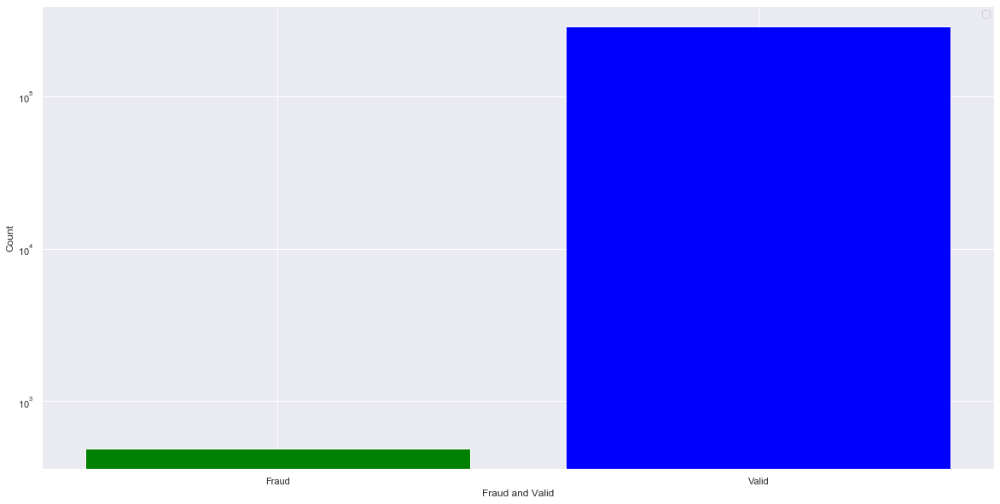

In [0]:
# Create a bar plot for the number and percentage of fraudulent vs non-fraudulent transcations
names = ['Fraud', 'Valid']
plt.figure(figsize = (20,10))
plt.bar(np.arange(2),[len(df[df.Class == 1].index),len(df[df.Class == 0].index)] , color = ['green', 'blue'])
#plt.plot(len(df[df.Class == 0].index), color = 'blue')
plt.xticks(np.arange(2), names)
plt.xlabel('Fraud and Valid')
plt.ylabel('Count')
plt.yscale('log')
plt.legend(loc = 'Best')
plt.show()

No handles with labels found to put in legend.


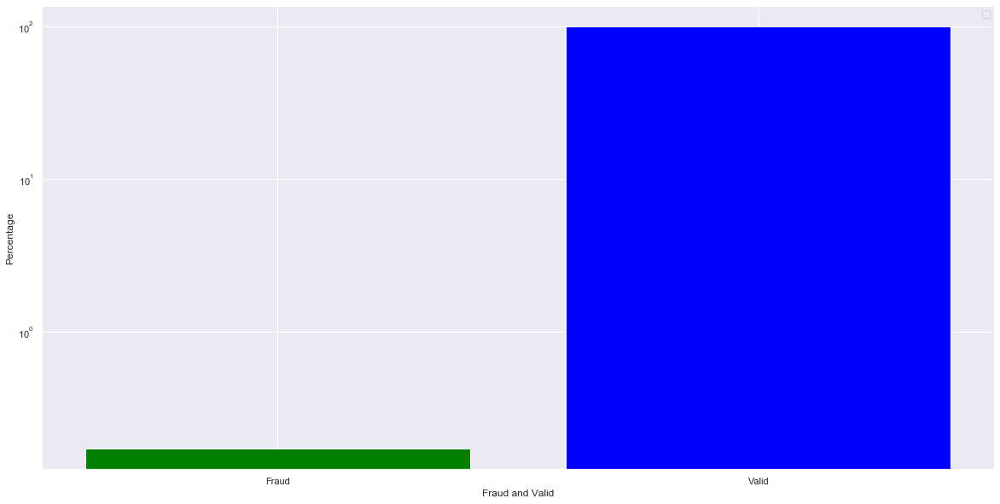

In [0]:
plt.figure(figsize = (20,10))
plt.bar(np.arange(2),[100*(len(df[df.Class == 1].index)/len(df.index)),100*(len(df[df.Class == 0].index)/len(df.index))] , color = ['green', 'blue'])
#plt.plot(len(df[df.Class == 0].index), color = 'blue')
plt.xticks(np.arange(2), names)
plt.xlabel('Fraud and Valid')
plt.ylabel('Percentage')
plt.yscale('log')
plt.legend(loc = 'Best')
plt.show()

From the above graphs, we can see that data is clearly imbalanced with fraud, class '1', entires just constituting 0.173%. Will treat this imbalance using first 'SMOTE' technique and then ADASYN in case 'SMOTE' does not give good results. First though, will select features

In [0]:
fraud = df[df.Class == 1]
valid = df[df.Class == 0]

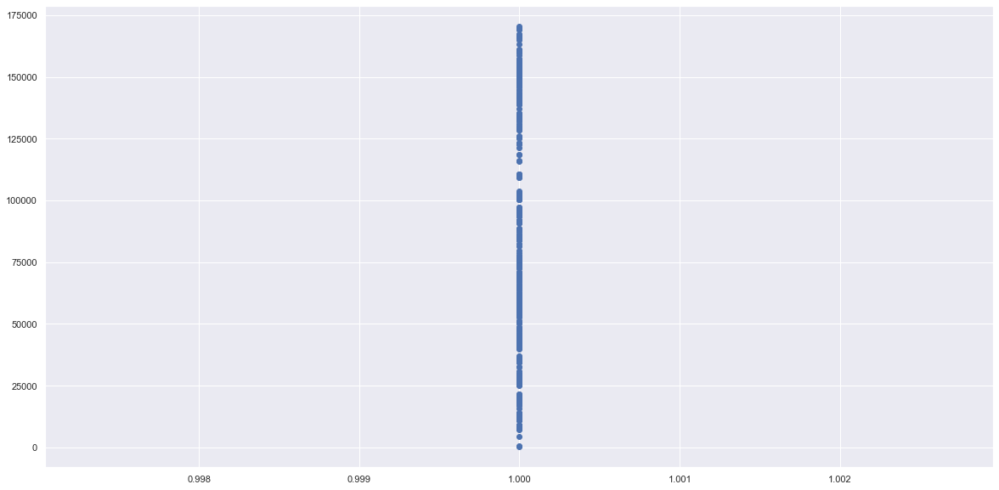

In [0]:
# Scatter plot of classes against Time
plt.figure(figsize = (20,10))
plt.scatter(fraud.Class, fraud.Time)

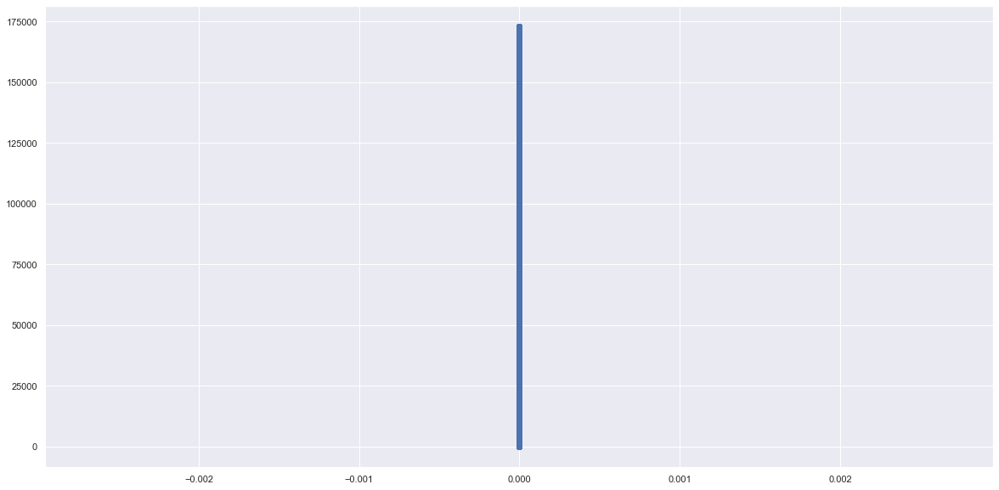

In [0]:
plt.figure(figsize = (20,10))
plt.scatter(valid.Class, valid.Time)

The max value of time, 172792, is equalant to 48 hours, i.e., two days as specified in data set description. The time between transactions could have been useful if we could discern particular timeline wherein fraud or class '1' transactions occurred most. However, the distribution for both classes is similar wrt 'Time' so will drop this feature 

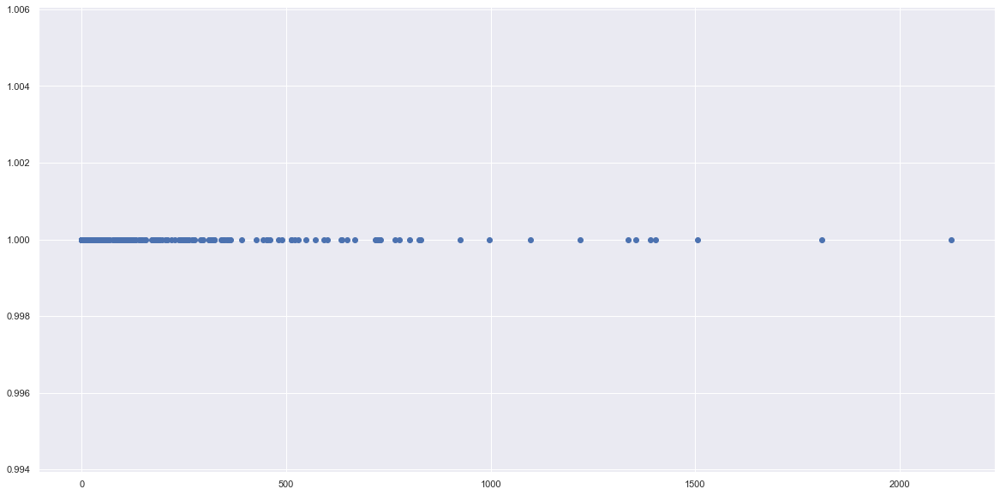

In [0]:
# Scatter plot of classes against Amount
plt.figure(figsize = (20,10))
plt.scatter(fraud.Amount, fraud.Class)

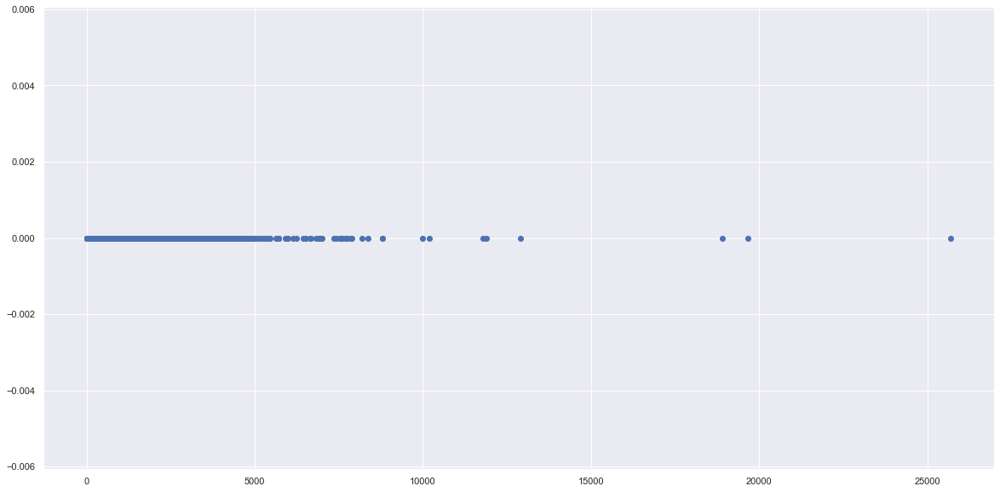

In [0]:
plt.figure(figsize = (20,10))
plt.scatter(valid.Amount, valid.Class)

Distribution of both classes is similar wrt 'Amount' does show differences as in the case of class '1' or fraud transactions, the 'Amount' value range is quite lower as compared to class '0' or valid transactions, i.e., fraudulent transactions tend to be of much lower amount when compared to valid transactions. Therefore, will keep the 'Amount' column

In [53]:
df = df.drop('Time', axis = 1)

Since all the features are PCA transformed, their individual plots would be gaussian in nature. Lets see if thats the case

In [0]:
col = []
for i in df.columns:
    if i != 'Time' and i!= 'Amount' and i != 'Class':
        col.append(i)

In [0]:
col

['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28']

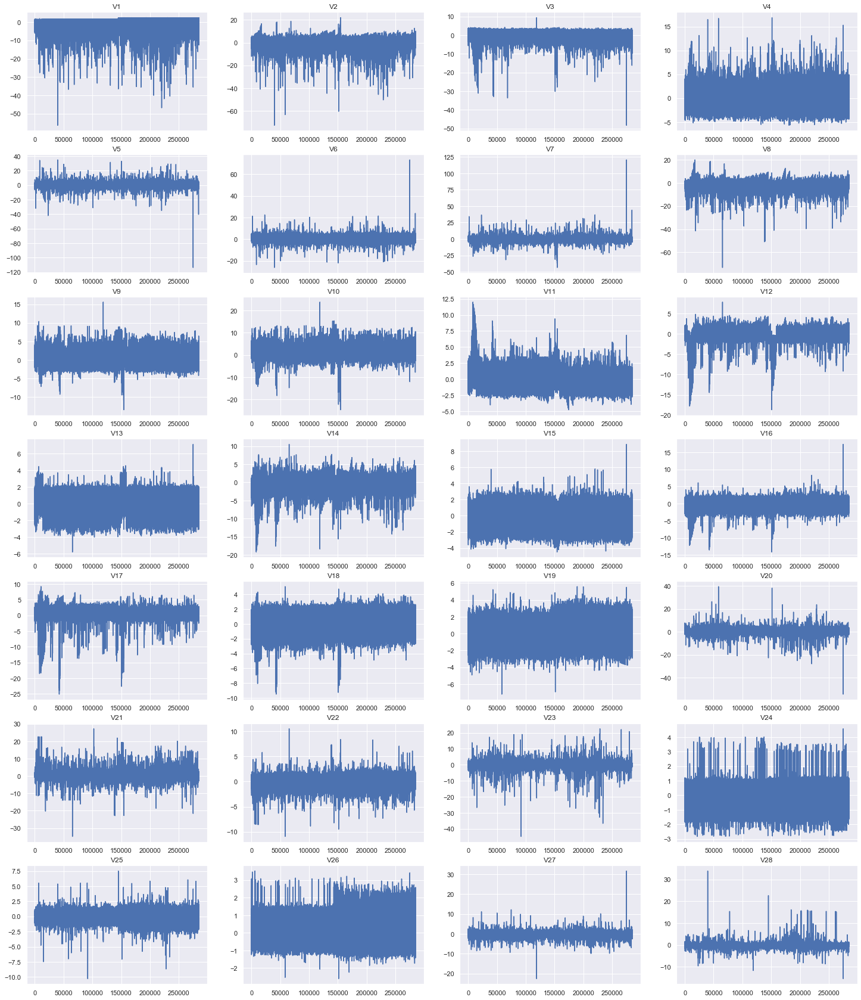

In [0]:
plt.figure(figsize=(25, 30))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    plt.plot(df[i])
    n= n+1

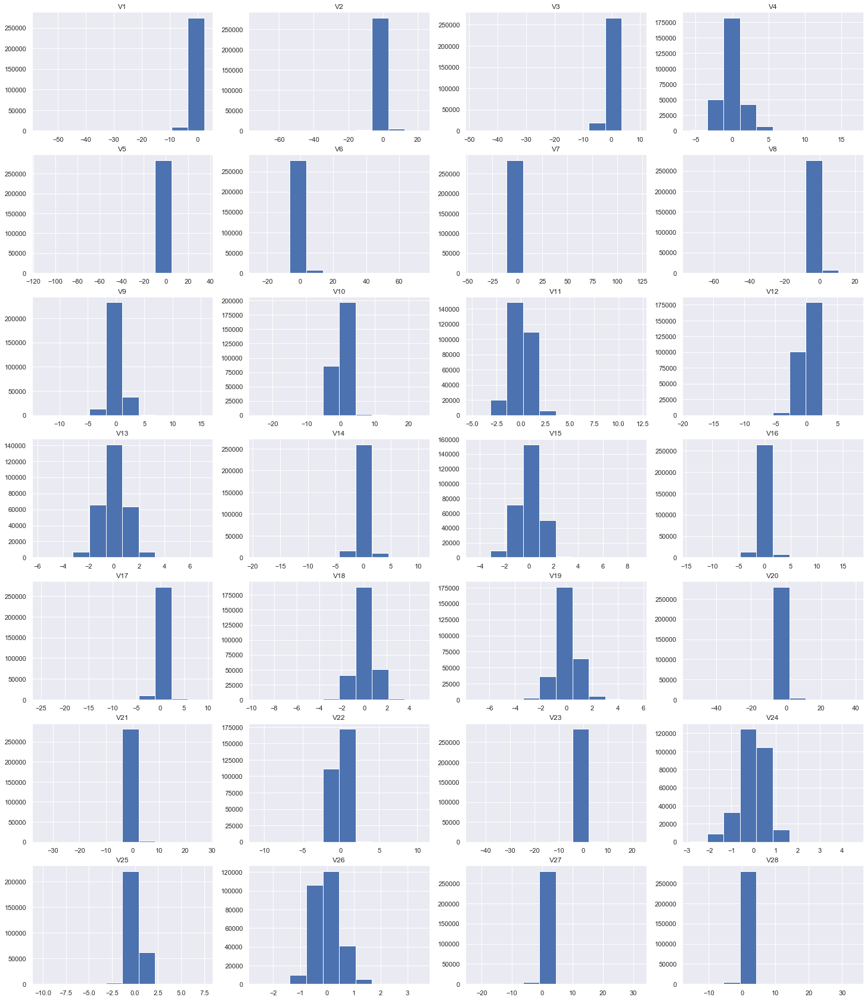

In [0]:
plt.figure(figsize=(25, 30))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    plt.hist(df[i], align = 'mid')
    n= n+1

The graphs, both histogram and distribution, of features shows that they are gaussian in nature. Will now plot pair-plots to understand relation amongst themselves as well as 'Class' variable 

In [0]:
#col.append('Class')

In [0]:
col1 = []
col2 = []
for i in col:
    if int(i[1:]) <= 14:
        col1.append(i)
    else:
        col2.append(i)

In [0]:
col1.append('Class')
col2.append('Class')

<Figure size 1800x2160 with 0 Axes>

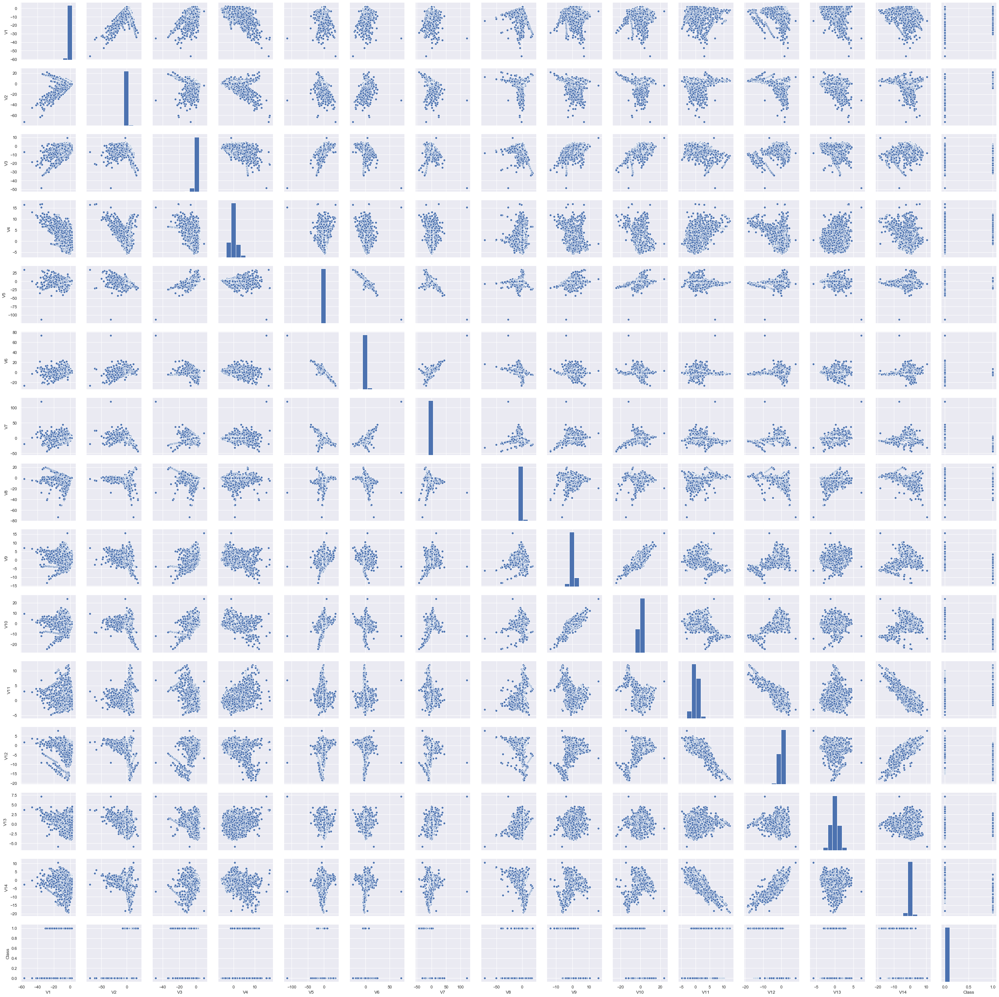

In [0]:
plt.figure(figsize = [25,30])
sns.pairplot(df[col1])
plt.show()

We can see from above pair-plots that few features such as 'V14', 'V12', 'V11' seem to be correlated. Features 'V5', 'V6' and 'V7' seem to have some correlation as well. Apart from feature 'V6', rest of the features do have reasonable distribution in both classes. Will plot the pair plot for the other 14 features with 'Class' feature too

<Figure size 1800x2160 with 0 Axes>

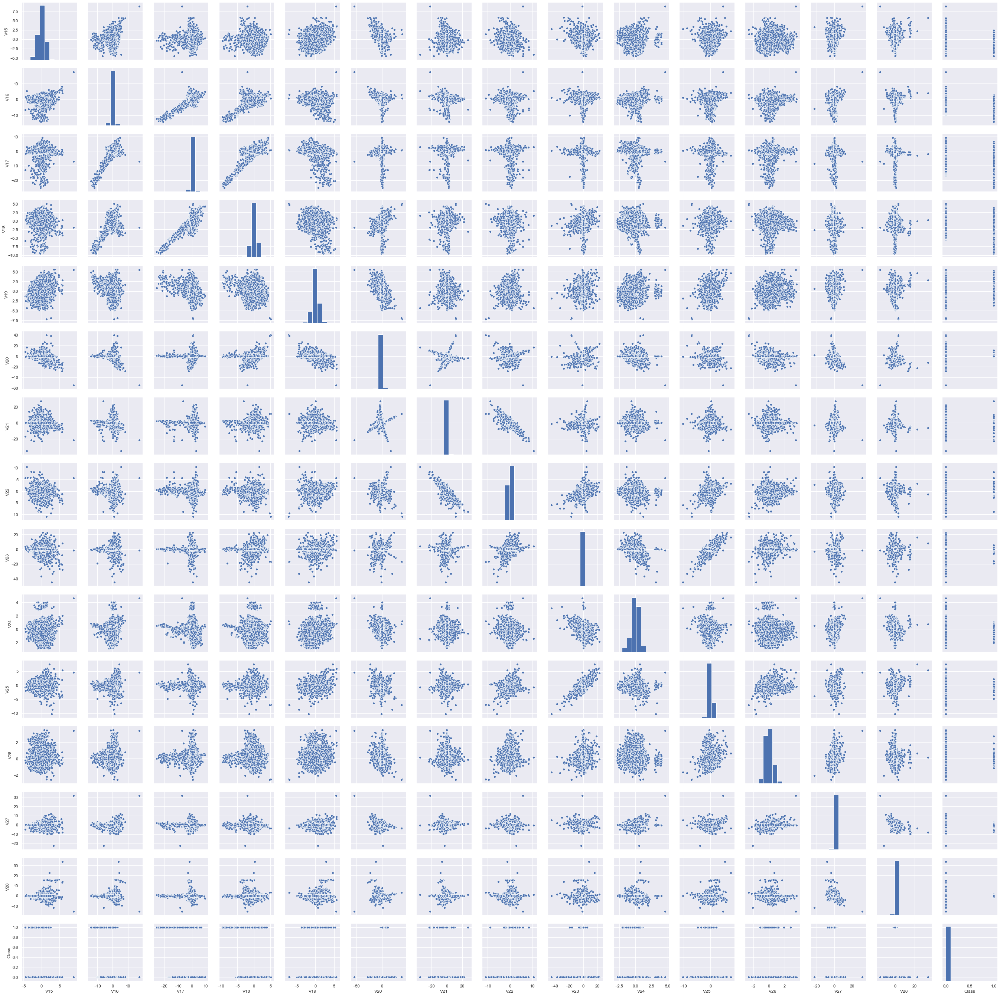

In [0]:
plt.figure(figsize = [25,30])
sns.pairplot(df[col2])
plt.show()

Features 'V16', 'V17' and 'V18' seem to be correlated. Also, feature 'V28' has negligible distribution for class '1' cases so will drop this feature.
Will now plot heat map to asses the correlation between features (including 'Class'. Will use 'Spearman's' correlation method as we have binary type feature as 'Target' feature

In [54]:
df = df.drop('V28', axis = 1)

In [0]:
# Preparing three sets of features for plotting heat maps
colx = []
coly = []
colz = []
for i in col:
    if int(i[1:]) <= 9:
        colx.append(i)
    elif int(i[1:]) > 9 and int(i[1:]) <= 18:
        coly.append(i)
    elif int(i[1:]) > 18 and int(i[1:]) <= 27:
        colz.append(i)

In [0]:
colx.append('Class')
coly.append('Class')
colz.append('Class')

In [0]:
df[colx].corr('spearman')

,V1,V2,V3,V4,V5,V6,V7,V8,V9,Class
V1,1.000000,-0.384328,-0.412095,0.101011,-0.106632,-0.086561,-0.227650,-0.236140,0.138614,-0.042424
V2,-0.384328,1.000000,0.073967,0.155042,0.342701,-0.110393,0.426320,0.006980,-0.077880,0.051062
V3,-0.412095,0.073967,1.000000,0.060812,-0.223849,0.171263,-0.074582,0.164374,-0.030876,-0.059278
V4,0.101011,0.155042,0.060812,1.000000,0.021367,0.075185,0.059920,-0.009608,0.105248,0.063045
V5,-0.106632,0.342701,-0.223849,0.021367,1.000000,-0.007577,0.431573,-0.057022,-0.056580,-0.030147
V6,-0.086561,-0.110393,0.171263,0.075185,-0.007577,1.000000,-0.292680,0.444053,0.028864,-0.038410
V7,-0.227650,0.426320,-0.074582,0.059920,0.431573,-0.292680,1.000000,-0.389213,-0.100252,-0.048308
V8,-0.236140,0.006980,0.164374,-0.009608,-0.057022,0.444053,-0.389213,1.000000,-0.002511,0.022706
V9,0.138614,-0.077880,-0.030876,0.105248,-0.056580,0.028864,-0.100252,-0.002511,1.000000,-0.049499
Class,-0.042424,0.051062,-0.059278,0.063045,-0.030147,-0.038410,-0.048308,0.022706,-0.049499,1.000000


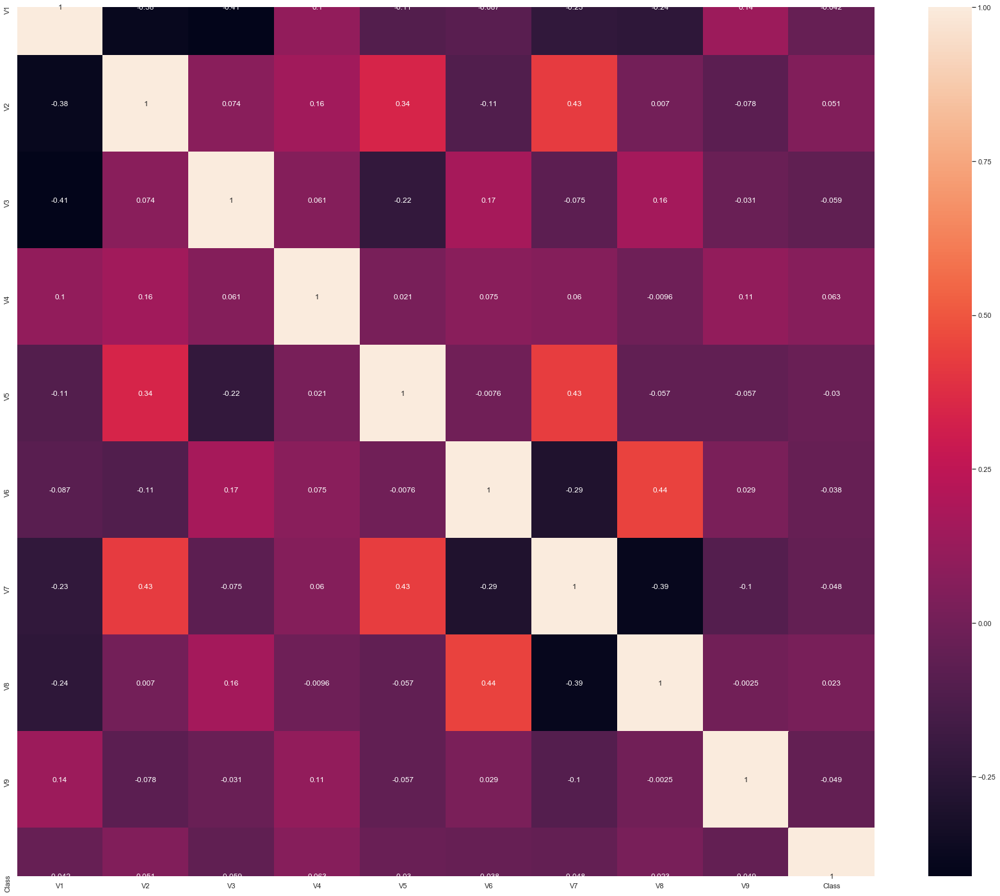

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(df[colx].corr('spearman'), annot = True)
plt.show()

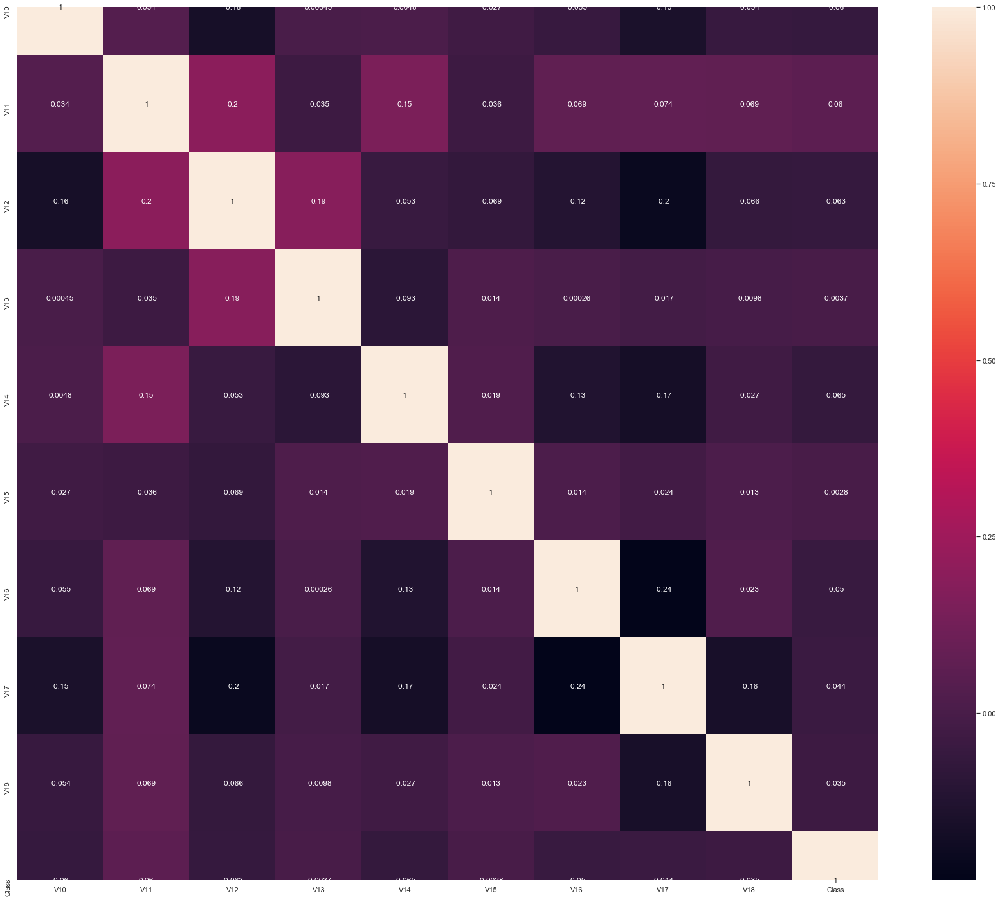

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(df[coly].corr('spearman'), annot = True)
plt.show()

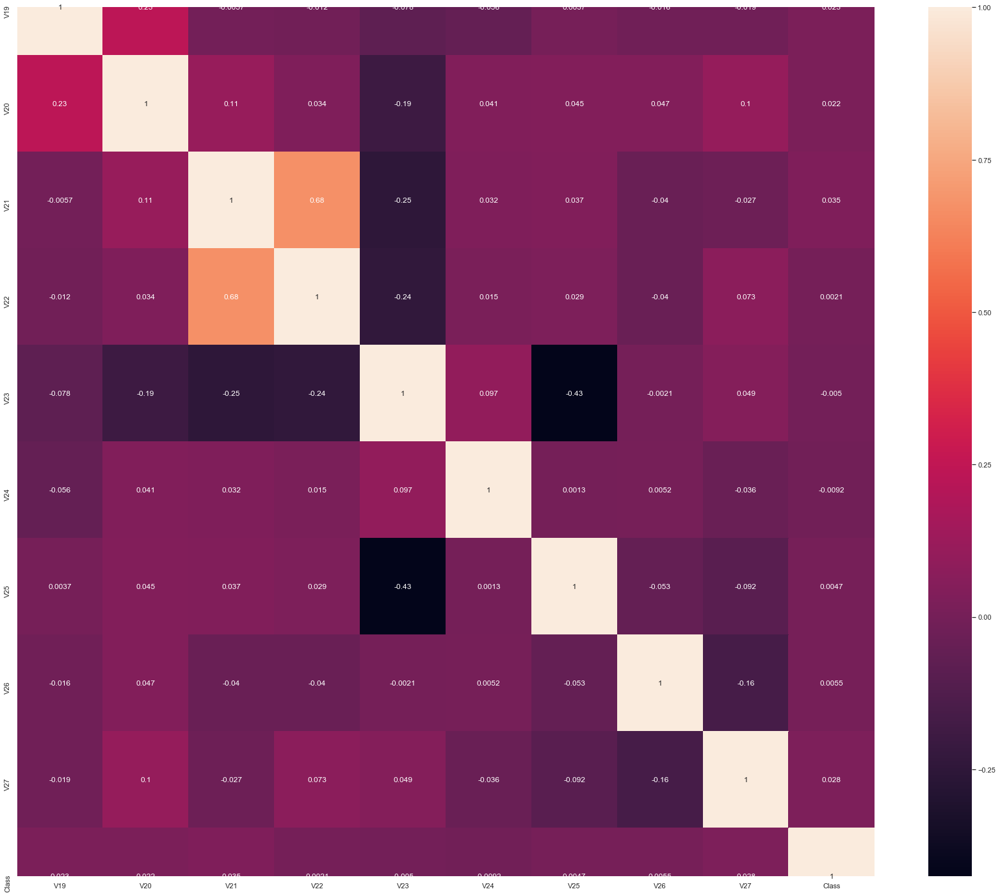

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(df[colz].corr('spearman'), annot = True)
plt.show()

From the above heat maps, we can remove following features as they have really low correlation values with 'Class' feature
Features that can be removed: 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V13', 'V15', 'V20', 'V6', 'V8', 'V19', 'V20'. However, will use first RFE to shortlist top 14 features (including 'Amount') and then run the model again by removing '4' more lower importance feature to see if it improves the model
This exercise will only be done for logistic regression model as for other models, we have 'Number of parameters' as important hyperparameter that can be tuned 

In [0]:
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,69.99,0


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 29 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

Normalizing the 'Amount' feature using standard scalar

In [10]:
from sklearn.preprocessing import StandardScaler

Now that we have selected the features, will check for skewness in the features

In [190]:
col = df.columns

In [191]:
col = col.drop('Class')

In [192]:
col

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')

In [140]:
# Splitting data into train and test data sets
y = df['Class']
y.value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [141]:
X = df[col]

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3, stratify = y, random_state = 100)

In [17]:
# Transforming the "amount" using "StandardScaler" normalization method
st = StandardScaler()

In [17]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 222925 to 271
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [18]:
cola = ['Amount']

In [19]:
X_train[cola] = st.fit_transform(X_train[cola])

C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.loc._setitem_with_indexer((slice(None), indexer), value)
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2935: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [20]:
X_test[cola] = st.transform(X_test[cola])

C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.loc._setitem_with_indexer((slice(None), indexer), value)
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2935: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [21]:
X_train[cola].describe()

,Amount
count,1.993640e+05
mean,-5.042097e-17
std,1.000003e+00
min,-3.635209e-01
25%,-3.398470e-01
50%,-2.723105e-01
75%,-4.454232e-02
max,8.070722e+01


In [22]:
X_test[cola].describe()

,Amount
count,85443.000000
mean,0.002885
std,1.101771
min,-0.363521
25%,-0.340878
50%,-0.274641
75%,-0.045945
max,105.596248


Checking for skewness in data now

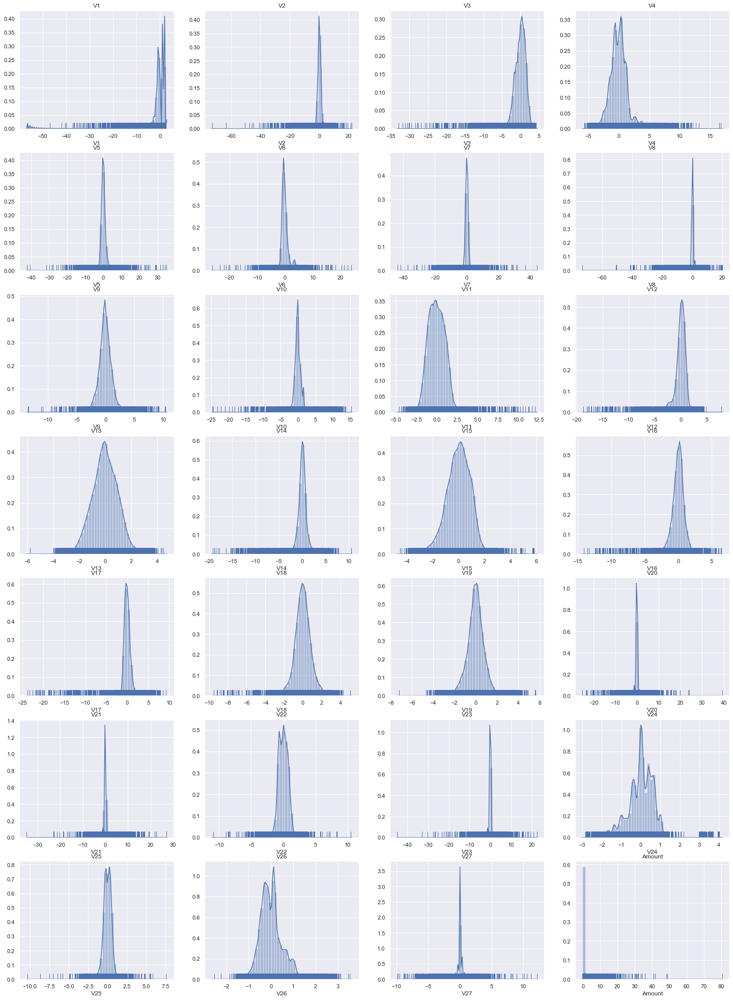

In [0]:
plt.figure(figsize=(25, 35))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    sns.distplot(X_train[i], rug = True)
    n= n+1

From the above plots, following are the features that show skeness:
'V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount'

In [19]:
colp = ['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [20]:
from sklearn.preprocessing import PowerTransformer

In [21]:
pt = PowerTransformer(copy = False)

In [26]:
X_train[colp] = pt.fit_transform(X_train[colp])

C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.loc._setitem_with_indexer((slice(None), indexer), value)
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2935: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

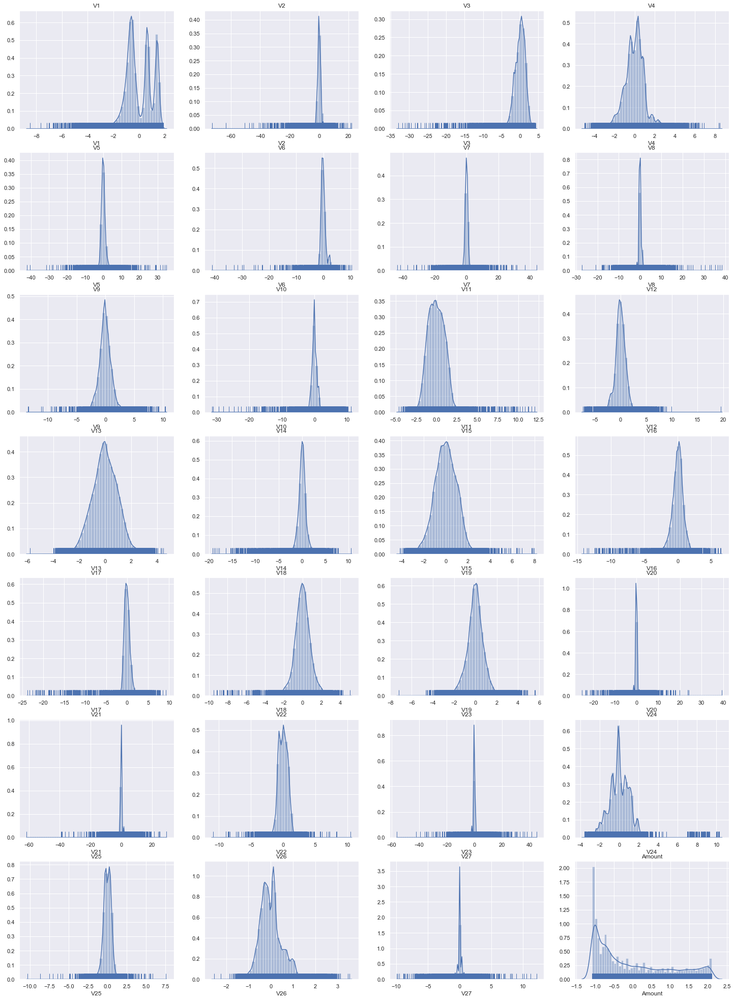

In [0]:
plt.figure(figsize=(25, 35))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    sns.distplot(X_train[i], rug = True)
    n= n+1

We can see that using the power transformer function, all the features are more or less Gaussian in nature

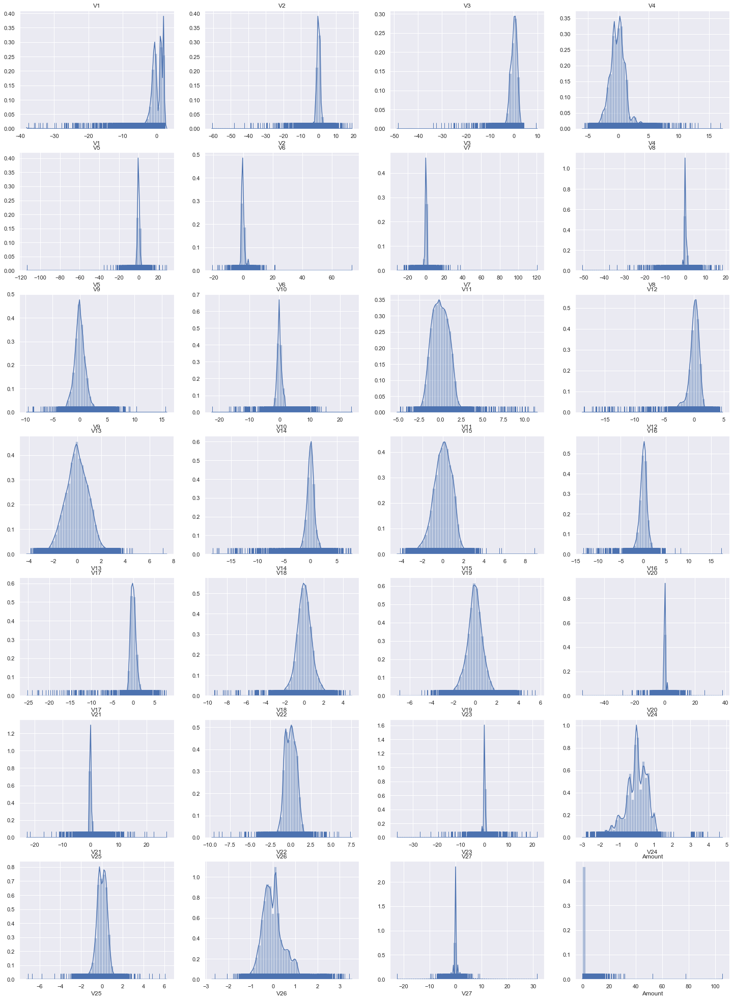

In [0]:
plt.figure(figsize=(25, 35))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    sns.distplot(X_test[i], rug = True)
    n= n+1

We can see that the same features need to be treated for skewness for test data as well. Will do the same treatment for test data as well

In [27]:
X_test[colp] = pt.transform(X_test[colp])

C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2969: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.loc._setitem_with_indexer((slice(None), indexer), value)
C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2935: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

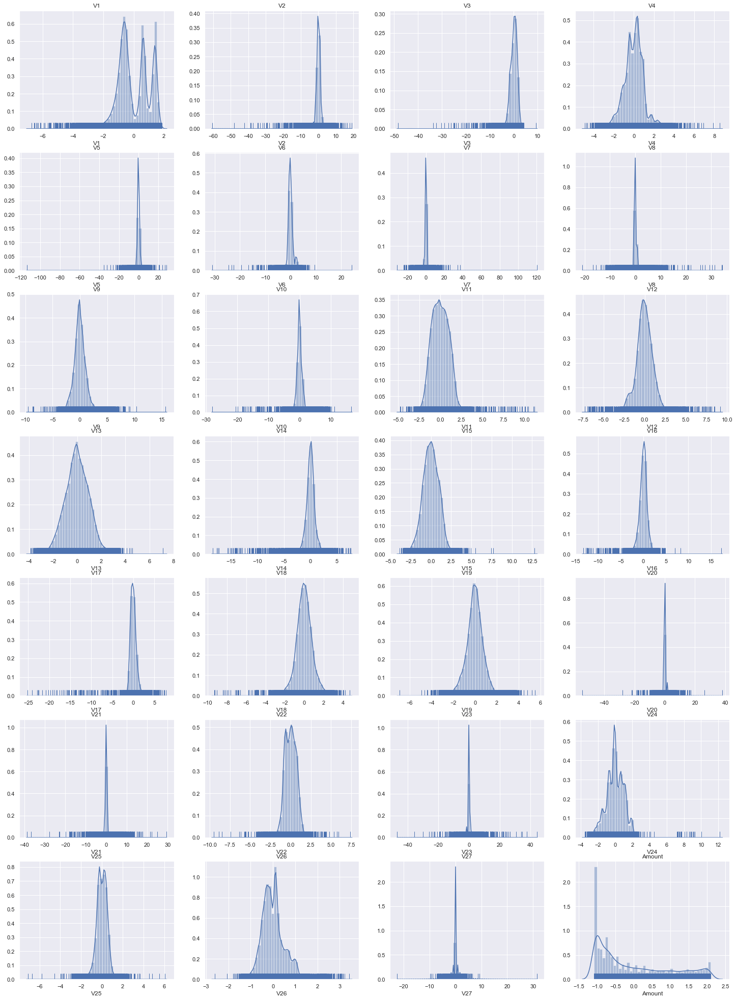

In [0]:
plt.figure(figsize=(25, 35))
n = 1
for i in col:
    plt.subplot(7,4,n, autoscale_on = True, title = i)
    #plt.title(i)
    sns.distplot(X_test[i], rug = True)
    n= n+1

Model building
Will first build models, LogisticRegression, KNN, RandomForest, Decision Tree and XGBoost without balancing the data

In [0]:
# RFE to select top 14 features

In [29]:
X_train.index = pd.RangeIndex(0, len(X_train.index))
y_train.index = pd.RangeIndex(0, len(y_train.index))

In [30]:
X_test.index = pd.RangeIndex(0, len(X_test.index))
y_test.index = pd.RangeIndex(0, len(y_test.index))

In [0]:
X_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,1.445692,-0.149880,-1.092234,0.368105,-0.225796,-0.931864,0.082871,-0.301648,0.733270,0.138158,-0.908262,-0.409325,-1.216003,0.534920,0.196855,-0.103995,-0.158785,-0.802113,0.083010,-0.313465,-0.395420,-0.779702,0.586820,-0.175555,-0.356438,0.205392,-0.075806,-1.032424
1,-0.168557,1.112008,-0.391539,-0.340794,1.014727,-0.589994,1.042734,-0.238026,-0.200830,-0.804936,-0.537991,0.333235,1.034272,-1.222412,-0.431847,0.290628,0.298838,-0.333729,-0.226373,0.084311,-0.442209,-0.755443,0.117042,1.000062,-0.383245,0.110292,0.229167,-0.982501
2,1.540551,0.215237,-2.221643,0.027795,0.815822,-1.129044,0.843943,-0.616503,0.009745,0.022332,-0.476749,0.950682,1.144607,0.555759,0.263245,-0.661516,-0.362293,-0.647254,0.126100,-0.133286,0.225184,0.611995,-0.056913,1.496788,0.505014,0.203037,-0.083225,-0.917327
3,-0.457140,0.100332,1.721509,-0.598829,-0.371977,0.055891,-0.144740,0.084501,-1.843755,0.517523,1.627755,-0.452579,-0.100123,0.125968,0.756345,0.591865,0.665795,-1.191246,1.690163,0.295444,0.202774,0.217167,-0.035562,-0.067283,-0.326120,-0.285113,0.118226,-0.425881
4,-0.500691,1.871311,-1.106687,0.786730,1.239594,-0.435205,1.100319,0.144093,-0.917002,-0.785152,-0.888776,-0.408620,-0.076494,-0.756161,-0.242246,-0.554555,1.442972,0.385060,0.585502,0.024939,0.097412,0.366613,-0.416204,0.814595,0.091257,-0.398552,0.330173,-0.857193


In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 14)
rfe = rfe.fit(X_train, y_train)

In [0]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('V1', True, 1),
 ('V2', False, 13),
 ('V3', False, 6),
 ('V4', True, 1),
 ('V5', False, 15),
 ('V6', False, 12),
 ('V7', True, 1),
 ('V8', True, 1),
 ('V9', False, 4),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', True, 1),
 ('V16', False, 5),
 ('V17', False, 8),
 ('V18', False, 7),
 ('V19', False, 10),
 ('V20', False, 14),
 ('V21', True, 1),
 ('V22', True, 1),
 ('V23', False, 3),
 ('V24', True, 1),
 ('V25', False, 11),
 ('V26', False, 2),
 ('V27', True, 1),
 ('Amount', False, 9)]

In [0]:
colr = X_train.columns[rfe.support_]

In [0]:
X_train_rfe = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred[:10]

0    0.000143
1    0.000131
2    0.000052
3    0.000144
4    0.000998
5    0.000013
6    0.000946
7    0.000211
8    0.001525
9    0.000127
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([1.42502279e-04, 1.30825325e-04, 5.19012881e-05, 1.44215657e-04,
       9.97727613e-04, 1.27558801e-05, 9.46332814e-04, 2.10819438e-04,
       1.52521445e-03, 1.26642073e-04])

In [0]:
y_train_pred.reshape(-1)

array([1.42502279e-04, 1.30825325e-04, 5.19012881e-05, ...,
       2.66578862e-04, 1.42937072e-04, 5.60659874e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000143
1,0,0.000131
2,0,0.000052
3,0,0.000144
4,0,0.000998


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

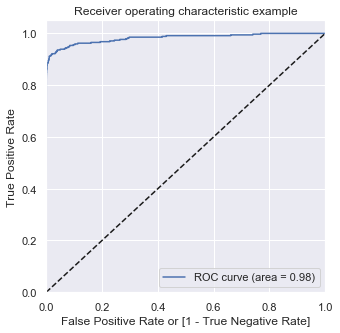

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000143,1,0,0,0,0,0,0,0,0,0
1,0,0.000131,1,0,0,0,0,0,0,0,0,0
2,0,0.000052,1,0,0,0,0,0,0,0,0,0
3,0,0.000144,1,0,0,0,0,0,0,0,0,0
4,0,0.000998,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999308  0.799419  0.999653  0.799419
0.2   0.2  0.999288  0.767442  0.999688  0.809816
0.3   0.3  0.999288  0.723837  0.999764  0.841216
0.4   0.4  0.999288  0.688953  0.999824  0.871324
0.5   0.5  0.999263  0.651163  0.999864  0.892430
0.6   0.6  0.999212  0.610465  0.999884  0.901288
0.7   0.7  0.999192  0.595930  0.999889  0.903084
0.8   0.8  0.999157  0.572674  0.999894  0.903670
0.9   0.9  0.999057  0.514535  0.999894  0.893939


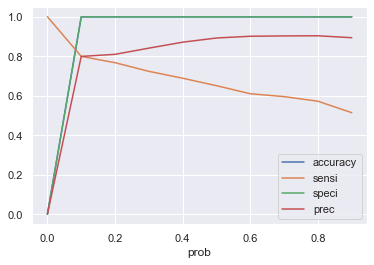

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7994186046511628


In [0]:
colr

Index(['V1', 'V4', 'V7', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V21',
       'V22', 'V24', 'V27'],
      dtype='object')

In [0]:
X_test_rfe = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([2.64356891e-03, 4.71727021e-03, 8.10069678e-05, ...,
       4.76787054e-05, 4.51304189e-04, 2.74052327e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.9991456292499094


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7388535031847133


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced below 75%, its about 74%. Lets see the F1 score

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.7606557377049181


F1 scores of both train and test data set show little difference, with train F1 being around 80% and test F1 being 76%

The model does not show signs of overfitting as metrics of train and test scores are quite close. Still, lets see if first, adding a feature can improve the precision and recall scores. From the RFE_ranking stat, next rank feature wrt correlation is 'V26', with rank -2. Will add this and in case no improvement is observed, will remove feature based on RFE importance score    

In [0]:
colr = list(colr)

In [0]:
colr.append('V26')

In [0]:
X_train_rfe_1 = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe_1)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred[:10]

0    0.000147
1    0.000133
2    0.000053
3    0.000141
4    0.000946
5    0.000014
6    0.000914
7    0.000203
8    0.001497
9    0.000134
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([1.47029356e-04, 1.33495089e-04, 5.32149080e-05, 1.40926392e-04,
       9.46305489e-04, 1.44495445e-05, 9.13690793e-04, 2.02560739e-04,
       1.49689967e-03, 1.34200055e-04])

In [0]:
y_train_pred.reshape(-1)

array([1.47029356e-04, 1.33495089e-04, 5.32149080e-05, ...,
       2.58182026e-04, 1.48656370e-04, 5.27888749e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000147
1,0,0.000133
2,0,0.000053
3,0,0.000141
4,0,0.000946


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

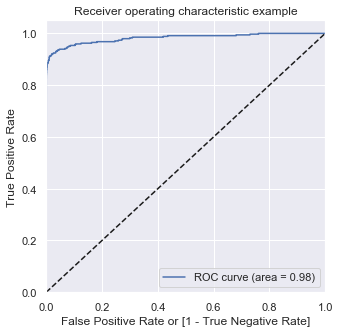

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000147,1,0,0,0,0,0,0,0,0,0
1,0,0.000133,1,0,0,0,0,0,0,0,0,0
2,0,0.000053,1,0,0,0,0,0,0,0,0,0
3,0,0.000141,1,0,0,0,0,0,0,0,0,0
4,0,0.000946,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999303  0.796512  0.999653  0.798834
0.2   0.2  0.999288  0.767442  0.999688  0.809816
0.3   0.3  0.999288  0.723837  0.999764  0.841216
0.4   0.4  0.999288  0.688953  0.999824  0.871324
0.5   0.5  0.999273  0.656977  0.999864  0.893281
0.6   0.6  0.999218  0.613372  0.999884  0.901709
0.7   0.7  0.999192  0.595930  0.999889  0.903084
0.8   0.8  0.999157  0.572674  0.999894  0.903670
0.9   0.9  0.999052  0.511628  0.999894  0.893401


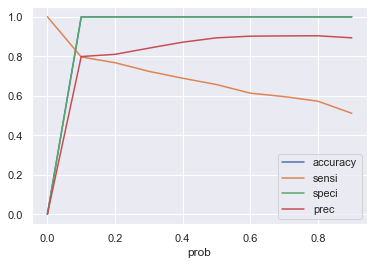

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7976710334788937


In [0]:
X_test_rfe_1 = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([2.88132357e-03, 4.52888365e-03, 7.95420226e-05, ...,
       5.04745740e-05, 4.37127946e-04, 2.42065140e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.9991573329588147


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7435897435897436


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


The precision score is slightly better for test dataset but not a big improvement so will now proceed with deleting few features and see if it improves the score.

In [0]:
# As per the correlation map, following were the least correlated features wrt 'Class'
# ['V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V13', 'V15', 'V20', 'V6', 'V8', 'V19', 'V20'] 

In [0]:
# The RFE_Features considered are:
colr.remove('V26')


In [0]:
colr

['V1',
 'V4',
 'V7',
 'V8',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V21',
 'V22',
 'V24',
 'V27']

In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr.remove('V27')


In [0]:
X_train_rfe_1 = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe_1)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([1.31360866e-04, 1.38836350e-04, 4.83052511e-05, ...,
       2.68355337e-04, 1.41374334e-04, 6.39389090e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000131
1,0,0.000139
2,0,0.000048
3,0,0.000160
4,0,0.001059


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

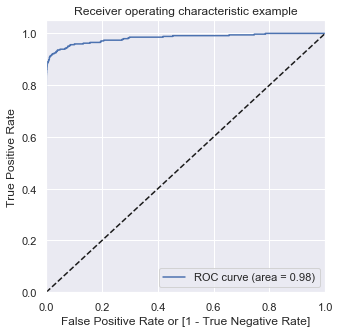

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000131,1,0,0,0,0,0,0,0,0,0
1,0,0.000139,1,0,0,0,0,0,0,0,0,0
2,0,0.000048,1,0,0,0,0,0,0,0,0,0
3,0,0.000160,1,0,0,0,0,0,0,0,0,0
4,0,0.001059,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999308  0.793605  0.999663  0.802941
0.2   0.2  0.999293  0.764535  0.999699  0.814241
0.3   0.3  0.999288  0.720930  0.999769  0.843537
0.4   0.4  0.999278  0.686047  0.999819  0.867647
0.5   0.5  0.999263  0.651163  0.999864  0.892430
0.6   0.6  0.999218  0.613372  0.999884  0.901709
0.7   0.7  0.999192  0.595930  0.999889  0.903084
0.8   0.8  0.999157  0.572674  0.999894  0.903670
0.9   0.9  0.999062  0.517442  0.999894  0.894472


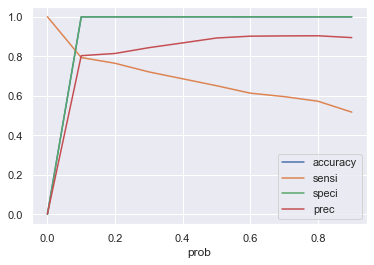

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7982456140350876


In [0]:
X_test_rfe_1 = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([2.70050950e-03, 4.87081618e-03, 7.64481349e-05, ...,
       4.70152079e-05, 5.80680517e-04, 1.34189730e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.99916903666772


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7483870967741936


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


In [0]:
# The scores have not improved much. Lets remove one more feature and see the possible changes in model performance.

In [0]:
colr

['V1',
 'V4',
 'V7',
 'V8',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V21',
 'V22',
 'V24']

In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr.remove('V24')


In [0]:
X_train_rfe_1 = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe_1)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([1.33456858e-04, 1.18739151e-04, 3.91784557e-05, ...,
       2.48436875e-04, 1.29521736e-04, 6.00657233e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000133
1,0,0.000119
2,0,0.000039
3,0,0.000165
4,0,0.000938


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

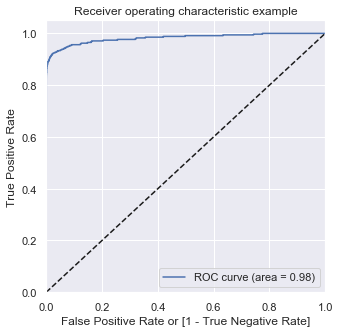

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000133,1,0,0,0,0,0,0,0,0,0
1,0,0.000119,1,0,0,0,0,0,0,0,0,0
2,0,0.000039,1,0,0,0,0,0,0,0,0,0
3,0,0.000165,1,0,0,0,0,0,0,0,0,0
4,0,0.000938,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999313  0.793605  0.999668  0.805310
0.2   0.2  0.999293  0.764535  0.999699  0.814241
0.3   0.3  0.999268  0.720930  0.999749  0.832215
0.4   0.4  0.999268  0.686047  0.999809  0.861314
0.5   0.5  0.999258  0.654070  0.999854  0.885827
0.6   0.6  0.999223  0.616279  0.999884  0.902128
0.7   0.7  0.999192  0.595930  0.999889  0.903084
0.8   0.8  0.999152  0.569767  0.999894  0.903226
0.9   0.9  0.999057  0.514535  0.999894  0.893939


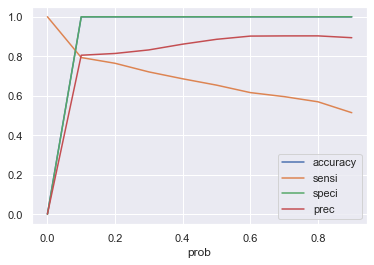

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7994143484626647


In [0]:
X_test_rfe_1 = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([3.22011828e-03, 5.09703890e-03, 7.63111036e-05, ...,
       5.87608092e-05, 6.59507179e-04, 1.81754628e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.99916903666772


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7483870967741936


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


In [0]:
# The scores are pretty much the same which means that features removed so far were not adding significant variance in the model. Will remove one more feature and see the difference

In [0]:
colr

['V1',
 'V4',
 'V7',
 'V8',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V21',
 'V22',
 'V24',
 'V27']

In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr.remove('V27')


In [0]:
X_train_rfe_1 = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe_1)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([1.31360866e-04, 1.38836350e-04, 4.83052511e-05, ...,
       2.68355337e-04, 1.41374334e-04, 6.39389090e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000131
1,0,0.000139
2,0,0.000048
3,0,0.000160
4,0,0.001059


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

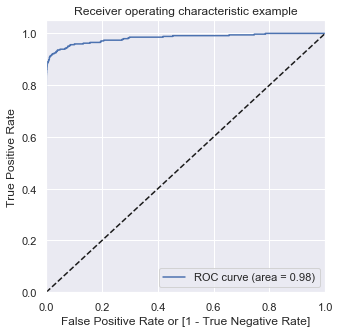

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000131,1,0,0,0,0,0,0,0,0,0
1,0,0.000139,1,0,0,0,0,0,0,0,0,0
2,0,0.000048,1,0,0,0,0,0,0,0,0,0
3,0,0.000160,1,0,0,0,0,0,0,0,0,0
4,0,0.001059,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999308  0.793605  0.999663  0.802941
0.2   0.2  0.999293  0.764535  0.999699  0.814241
0.3   0.3  0.999288  0.720930  0.999769  0.843537
0.4   0.4  0.999278  0.686047  0.999819  0.867647
0.5   0.5  0.999263  0.651163  0.999864  0.892430
0.6   0.6  0.999218  0.613372  0.999884  0.901709
0.7   0.7  0.999192  0.595930  0.999889  0.903084
0.8   0.8  0.999157  0.572674  0.999894  0.903670
0.9   0.9  0.999062  0.517442  0.999894  0.894472


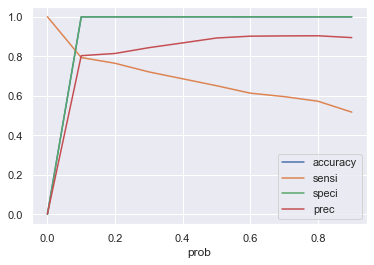

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7982456140350876


In [0]:
X_test_rfe_1 = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([2.70050950e-03, 4.87081618e-03, 7.64481349e-05, ...,
       4.70152079e-05, 5.80680517e-04, 1.34189730e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.99916903666772


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7483870967741936


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


In [0]:
# The scores have not improved much. Lets remove one more feature and see the possible changes in model performance.

In [0]:
colr

['V1',
 'V4',
 'V7',
 'V8',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V21',
 'V22']

In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr.remove('V22')


In [0]:
X_train_rfe_1 = X_train[colr]

In [0]:
X_train_sm = sm.add_constant(X_train_rfe_1)
lgr1 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([2.01315195e-04, 1.72270364e-04, 3.05101893e-05, ...,
       2.76481093e-04, 2.56499099e-04, 4.84140451e-04])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.000201
1,0,0.000172
2,0,0.000031
3,0,0.000160
4,0,0.000840


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

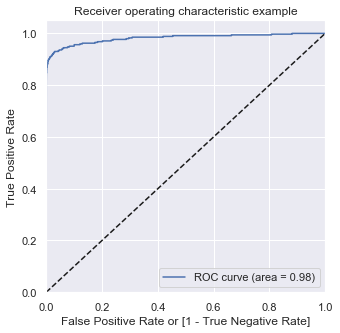

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. However, since data is inbalanced, will have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.000201,1,0,0,0,0,0,0,0,0,0
1,0,0.000172,1,0,0,0,0,0,0,0,0,0
2,0,0.000031,1,0,0,0,0,0,0,0,0,0
3,0,0.000160,1,0,0,0,0,0,0,0,0,0
4,0,0.000840,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.001725  1.000000  0.000000  0.001725
0.1   0.1  0.999288  0.796512  0.999638  0.791908
0.2   0.2  0.999278  0.758721  0.999693  0.810559
0.3   0.3  0.999223  0.712209  0.999719  0.813953
0.4   0.4  0.999253  0.677326  0.999809  0.859779
0.5   0.5  0.999233  0.645349  0.999844  0.877470
0.6   0.6  0.999218  0.613372  0.999884  0.901709
0.7   0.7  0.999192  0.593023  0.999894  0.906667
0.8   0.8  0.999142  0.563953  0.999894  0.902326
0.9   0.9  0.999032  0.500000  0.999894  0.891192


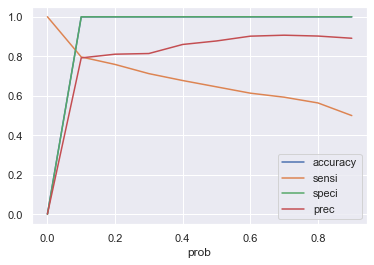

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that cutoff value of 0.1 is relatively ideal as both the 'precision' and 'recall' scores are about 80%. However, there's slight dip in precision and recall scores which means removing the feature 'V22' has reduced the performance slightly. Accuracy, here is great but as data is imbalanced, its not great metric in isolation 

In [0]:
y_train_pred_df['pred_Class_Value_0.1'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.1 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.1'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.7942028985507246


In [0]:
X_test_rfe_1 = X_test[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([2.50097159e-03, 5.29242404e-03, 5.04177418e-05, ...,
       5.26749986e-05, 4.03523427e-04, 2.30196726e-04])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.1'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.1 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.9991573329588147


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7435897435897436


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.1']))

0.7837837837837838


In [0]:
# Both train and test scores have dipped slightly after removing feature 'V22'. Therefore, it means that reducing features further (all of them have been ranked '1') will reduce the performance.
# So the final list of important features in the case of logistic model is as follows:
colr.append('V22')

In [0]:
print(colr)

['V1', 'V4', 'V7', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V21', 'V22']


In [0]:
# Will now proceed to other models with unbalanced data

# Decision Tree Classifier

In [0]:
from sklearn.tree import DecisionTreeClassifier
model_dtc=DecisionTreeClassifier(max_depth=5)
model_dtc.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [49]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [0]:
y_pred_train = model_dtc.predict(X_train)

In [0]:
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.96      0.83      0.89       344

    accuracy                           1.00    199364
   macro avg       0.98      0.92      0.95    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
y_pred=model_dtc.predict(X_test)

In [0]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.88      0.77      0.82       148

    accuracy                           1.00     85443
   macro avg       0.94      0.89      0.91     85443
weighted avg       1.00      1.00      1.00     85443



In [0]:
# test scores are with in 5 percent of train scores, so model is not overfitted on train data
# also model predicted 0's well but not performed that well on 1's may be due to class imbalance 
# lets see confusion matrix results


In [0]:
print(confusion_matrix(y_test,y_pred))

[[85280    15]
 [   34   114]]


In [0]:
from imblearn.metrics import sensitivity_specificity_support

Using TensorFlow backend.


In [0]:
print('{0:.2f}'.format(accuracy_score(y_test,y_pred)))

1.00


In [0]:
#Since the number of 1's are very less the zeros is pulling accuracy towards 100 percent.
# But we can see poor performance in precision and recall scores

In [0]:
# tuning Hyper Parameters

In [0]:
from sklearn.model_selection import KFold

In [0]:
kf=KFold(n_splits=5,random_state=60,shuffle=True)

In [0]:
# Tuning Hyperprameters
# intial max depth we considered is 5 which resulted in good scores so lets expreriment with depths from 6 to 10
#model depth
tree_depth=1
for train_index, test_index in kf.split(X_train):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_cv, y_test_cv = y_train.iloc[train_index], y_train.iloc[test_index]
    
    model_dtc=DecisionTreeClassifier(max_depth=tree_depth)
    model_dtc.fit(X_train_cv,y_train_cv)
    y_pred=model_dtc.predict(X_test_cv)
    print('for model depth of :', str(tree_depth),'classification scores are:\n',classification_report(y_pred,y_test_cv))
    tree_depth=tree_depth+1

TRAIN: [     0      1      2 ... 199360 199361 199362] TEST: [     4     12     22 ... 199334 199349 199363]
for model depth of : 1 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39818
           1       0.66      0.76      0.71        55

    accuracy                           1.00     39873
   macro avg       0.83      0.88      0.85     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     2      3      4 ... 199360 199362 199363] TEST: [     0      1      5 ... 199350 199355 199361]
for model depth of : 2 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39805
           1       0.74      0.81      0.77        68

    accuracy                           1.00     39873
   macro avg       0.87      0.90      0.89     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     0      1     

The best train scores are for model depth, 8 since it has good balance between precision and recall scores

In [0]:
# Tuning Hyperprameters
# Tuning max_features 
max_features=15


for train_index, test_index in kf.split(X_train):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_cv, y_test_cv = y_train.iloc[train_index], y_train.iloc[test_index]
    
    model_dtc=DecisionTreeClassifier(max_depth=4,max_features=max_features)
    model_dtc.fit(X_train_cv,y_train_cv)
    y_pred=model_dtc.predict(X_test_cv)
    print('for max_features :', str(max_features),'classification scores are:\n',classification_report(y_pred,y_test_cv))
    max_features=max_features+1

TRAIN: [     0      1      2 ... 199360 199361 199362] TEST: [     4     12     22 ... 199334 199349 199363]
for max_features : 15 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39818
           1       0.72      0.84      0.77        55

    accuracy                           1.00     39873
   macro avg       0.86      0.92      0.89     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     2      3      4 ... 199360 199362 199363] TEST: [     0      1      5 ... 199350 199355 199361]
for max_features : 16 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39815
           1       0.70      0.90      0.79        58

    accuracy                           1.00     39873
   macro avg       0.85      0.95      0.89     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     0      1      2

In [0]:
# we can see that for max_features 18 the precision score and recall value  is slightly improved
# Now we will tune min_smaples_leaf which will stop model from overfitting the defualt value is 1 

In [0]:
# Tuning Hyperprameters
# Tuning max_features 
min_samples_leaf=1
for train_index, test_index in kf.split(X_train):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train_cv, X_test_cv = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_cv, y_test_cv = y_train.iloc[train_index], y_train.iloc[test_index]
    
    model_dtc=DecisionTreeClassifier(max_depth=4,max_features=18,min_samples_leaf=1)
    model_dtc.fit(X_train_cv,y_train_cv)
    y_pred=model_dtc.predict(X_test_cv)
    print('for min_samples_leaf:', str(min_samples_leaf),'classification scores are:\n',classification_report(y_pred,y_test_cv))
    min_samples_leaf=min_samples_leaf+1

TRAIN: [     0      1      2 ... 199360 199361 199362] TEST: [     4     12     22 ... 199334 199349 199363]
for min_samples_leaf: 1 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39810
           1       0.78      0.79      0.79        63

    accuracy                           1.00     39873
   macro avg       0.89      0.90      0.89     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     2      3      4 ... 199360 199362 199363] TEST: [     0      1      5 ... 199350 199355 199361]
for min_samples_leaf: 2 classification scores are:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     39807
           1       0.74      0.83      0.79        66

    accuracy                           1.00     39873
   macro avg       0.87      0.92      0.89     39873
weighted avg       1.00      1.00      1.00     39873

TRAIN: [     0      1   

In [0]:
# Lets use Grid Search CV algorithm to find best set of parameters

In [0]:
# paramter space
param_grid={    'max_depth': range(1,6,2),
    'min_samples_leaf': range(1,50,25),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"] }
n_folds=5
dtree=DecisionTreeClassifier()
gcv=GridSearchCV(estimator=dtree,param_grid=param_grid,cv=n_folds,verbose=1)
gcv.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  5.5min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [0]:
print(gcv.best_estimator_)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [0]:
# we can see the best values are minimum of values we input , so lets try to see if we get better values less than these

In [0]:
# paramter space
param_grid={    'max_depth': range(1,6,2),
    'min_samples_leaf': range(1,51,25),
    'min_samples_split': range(1, 51, 25),
    'criterion': ["entropy", "gini"] }
n_folds=5
dtree=DecisionTreeClassifier()
gcv=GridSearchCV(estimator=dtree,param_grid=param_grid,cv=n_folds,verbose=1)
gcv.fit(X_train,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:  1.9min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [0]:
print(gcv.best_estimator_)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=26,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [0]:
# we can fix the max depth at 5 ,but lets see if we can find better  values for min_samples_leaf

In [0]:
# paramter space
param_grid={    'max_depth': range(1,6,2),
    'min_samples_leaf': range(1,25,10),
    'min_samples_split': range(26, 51, 10),
    'criterion': ["entropy", "gini"] }
n_folds=5
dtree=DecisionTreeClassifier()
gcv=GridSearchCV(estimator=dtree,param_grid=param_grid,cv=n_folds,verbose=1)
gcv.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  8.3min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [0]:
print(gcv.best_estimator_)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=26,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [0]:
# lets build the model with these hyper paramters
#max_depth=5
#min_samples_leaf=1
#min_samples_split=26
dtree=DecisionTreeClassifier(max_depth=5,min_samples_leaf=1,min_samples_split=26)
dtree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=26,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [0]:
y_pred_train=dtree.predict(X_train)

In [0]:
print(classification_report(y_pred_train,y_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199066
           1       0.83      0.96      0.89       298

    accuracy                           1.00    199364
   macro avg       0.92      0.98      0.95    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
y_test_pred=dtree.predict(X_test)

In [0]:
print(classification_report(y_test_pred,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85318
           1       0.75      0.89      0.81       125

    accuracy                           1.00     85443
   macro avg       0.87      0.94      0.91     85443
weighted avg       1.00      1.00      1.00     85443



# RandomForest Model

Will first check performance of untuned RandomForest model

In [0]:
rfc=RandomForestClassifier(class_weight="balanced") # for class imbalance





In [0]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199364 entries, 0 to 199363
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     19

In [0]:
rfc.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
# Making predictions
pred_train = rfc.predict(X_train)

In [0]:
# Let's check the report of our default model
print(classification_report(y_train,pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       1.00      1.00      1.00       344

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



The model showns all metrics as perfect which are characteristics of model being overfitted. Lets see the scores on test data set

In [0]:
pred_test = rfc.predict(X_test)

In [0]:
print(classification_report(y_test,pred_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.93      0.76      0.84       148

    accuracy                           1.00     85443
   macro avg       0.97      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



We can clearly see significant dip in metric scores such as F1, precision and recall which signifies model's suffering from overfitting. Will now tune the model using GridSearch and validate using K-fold as well

In [0]:
# Hyper parameter Tuning
# First will get the apt value of 'max_depth' 
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(10, 50, 5)}

# instantiate the base model
rf = RandomForestClassifier(class_weight="balanced")


# fit tree on training data
rfd = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfd.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                             

float64


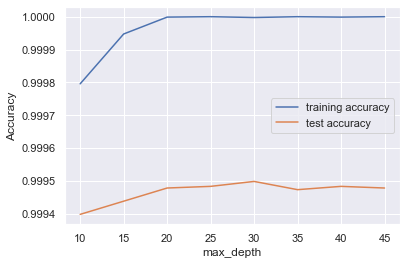

In [0]:
# scores of GridSearch CV
scores = rfd.cv_results_
print(scores["mean_train_score"].dtype)
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"],
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


We can see the 'max_depth' of 30 will give us the maximum test accuracy and the difference between test and train is least

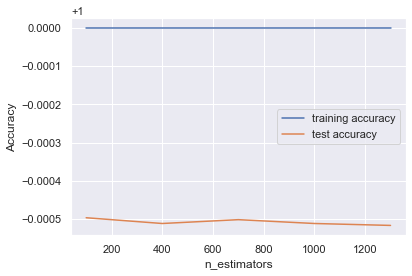

In [0]:
# GridSearchCV to find optimal n_estimators

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100,1500,300)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=30,class_weight="balanced")


# fit tree on training data
rfdn = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfdn.fit(X_train, y_train)
# scores of GridSearch CV
scores_de = pd.DataFrame(rfdn.cv_results_)
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

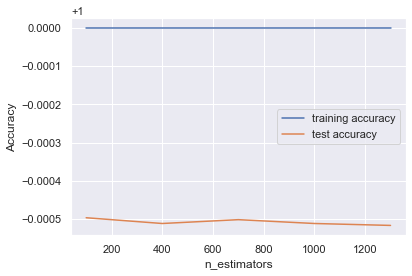

In [0]:
scores_de = pd.DataFrame(rfdn.cv_results_)
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores_de["param_n_estimators"], 
         scores_de["mean_train_score"], 
         label="training accuracy")
#plt.axis([min(scores["param_n_estimators"]), max(scores["param_n_estimators"]), min(["mean_train_score"]), max(["mean_train_score"])])
plt.plot(scores_de["param_n_estimators"], 
         scores_de["mean_test_score"], 
         label="test accuracy")
#plt.axis([min(scores["param_n_estimators"]), max(scores["param_n_estimators"]), min(["mean_test_score"]), max(["mean_test_score"])])
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [0]:
print(scores_de["mean_train_score"])
print(scores_de["param_n_estimators"])

0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: mean_train_score, dtype: float64
0     100
1     400
2     700
3    1000
4    1300
Name: param_n_estimators, dtype: object


In [0]:
print(scores_de["mean_test_score"])
print(scores_de["param_n_estimators"])

0    0.999503
1    0.999488
2    0.999498
3    0.999488
4    0.999483
Name: mean_test_score, dtype: float64
0     100
1     400
2     700
3    1000
4    1300
Name: param_n_estimators, dtype: object


In [0]:
# As per the analysis of results, will be selecting 'n_estimators' to be '100'

In [0]:
# tuning Max_features


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': range(5, 20, 2)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 100, class_weight="balanced")


# fit tree on training data
rfmx = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfmx.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=30,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              r

In [0]:
scores_mx = pd.DataFrame(rfmx.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [0]:
print(scores_mx["param_max_features"]) 
print(scores_mx["mean_train_score"]) 
         

0     5
1     7
2     9
3    11
4    13
5    15
6    17
7    19
Name: param_max_features, dtype: object
0    0.999997
1    0.999999
2    1.000000
3    1.000000
4    1.000000
5    1.000000
6    1.000000
7    1.000000
Name: mean_train_score, dtype: float64


In [0]:
print(scores_mx["param_max_features"]) 
print(scores_mx["mean_test_score"]) 


0     5
1     7
2     9
3    11
4    13
5    15
6    17
7    19
Name: param_max_features, dtype: object
0    0.999488
1    0.999473
2    0.999503
3    0.999483
4    0.999488
5    0.999468
6    0.999468
7    0.999478
Name: mean_test_score, dtype: float64


In [0]:
# We can see that max features of 5 or 7 gives the best result as after 7 features, there isn't any improvement. Will consider max features to be 9, so that model can be more generalised 

In [0]:
# tuning min_smaples_leaf


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 1200, 50)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 100, max_features = 7, class_weight="balanced")


# fit tree on training data
rfl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfl.fit(X_train, y_train)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=30,
                                              max_features=7,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random

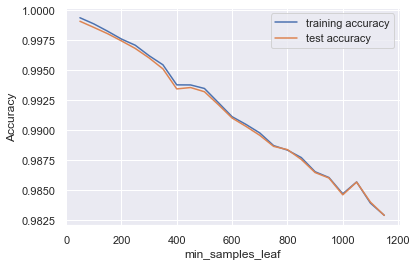

In [0]:
scores_l = pd.DataFrame(rfl.cv_results_)
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [0]:
print(scores_l["param_min_samples_leaf"])
print(scores_l["mean_train_score"])
         

0       50
1      100
2      150
3      200
4      250
5      300
6      350
7      400
8      450
9      500
10     550
11     600
12     650
13     700
14     750
15     800
16     850
17     900
18     950
19    1000
20    1050
21    1100
22    1150
Name: param_min_samples_leaf, dtype: object
0     0.999370
1     0.998860
2     0.998247
3     0.997592
4     0.997073
5     0.996199
6     0.995439
7     0.993763
8     0.993756
9     0.993462
10    0.992288
11    0.991102
12    0.990461
13    0.989746
14    0.988689
15    0.988312
16    0.987690
17    0.986503
18    0.986022
19    0.984662
20    0.985653
21    0.983881
22    0.982864
Name: mean_train_score, dtype: float64


In [0]:
print(scores_l["param_min_samples_leaf"])
print(scores_l["mean_test_score"])


0       50
1      100
2      150
3      200
4      250
5      300
6      350
7      400
8      450
9      500
10     550
11     600
12     650
13     700
14     750
15     800
16     850
17     900
18     950
19    1000
20    1050
21    1100
22    1150
Name: param_min_samples_leaf, dtype: object
0     0.999077
1     0.998565
2     0.998039
3     0.997437
4     0.996805
5     0.996012
6     0.995099
7     0.993424
8     0.993539
9     0.993188
10    0.992115
11    0.990991
12    0.990294
13    0.989547
14    0.988624
15    0.988353
16    0.987535
17    0.986437
18    0.985980
19    0.984576
20    0.985639
21    0.983964
22    0.982855
Name: mean_test_score, dtype: float64


In [0]:
# Considering the train and test accuracy scores, the ideal value of 'param_min_samples_leaf' is 650. As at this point, both test and train scores are still around 99 

In [0]:
# tuning min_samples_split


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 1200, 200)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 100, max_features = 7, min_samples_leaf = 650, class_weight="balanced")


# fit tree on training data
rfsl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfsl.fit(X_train, y_train)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=30,
                                              max_features=7,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=650,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rand

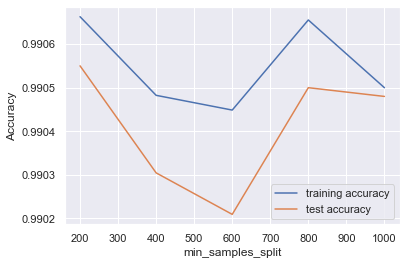

In [0]:
scores_sl = pd.DataFrame(rfsl.cv_results_)
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [0]:
# Will select 'min_samples_split' to be 800 as at this point, the train and test accuracy peaks again after dip from starting point of '200'. Also, model should be more generalised at this point with still great accuracy values for both test and train, around 99

In [0]:
# Following are therefore, the key hyper parameter tunned values:
1. min_samples_split: 800
2. min_samples_leaf:  650
3. max_features: 9
4. n_estimators: 100
5. max_depth: 30 

In [31]:
# Model with tuned parameters
rff=RandomForestClassifier(max_depth=30,n_estimators=100, min_samples_leaf = 650, min_samples_split = 800, max_features = 9, class_weight="balanced")
rff.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=30, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=650, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [32]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [33]:
predictions_train =rff.predict(X_train)

In [34]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    199020
           1       0.15      0.95      0.25       344

    accuracy                           0.99    199364
   macro avg       0.57      0.97      0.62    199364
weighted avg       1.00      0.99      0.99    199364



In [35]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9903292470054774


In [36]:
print(metrics.precision_score(y_train, predictions_train))

0.14642857142857144


In [37]:
print(metrics.recall_score(y_train, predictions_train))

0.9534883720930233


# The precision score is disappointingly low, 15% only while, the recall and accuracy scores are high at 95.6% and 99% respectively.
# Lets see the scores on test data set using the same model
# Note that the precision and recall scores being referred now are for class '1' label, as per the default setting. 
# The 'Macro' precision score is lot better and 'Weighted' preciosion score is great but considering the high data imbalance, the individual class '1' scores and 'Macro' need to be high as well.

In [39]:
predictions_test =rff.predict(X_test)

In [40]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     85295
           1       0.13      0.86      0.23       148

    accuracy                           0.99     85443
   macro avg       0.57      0.92      0.61     85443
weighted avg       1.00      0.99      0.99     85443



In [42]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9901337733927882


In [43]:
print(metrics.precision_score(y_test, predictions_test))

0.13382507903055849


In [44]:
print(metrics.recall_score(y_test, predictions_test))

0.8581081081081081


The test scores follow similar trend with high scores of accuracy and recall but low score for precision. The recall score is 86% for test which is high but quite lower to train recall score.
However, the low precision score of only 15% and 14% for train and test data means that we need to have a better model.

In [0]:
# Will now fit model with updated parameters of features, will take into consideration 11 features and n_estimators to be 150

In [0]:
# Model with further tuned parameters
rff1=RandomForestClassifier(max_depth=30,n_estimators=150, min_samples_leaf = 650, min_samples_split = 800, max_features = 11, class_weight="balanced")
rff1.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=30, max_features=11,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=650, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff1.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    199020
           1       0.15      0.96      0.25       344

    accuracy                           0.99    199364
   macro avg       0.57      0.97      0.62    199364
weighted avg       1.00      0.99      0.99    199364



In [0]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9902790874982444


In [0]:
print(metrics.precision_score(y_train, predictions_train))

0.1460923623445826


In [0]:
print(metrics.recall_score(y_train, predictions_train))

0.9563953488372093


In [0]:
# The precision score still has not improved. Will update other set of values now

In [0]:
# Model with further tuned parameters part-2
rff2=RandomForestClassifier(max_depth=30,n_estimators=250, min_samples_leaf = 650, min_samples_split = 1000, max_features = 11, class_weight="balanced")
rff2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=30, max_features=11,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=650, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=250,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff2.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    199020
           1       0.15      0.96      0.25       344

    accuracy                           0.99    199364
   macro avg       0.57      0.97      0.62    199364
weighted avg       1.00      0.99      0.99    199364



In [0]:
print(metrics.precision_score(y_train, predictions_train))

0.14700625558534405


In [0]:
print(metrics.recall_score(y_train, predictions_train))

0.9563953488372093


In [0]:
# The precision score still has not improved much. Will try one more tuned version of model and then proceed to next model. The precison result should be markedly better when we try with balanced dataset

In [0]:
# Model with further tuned parameters part-3
rff3=RandomForestClassifier(max_depth=35,n_estimators=500, min_samples_split = 1000, max_features = 9, class_weight="balanced")
rff3.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=35, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff3.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.32      0.97      0.48       344

    accuracy                           1.00    199364
   macro avg       0.66      0.99      0.74    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
print(metrics.precision_score(y_train, predictions_train))

0.31844106463878324


In [0]:
print(metrics.recall_score(y_train, predictions_train))

0.9738372093023255


In [0]:
# The model has definitely performed better with precision score almost doubling. Lets check how this model performs on test data set

In [0]:
predictions_test =rff3.predict(X_test)

In [0]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.29      0.86      0.43       148

    accuracy                           1.00     85443
   macro avg       0.65      0.93      0.72     85443
weighted avg       1.00      1.00      1.00     85443



In [0]:
print(metrics.precision_score(y_test, predictions_test))

0.29128440366972475


In [0]:
print(metrics.recall_score(y_test, predictions_test))

0.8581081081081081


In [0]:
# The precision score for test dataset also increased. Therefore, the updated parameters this time did improve model. Will try and optimize model further 

In [0]:
# Model with further tuned parameters part-4
rff4=RandomForestClassifier(max_depth=40,n_estimators=550, min_samples_split = 1000, max_features = 9, class_weight="balanced")
rff4.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=40, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=550,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
print(metrics.precision_score(y_train, predictions_train))

0.31844106463878324


In [0]:
print(metrics.recall_score(y_train, predictions_train))

0.9738372093023255


In [0]:
# Test data set scores
predictions_test =rff4.predict(X_test)

In [0]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.28      0.86      0.42       148

    accuracy                           1.00     85443
   macro avg       0.64      0.93      0.71     85443
weighted avg       1.00      1.00      1.00     85443



In [0]:
print(metrics.precision_score(y_test, predictions_test))

0.27729257641921395


In [0]:
print(metrics.recall_score(y_test, predictions_test))

0.8581081081081081


In [0]:
# The scores have not improved from previous model. Will try one more model and then move to another model in case not improvement is observed in precision score

In [0]:
# Model with further tuned parameters part-5
rff5=RandomForestClassifier(max_depth=40,n_estimators=650, min_samples_split = 1100, max_features = 9, class_weight="balanced")
rff5.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=40, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1100,
                       min_weight_fraction_leaf=0.0, n_estimators=650,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff5.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.28      0.97      0.43       344

    accuracy                           1.00    199364
   macro avg       0.64      0.98      0.72    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
# The precision score has fallen below the best model yet. Will try another set of models

In [0]:
# Model with further tuned parameters part-6
rff6=RandomForestClassifier(max_depth=25,n_estimators=600, min_samples_split = 1000, max_features = 9, class_weight="balanced")
rff6.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=25, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff6.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.31      0.97      0.47       344

    accuracy                           1.00    199364
   macro avg       0.66      0.98      0.73    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
predictions_test =rff6.predict(X_test)

In [0]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.28      0.86      0.42       148

    accuracy                           1.00     85443
   macro avg       0.64      0.93      0.71     85443
weighted avg       1.00      1.00      1.00     85443



In [0]:
# Model with further tuned parameters part-7
rff7=RandomForestClassifier(max_depth=30,n_estimators=600, min_samples_split = 1000, max_features = 9, class_weight="balanced")
rff7.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=30, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff7.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.30      0.97      0.46       344

    accuracy                           1.00    199364
   macro avg       0.65      0.98      0.73    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
predictions_test =rff7.predict(X_test)

In [0]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.28      0.86      0.42       148

    accuracy                           1.00     85443
   macro avg       0.64      0.93      0.71     85443
weighted avg       1.00      1.00      1.00     85443



In [0]:
# Model with further tuned parameters part-8. This will be the last model and then the best will be selected
rff8=RandomForestClassifier(max_depth=35,n_estimators=700, min_samples_split = 1000, max_features = 9, class_weight="balanced")
rff8.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=35, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=700,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
predictions_train =rff8.predict(X_train)

In [0]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       0.32      0.97      0.48       344

    accuracy                           1.00    199364
   macro avg       0.66      0.99      0.74    199364
weighted avg       1.00      1.00      1.00    199364



In [0]:
predictions_test =rff8.predict(X_test)

In [0]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.29      0.86      0.43       148

    accuracy                           1.00     85443
   macro avg       0.64      0.93      0.72     85443
weighted avg       1.00      1.00      1.00     85443



The above model gives the best label-'1' based preciosion score for both train and test data set, being 32% and 29% respectively. The 'macro' precision scores are highest too with train being at 66% and test being at 64%.
The recall scores are consistent with train score being at 97% and test score being at 86%.
The precision label -'1' based score needs to be better so will be aiming for better scores on balanced data. 
The above model though is the best for unbalanced data set

# Highlighting the top features (9 being the most important ones)

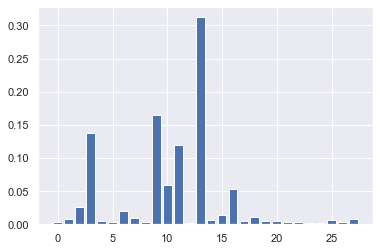

In [0]:
# plot
plt.bar(range(len(rff8.feature_importances_)), rff8.feature_importances_)
plt.show()

In [0]:
imp_features = rff8.feature_importances_

In [0]:
imp_features.transpose()

array([0.00328783, 0.00751931, 0.02555213, 0.13819271, 0.00545624,
       0.00363608, 0.01959313, 0.0092649 , 0.00324334, 0.16494596,
       0.05860484, 0.11981207, 0.00261023, 0.31244155, 0.00646426,
       0.01387463, 0.05303728, 0.00454433, 0.01039989, 0.00495256,
       0.00476638, 0.00364678, 0.00289276, 0.00245686, 0.00256614,
       0.00576977, 0.00291081, 0.00755722])

In [0]:
colf = X_train.columns

In [0]:
imp_features.shape

(28,)

In [0]:
imp_ft_dat = pd.DataFrame(data = imp_features, index = colf)

In [0]:
imp_ft_dat.head()

,0
V1,0.003288
V2,0.007519
V3,0.025552
V4,0.138193
V5,0.005456


In [0]:
imp_ft_dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28 entries, V1 to Amount
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       28 non-null     float64
dtypes: float64(1)
memory usage: 1.7+ KB


In [0]:
imp_ft_dat.sort_values(by = 0, ascending = False, inplace = True)

In [0]:
# Highlighting top 9 features
imp_ft_dat.head(9)

,0
V14,0.312442
V10,0.164946
V4,0.138193
V12,0.119812
V11,0.058605
V17,0.053037
V3,0.025552
V7,0.019593
V16,0.013875


In [0]:
# As per the above dataframe, the top 9 features, also considered for modeling are:
'V14', 'V10', 'V4', 'V12', 'V11', 'V17', 'V3', 'V7' and 'V16'

# Model analysis with balanced data

Will use overfitting smapling technique and then SMOTE, one of the synthetic data balancing technique to assess the performance of the same models

In [45]:
# Will use oversampling first as dataset is not that big. Also, sampling is being done after train-test split
from sklearn.utils import resample

In [46]:
print(col)

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')


In [47]:
# Will split the data between train and test data set without 'stratify' as will be changing the proportion of 'class' anyways by using balancing techniques
col = df.columns
col = col.drop('Class')
y = df['Class']
X = df[col]

In [18]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

In [14]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,149.62
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,2.69
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,378.66
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,123.50
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,69.99


In [19]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Class, dtype: int64

In [48]:
X_train_up, X_test_up, y_train_up, y_test_up = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [49]:
# Transforming the amount using PCA method
st = StandardScaler()

In [50]:
X_train_up.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 7610 to 56088
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [51]:
cola = ['Amount']

In [52]:
X_train_up[cola] = st.fit_transform(X_train_up[cola])

In [53]:
X_test_up[cola] = st.transform(X_test_up[cola])

In [54]:
colp

['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [55]:
X_train_up[colp] = pt.fit_transform(X_train_up[colp])

In [56]:
X_test_up[colp] = pt.fit_transform(X_test_up[colp])

In [57]:
X_train_up.index = pd.RangeIndex(0, len(X_train_up.index))
y_train_up.index = pd.RangeIndex(0, len(y_train_up.index))

In [58]:
X_test_up.index = pd.RangeIndex(0, len(X_test_up.index))
y_test_up.index = pd.RangeIndex(0, len(y_test_up.index))

In [59]:
X_train_up.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,0.598470,0.010653,0.731921,0.017924,-0.204162,0.345395,-0.503116,0.053042,1.279474,-0.468132,3.021936,-1.044975,2.523534,1.642896,0.192412,-0.059052,0.630296,-0.664479,-0.614659,-0.109200,-0.217742,-0.142183,0.229615,-0.518220,-0.052688,0.904879,-0.061990,-1.066222
1,1.445565,-0.078678,-1.233161,0.208193,0.187539,-0.409005,0.102048,-0.252318,0.245017,0.257359,0.610062,1.546125,0.521753,0.351972,-0.765034,0.208449,-0.738125,-0.275378,0.612126,-0.169517,-0.355324,-0.636424,0.418801,-0.841362,-0.249245,0.206509,-0.072079,-1.029305
2,0.843049,-1.560173,-0.783968,-1.919788,0.578638,2.278265,-1.814737,0.853644,-1.680052,1.315947,-0.311041,-1.117650,0.620637,-0.406962,1.139137,0.189104,-0.129896,0.835635,-0.120798,-0.068984,-0.009865,0.089320,-0.203779,1.917859,0.510411,-0.038200,0.047306,0.700423
3,-0.326321,1.235492,-0.312905,-0.296532,0.699869,-0.805682,0.964615,-0.185940,0.082123,-0.479100,-0.183169,0.007221,0.112076,-1.092514,-0.307278,0.111046,0.566802,-0.491726,-0.501441,0.135098,-0.457294,-0.734681,0.252022,1.861162,-0.439226,0.093359,0.332998,-1.043594
4,0.566536,-0.093882,0.988880,0.445581,-0.769281,0.053504,-0.575773,0.184401,0.235960,0.107031,1.635221,0.577842,-0.843761,0.467763,1.052225,0.460752,-0.391411,-0.042388,-0.463772,-0.170440,0.013937,-0.052800,0.225649,0.287704,0.000863,0.215796,0.000743,-0.865909


In [60]:
# concatenate our training data back together
X = pd.concat([X_train_up, y_train_up], axis=1)

# separate minority and majority classes
not_fraud = X[X.Class==0]
fraud = X[X.Class==1]

In [0]:
# upsample minority
fraud_upsampled = resample(fraud,
                          replace=True, # sample with replacement
                          n_samples=int(len(not_fraud)*0.8), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
X_up = pd.concat([not_fraud, fraud_upsampled])

In [0]:
round(100*(X_up.Class.value_counts()/len(X_up.index)),2)

0    55.56
1    44.44
Name: Class, dtype: float64

In [0]:
# We can see data is balanced now. Will start with modeling exercize now

In [0]:
y_train_up = X_up.Class
X_train_up = X_up.drop('Class', axis=1)

In [0]:
# Heat maps to understand correlation now in balanced data

In [0]:
print(col)

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')


In [0]:
col2 = col.drop('Amount')

In [0]:
# Preparing three sets of features for plotting heat maps
colx = []
coly = []
colz = []
for i in col2:
    if int(i[1:]) <= 9:
        colx.append(i)
    elif int(i[1:]) > 9 and int(i[1:]) <= 18:
        coly.append(i)
    elif int(i[1:]) > 18 and int(i[1:]) <= 27:
        colz.append(i)

In [0]:
colx.append('Class')
coly.append('Class')
colz.append('Class')

In [0]:
colz.append('Amount')

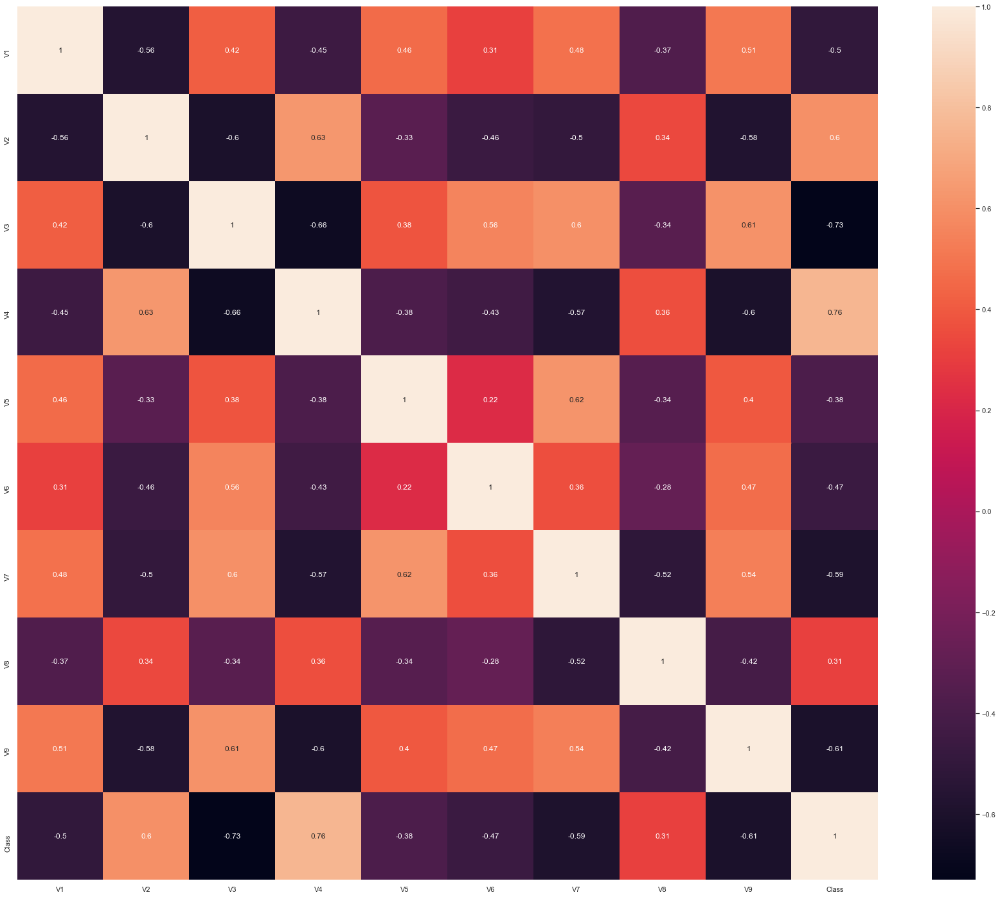

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(X_up[colx].corr('spearman'), annot = True)
plt.show()

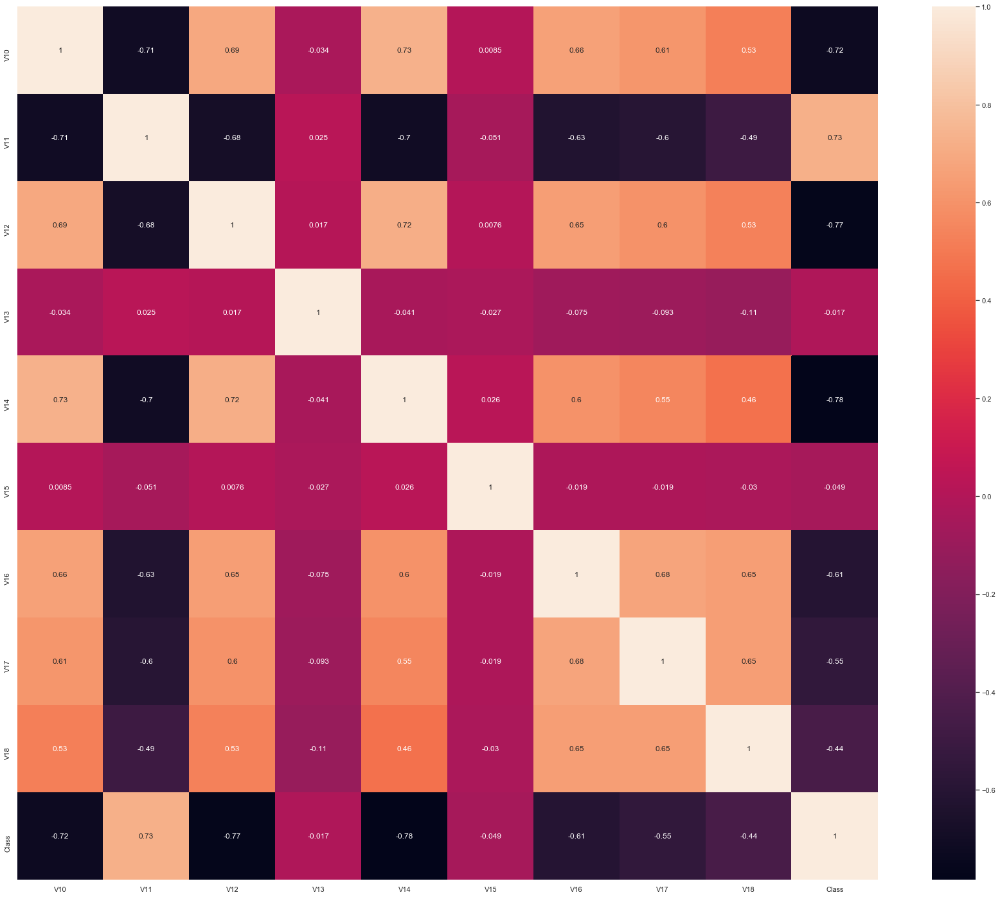

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(X_up[coly].corr('spearman'), annot = True)
plt.show()

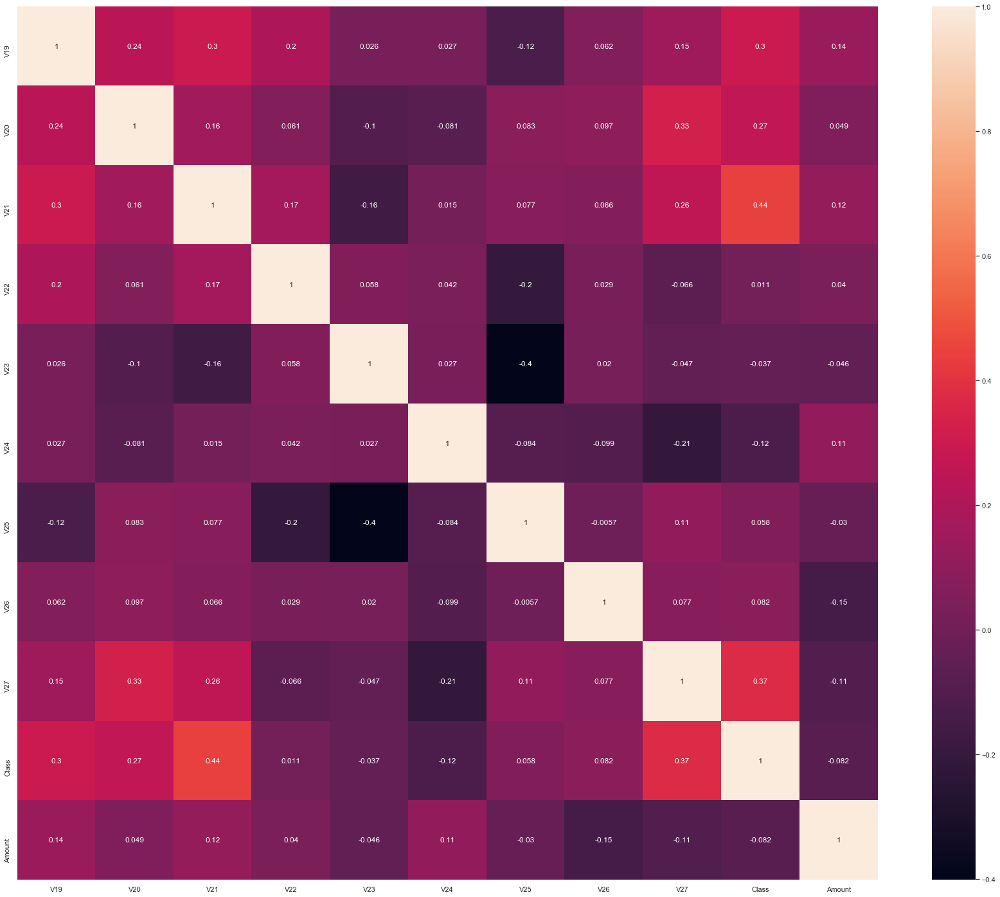

In [0]:
plt.figure(figsize = [30,25])
sns.heatmap(X_up[colz].corr('spearman'), annot = True)
plt.show()

From the above heat maps, we can, if needed, remove following features as they have really low correlation values with 'Class' feature
Features that can be removed: 'V6', 'V19', 'V20', 'V21', 'V22', V23', 'V24', 'V25', 'V26', 'V27', 'V13', 'V15', 'V5', 'V8', 'V18'. However, will use first RFE to shortlist top 14 features and then run the model again by removing more lower importance feature to see if it improves the model
This exercise will only be done for logistic regression model as for other models, we have 'Number of parameters' as important hyperparameter that can be tuned 

# Logistic Model with balanced data using 'Oversampling'

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 14)
rfe = rfe.fit(X_train_up, y_train_up)

In [0]:
list(zip(X_train_up.columns, rfe.support_, rfe.ranking_))

[('V1', False, 6),
 ('V2', False, 11),
 ('V3', False, 4),
 ('V4', True, 1),
 ('V5', False, 8),
 ('V6', True, 1),
 ('V7', False, 14),
 ('V8', True, 1),
 ('V9', True, 1),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', True, 1),
 ('V16', True, 1),
 ('V17', True, 1),
 ('V18', False, 7),
 ('V19', False, 5),
 ('V20', False, 13),
 ('V21', False, 9),
 ('V22', False, 3),
 ('V23', False, 15),
 ('V24', False, 12),
 ('V25', False, 10),
 ('V26', False, 2),
 ('V27', True, 1),
 ('Amount', True, 1)]

In [0]:
colr = X_train_up.columns[rfe.support_]

In [0]:
X_train_rfe_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred[:10]

0    0.018685
1    0.007558
2    0.001149
3    0.052149
4    0.022867
5    0.052393
6    0.082566
7    0.008487
8    0.000953
9    0.036321
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.0186853 , 0.00755778, 0.00114915, 0.05214929, 0.02286699,
       0.05239268, 0.08256643, 0.00848748, 0.00095335, 0.03632067])

In [0]:
y_train_pred.reshape(-1)

array([0.0186853 , 0.00755778, 0.00114915, ..., 0.99999999, 0.99999875,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.018685
1,0,0.007558
2,0,0.001149
3,0,0.052149
4,0,0.022867


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

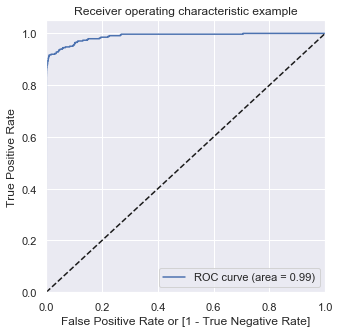

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.018685,1,0,0,0,0,0,0,0,0,0
1,0,0.007558,1,0,0,0,0,0,0,0,0,0
2,0,0.001149,1,0,0,0,0,0,0,0,0,0
3,0,0.052149,1,0,0,0,0,0,0,0,0,0
4,0,0.022867,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.444444  1.000000  0.000000  0.444444
0.1   0.1  0.903002  0.979398  0.841885  0.832085
0.2   0.2  0.935982  0.947774  0.926548  0.911681
0.3   0.3  0.944644  0.928121  0.957862  0.946296
0.4   0.4  0.949716  0.919528  0.973866  0.965693
0.5   0.5  0.953365  0.916765  0.982644  0.976883
0.6   0.6  0.956368  0.916765  0.988051  0.983969
0.7   0.7  0.953244  0.905547  0.991403  0.988272
0.8   0.8  0.949521  0.893826  0.994076  0.991783
0.9   0.9  0.941202  0.870945  0.997407  0.996293


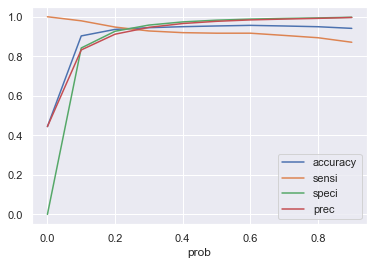

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9371202800573306


In [0]:
colr

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'V17', 'V27', 'Amount'],
      dtype='object')

In [0]:
X_test_rfe = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.00931205, 0.04931668, 0.05009261, ..., 0.02549631, 0.04171842,
       0.00062472])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9560993878960242


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.033600413543551304


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9154929577464789


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to remarkebly low value, i.e., just 3.4%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.06482174021441038


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 6.5%. This is severe case of overfitting and clearly adding feature another feature was not a good idea. Will start reducing features now to over come the issue of overfitting 

In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'V17', 'V27', 'Amount'],
      dtype='object')


In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr = colr.drop('V27')


In [0]:
X_train_rfe_1_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_1_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([0.01875126, 0.00782615, 0.00105245, ..., 0.99999999, 0.99999813,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.018751
1,0,0.007826
2,0,0.001052
3,0,0.046059
4,0,0.023063


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

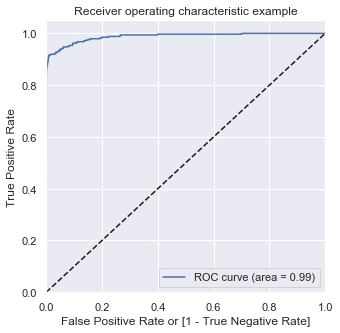

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent again. 

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.018751,1,0,0,0,0,0,0,0,0,0
1,0,0.007826,1,0,0,0,0,0,0,0,0,0
2,0,0.001052,1,0,0,0,0,0,0,0,0,0
3,0,0.046059,1,0,0,0,0,0,0,0,0,0
4,0,0.023063,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.444444  1.000000  0.000000  0.444444
0.1   0.1  0.902556  0.979398  0.841082  0.831375
0.2   0.2  0.935582  0.947774  0.925829  0.910894
0.3   0.3  0.945721  0.930796  0.957661  0.946201
0.4   0.4  0.949688  0.919528  0.973816  0.965629
0.5   0.5  0.954732  0.919528  0.982896  0.977277
0.6   0.6  0.956438  0.916765  0.988177  0.984135
0.7   0.7  0.953337  0.905547  0.991568  0.988495
0.8   0.8  0.948356  0.891006  0.994237  0.991979
0.9   0.9  0.941272  0.870945  0.997533  0.996472


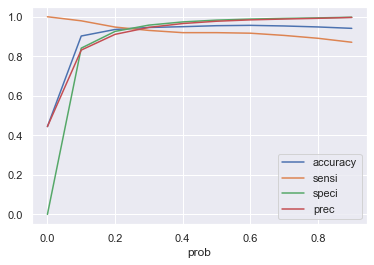

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is again relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario.  

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9384352341449513


In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'V17', 'Amount'],
      dtype='object')


In [0]:
X_test_rfe_1 = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.0089345 , 0.04858775, 0.05195036, ..., 0.01855945, 0.04150518,
       0.00062087])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.955795091464485


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.03337612323491656


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9154929577464789


In [0]:
prtr = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rectr = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.0644042605895467


In [0]:
# The test F1 and precision scores have not improved much model is still overfitted.  Lets remove more features and see the possible changes in model performance.

In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'Amount'],
      dtype='object')


In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr = colr.drop('Amount')


In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15',
       'V16'],
      dtype='object')


In [0]:
X_train_rfe_1_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_1_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([0.02539561, 0.00907746, 0.0012473 , ..., 0.99999966, 0.99995886,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.025396
1,0,0.009077
2,0,0.001247
3,0,0.060050
4,0,0.027706


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

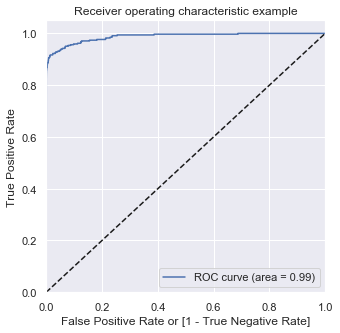

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent again. 

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.025396,1,0,0,0,0,0,0,0,0,0
1,0,0.009077,1,0,0,0,0,0,0,0,0,0
2,0,0.001247,1,0,0,0,0,0,0,0,0,0
3,0,0.060050,1,0,0,0,0,0,0,0,0,0
4,0,0.027706,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.444444  1.000000  0.000000  0.444444
0.1   0.1  0.898634  0.973789  0.838509  0.828296
0.2   0.2  0.936638  0.950537  0.925518  0.910790
0.3   0.3  0.945305  0.930809  0.956903  0.945290
0.4   0.4  0.950696  0.922380  0.973349  0.965141
0.5   0.5  0.953205  0.916765  0.982358  0.976510
0.6   0.6  0.952287  0.908084  0.987649  0.983283
0.7   0.7  0.953108  0.905446  0.991237  0.988047
0.8   0.8  0.946807  0.887866  0.993960  0.991568
0.9   0.9  0.939717  0.868118  0.996995  0.995692


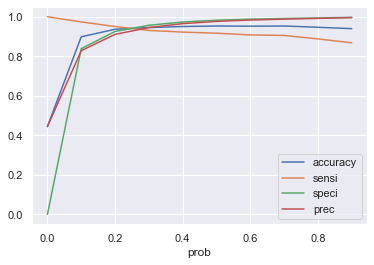

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is again relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 94%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario.  

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9379934996502977


In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15',
       'V16'],
      dtype='object')


In [0]:
X_test_rfe_1 = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.01475976, 0.09006398, 0.04004036, ..., 0.01070834, 0.04949533,
       0.00068074])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9553035356904603


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.03278271918678526


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9084507042253521


In [0]:
prtr = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rectr = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.06461232604373758


In [0]:
# The test F1 and precision scores have not improved much model is still overfitted.  Lets remove more features and see the possible changes in model performance.

In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'Amount'],
      dtype='object')


In [0]:
# Will now drop a single feature and see if it improves the scores, features being removed will be wrt the 'least correlated features'
colr = colr.drop('V17')


In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'Amount'],
      dtype='object')


In [0]:
X_train_rfe_1_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_1_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred.reshape(-1)

array([0.01922822, 0.00699832, 0.00146944, ..., 0.99999969, 0.99996903,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.019228
1,0,0.006998
2,0,0.001469
3,0,0.045674
4,0,0.021726


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

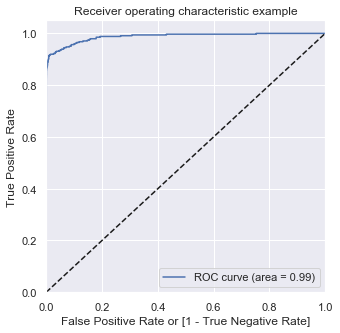

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent again. 

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.019228,1,0,0,0,0,0,0,0,0,0
1,0,0.006998,1,0,0,0,0,0,0,0,0,0
2,0,0.001469,1,0,0,0,0,0,0,0,0,0
3,0,0.045674,1,0,0,0,0,0,0,0,0,0
4,0,0.021726,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.444444  1.000000  0.000000  0.444444
0.1   0.1  0.902271  0.979398  0.840569  0.830923
0.2   0.2  0.935945  0.947774  0.926483  0.911610
0.3   0.3  0.945724  0.930966  0.957531  0.946053
0.4   0.4  0.950682  0.922443  0.973273  0.965048
0.5   0.5  0.954481  0.919528  0.982443  0.976690
0.6   0.6  0.956301  0.916765  0.987930  0.983810
0.7   0.7  0.951782  0.902463  0.991237  0.988008
0.8   0.8  0.946793  0.887922  0.993890  0.991472
0.9   0.9  0.941202  0.870976  0.997382  0.996257


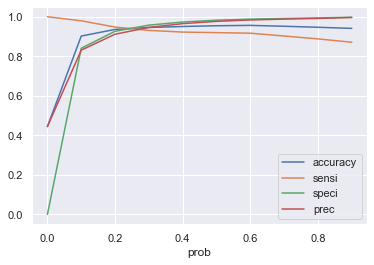

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is again relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 94%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario.  

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9384487294346324


In [0]:
print(colr)

Index(['V4', 'V6', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'Amount'],
      dtype='object')


In [0]:
X_test_rfe_1 = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe_1)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.00962487, 0.06602533, 0.05949181, ..., 0.02041803, 0.03546628,
       0.00070718])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9559472396802546


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.033487892838742914


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9154929577464789


In [0]:
prtr = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rectr = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.06461232604373758


In [0]:
# The test F1 and precision scores have not improved much model is still overfitted.  The strategy of removing single feature at a time is not working. 
# Will use RFE now to select '8' best features and then see the performance

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 8 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 8)
rfe = rfe.fit(X_train_up, y_train_up)

In [0]:
list(zip(X_train_up.columns, rfe.support_, rfe.ranking_))

[('V1', False, 12),
 ('V2', False, 17),
 ('V3', False, 10),
 ('V4', True, 1),
 ('V5', False, 14),
 ('V6', False, 5),
 ('V7', False, 20),
 ('V8', True, 1),
 ('V9', False, 7),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', False, 3),
 ('V14', True, 1),
 ('V15', False, 6),
 ('V16', True, 1),
 ('V17', False, 2),
 ('V18', False, 13),
 ('V19', False, 11),
 ('V20', False, 19),
 ('V21', False, 15),
 ('V22', False, 9),
 ('V23', False, 21),
 ('V24', False, 18),
 ('V25', False, 16),
 ('V26', False, 8),
 ('V27', True, 1),
 ('Amount', False, 4)]

In [0]:
colr = X_train_up.columns[rfe.support_]

In [0]:
X_train_rfe_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred[:10]

0    0.067223
1    0.009994
2    0.002517
3    0.064615
4    0.032389
5    0.049404
6    0.135621
7    0.010879
8    0.001578
9    0.053264
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.06722259, 0.00999373, 0.00251736, 0.06461464, 0.03238867,
       0.0494044 , 0.13562061, 0.01087923, 0.0015784 , 0.05326356])

In [0]:
y_train_pred.reshape(-1)

array([0.06722259, 0.00999373, 0.00251736, ..., 0.99999936, 0.99993814,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.067223
1,0,0.009994
2,0,0.002517
3,0,0.064615
4,0,0.032389


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

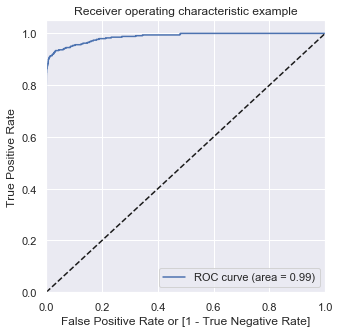

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.067223,1,0,0,0,0,0,0,0,0,0
1,0,0.009994,1,0,0,0,0,0,0,0,0,0
2,0,0.002517,1,0,0,0,0,0,0,0,0,0
3,0,0.064615,1,0,0,0,0,0,0,0,0,0
4,0,0.032389,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.444444  1.000000  0.000000  0.444444
0.1   0.1  0.897093  0.970932  0.838021  0.827448
0.2   0.2  0.936166  0.945299  0.928859  0.914017
0.3   0.3  0.948066  0.933635  0.959611  0.948699
0.4   0.4  0.950724  0.922373  0.973404  0.965211
0.5   0.5  0.951620  0.913681  0.981971  0.975929
0.6   0.6  0.953479  0.910904  0.987539  0.983187
0.7   0.7  0.950216  0.899668  0.990654  0.987181
0.8   0.8  0.945121  0.885159  0.993091  0.990337
0.9   0.9  0.939789  0.868118  0.997126  0.995879


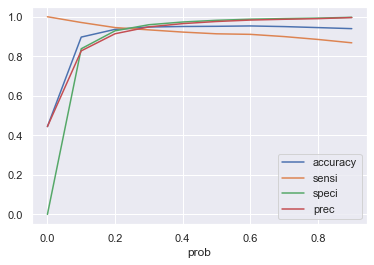

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.941106826973605


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V14', 'V16', 'V27'], dtype='object')

In [0]:
X_test_rfe = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.02680118, 0.2129074 , 0.0376707 , ..., 0.01437583, 0.08345162,
       0.00272606])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9578432405229217


In [0]:
metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.0341949380721594


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8943661971830986


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to remarkebly low value, i.e., just 3.4%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.06482174021441038


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 6.5%. Since reducing features to '8' has also not improved the score, will change the percentage of oversampling the data

In [61]:
# upsample minority
fraud_upsampled = resample(fraud,
                          replace=True, # sample with replacement
                          n_samples=int(len(not_fraud)*0.6), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
X_up = pd.concat([not_fraud, fraud_upsampled])

In [62]:
round(100*(X_up.Class.value_counts()/len(X_up.index)),2)

0    62.5
1    37.5
Name: Class, dtype: float64

In [0]:
# We can see data is balanced now. Will start with modeling exercize now

In [63]:
y_train_up = X_up.Class
X_train_up = X_up.drop('Class', axis=1)

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 14)
rfe = rfe.fit(X_train_up, y_train_up)

In [0]:
list(zip(X_train_up.columns, rfe.support_, rfe.ranking_))

[('V1', False, 6),
 ('V2', False, 11),
 ('V3', False, 4),
 ('V4', True, 1),
 ('V5', False, 8),
 ('V6', False, 2),
 ('V7', False, 12),
 ('V8', True, 1),
 ('V9', False, 3),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', True, 1),
 ('V16', True, 1),
 ('V17', True, 1),
 ('V18', False, 7),
 ('V19', False, 5),
 ('V20', False, 15),
 ('V21', False, 9),
 ('V22', True, 1),
 ('V23', False, 14),
 ('V24', False, 13),
 ('V25', False, 10),
 ('V26', True, 1),
 ('V27', True, 1),
 ('Amount', True, 1)]

In [0]:
colr = X_train_up.columns[rfe.support_]

In [0]:
X_train_rfe_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred[:10]

0    0.014988
1    0.004545
2    0.001272
3    0.029245
4    0.019561
5    0.023341
6    0.065213
7    0.006409
8    0.001001
9    0.064782
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.01498805, 0.0045454 , 0.00127219, 0.02924481, 0.01956055,
       0.0233413 , 0.06521274, 0.00640918, 0.00100064, 0.06478228])

In [0]:
y_train_pred.reshape(-1)

array([0.01498805, 0.0045454 , 0.00127219, ..., 0.61350687, 0.99999836,
       0.99955539])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.014988
1,0,0.004545
2,0,0.001272
3,0,0.029245
4,0,0.019561


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

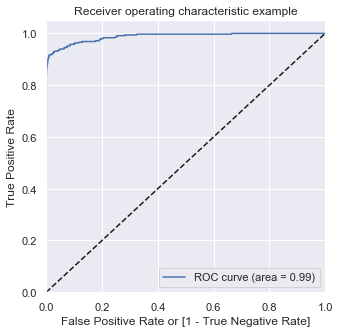

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.014988,1,0,0,0,0,0,0,0,0,0
1,0,0.004545,1,0,0,0,0,0,0,0,0,0
2,0,0.001272,1,0,0,0,0,0,0,0,0,0
3,0,0.029245,1,0,0,0,0,0,0,0,0,0
4,0,0.019561,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.908697  0.965748  0.874466  0.821933
0.2   0.2  0.942897  0.939694  0.944818  0.910852
0.3   0.3  0.955264  0.931311  0.969635  0.948460
0.4   0.4  0.958062  0.919955  0.980926  0.966598
0.5   0.5  0.960848  0.917175  0.987051  0.977011
0.6   0.6  0.960873  0.911405  0.990553  0.983019
0.7   0.7  0.958401  0.900099  0.993382  0.987895
0.8   0.8  0.952459  0.879346  0.996327  0.993086
0.9   0.9  0.946138  0.859113  0.998352  0.996813


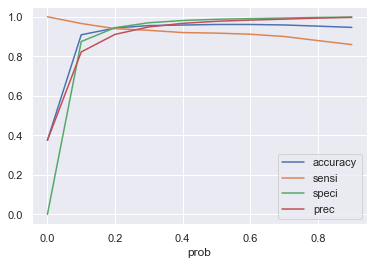

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 94% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9398074005839675


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17',
       'V22', 'V26', 'V27', 'Amount'],
      dtype='object')

In [0]:
X_test_rfe = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.01709747, 0.08025656, 0.03572237, ..., 0.01884927, 0.03138992,
       0.00129036])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9680722821061994


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.04471830985915493


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8943661971830986


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to still, remarkebly low value, i.e., just 4.5%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.08517773306505702


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 8.5%. This is better than previous oversampling percentage but its still a severe case of overfitting. Will now check with RFE with features 10 and 7 and see if overfitting can be reduced 

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 10)
rfe = rfe.fit(X_train_up, y_train_up)

In [0]:
list(zip(X_train_up.columns, rfe.support_, rfe.ranking_))

[('V1', False, 10),
 ('V2', False, 15),
 ('V3', False, 8),
 ('V4', True, 1),
 ('V5', False, 12),
 ('V6', False, 6),
 ('V7', False, 16),
 ('V8', True, 1),
 ('V9', False, 7),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', False, 5),
 ('V16', True, 1),
 ('V17', True, 1),
 ('V18', False, 11),
 ('V19', False, 9),
 ('V20', False, 19),
 ('V21', False, 13),
 ('V22', False, 3),
 ('V23', False, 18),
 ('V24', False, 17),
 ('V25', False, 14),
 ('V26', False, 2),
 ('V27', True, 1),
 ('Amount', False, 4)]

In [0]:
colr = X_train_up.columns[rfe.support_]

In [0]:
X_train_rfe_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred[:10]

0    0.025038
1    0.006565
2    0.001061
3    0.040180
4    0.031335
5    0.023520
6    0.084165
7    0.007620
8    0.000813
9    0.070958
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.02503824, 0.006565  , 0.00106146, 0.04017972, 0.03133538,
       0.02351974, 0.08416546, 0.00761983, 0.0008129 , 0.07095819])

In [0]:
y_train_pred.reshape(-1)

array([0.02503824, 0.006565  , 0.00106146, ..., 0.56414209, 0.99999854,
       0.99985389])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.025038
1,0,0.006565
2,0,0.001061
3,0,0.040180
4,0,0.031335


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

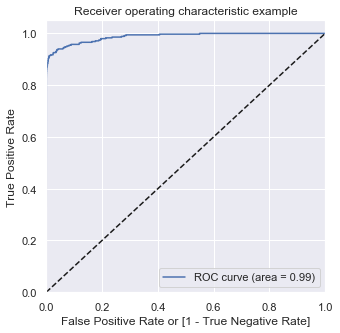

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.025038,1,0,0,0,0,0,0,0,0,0
1,0,0.006565,1,0,0,0,0,0,0,0,0,0
2,0,0.001061,1,0,0,0,0,0,0,0,0,0
3,0,0.040180,1,0,0,0,0,0,0,0,0,0
4,0,0.031335,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.908235  0.962833  0.875476  0.822672
0.2   0.2  0.944542  0.939945  0.947300  0.914541
0.3   0.3  0.954193  0.925901  0.971168  0.950661
0.4   0.4  0.957352  0.917175  0.981459  0.967405
0.5   0.5  0.959767  0.914336  0.987026  0.976897
0.6   0.6  0.958699  0.905517  0.990609  0.983008
0.7   0.7  0.955992  0.894253  0.993036  0.987186
0.8   0.8  0.951121  0.876759  0.995739  0.991965
0.9   0.9  0.944910  0.855889  0.998322  0.996743


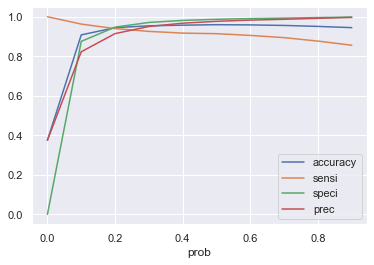

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in this case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 95% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9381178247477789


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V17', 'V27'], dtype='object')

In [0]:
X_test_rfe = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.01873774, 0.08660098, 0.03178766, ..., 0.00858444, 0.04789725,
       0.0016682 ])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9695352457193684


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.04644305197198673


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8873239436619719


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score is again low value, i.e., just 4.6%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.08826619964973731


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 8.8%, mainly because of really low precision value of 4.6%. This is better than previous oversampling percentage but its still a severe case of overfitting. Will now check with RFE with features '7' and see if overfitting can be reduced 

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 7)
rfe = rfe.fit(X_train_up, y_train_up)

In [0]:
list(zip(X_train_up.columns, rfe.support_, rfe.ranking_))

[('V1', False, 13),
 ('V2', False, 18),
 ('V3', False, 11),
 ('V4', True, 1),
 ('V5', False, 15),
 ('V6', False, 9),
 ('V7', False, 19),
 ('V8', True, 1),
 ('V9', False, 10),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', False, 4),
 ('V14', True, 1),
 ('V15', False, 8),
 ('V16', True, 1),
 ('V17', False, 3),
 ('V18', False, 14),
 ('V19', False, 12),
 ('V20', False, 22),
 ('V21', False, 16),
 ('V22', False, 6),
 ('V23', False, 21),
 ('V24', False, 20),
 ('V25', False, 17),
 ('V26', False, 5),
 ('V27', False, 2),
 ('Amount', False, 7)]

In [0]:
colr = X_train_up.columns[rfe.support_]

In [0]:
X_train_rfe_up = X_train_up[colr]

In [0]:
X_train_sm_up = sm.add_constant(X_train_rfe_up)
lgr1 = sm.GLM(y_train_up,X_train_sm_up, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_up)

In [0]:
y_train_pred[:10]

0    0.050396
1    0.007846
2    0.001755
3    0.043426
4    0.024431
5    0.045081
6    0.123362
7    0.008564
8    0.001812
9    0.039357
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.05039639, 0.00784629, 0.00175477, 0.04342555, 0.02443094,
       0.04508134, 0.12336156, 0.00856359, 0.00181213, 0.03935736])

In [0]:
y_train_pred.reshape(-1)

array([0.05039639, 0.00784629, 0.00175477, ..., 0.62693738, 0.99997987,
       0.99528316])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_up.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.050396
1,0,0.007846
2,0,0.001755
3,0,0.043426
4,0,0.024431


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

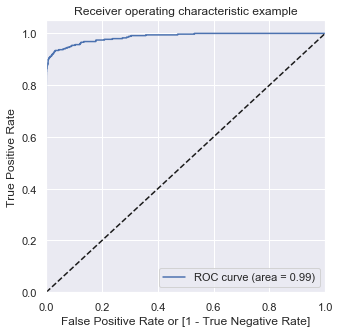

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.050396,1,0,0,0,0,0,0,0,0,0
1,0,0.007846,1,0,0,0,0,0,0,0,0,0
2,0,0.001755,1,0,0,0,0,0,0,0,0,0
3,0,0.043426,1,0,0,0,0,0,0,0,0,0
4,0,0.024431,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.908945  0.962833  0.876612  0.824004
0.2   0.2  0.943807  0.937132  0.947813  0.915069
0.3   0.3  0.954256  0.928497  0.969711  0.948434
0.4   0.4  0.956721  0.917175  0.980449  0.965691
0.5   0.5  0.957475  0.908448  0.986890  0.976513
0.6   0.6  0.958426  0.905593  0.990126  0.982153
0.7   0.7  0.957735  0.899873  0.992453  0.986214
0.8   0.8  0.950798  0.876742  0.995231  0.991017
0.9   0.9  0.946232  0.859582  0.998221  0.996563


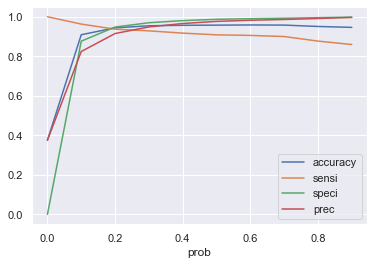

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in this case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 95% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9383595846064002


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V14', 'V16'], dtype='object')

In [0]:
X_test_rfe = X_test_up[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.02083804, 0.16863741, 0.02931401, ..., 0.00771562, 0.06349949,
       0.00213476])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_up
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9684936156267921


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.04529243937232525


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8943661971830986


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to remarkebly low value, i.e., just 3.4%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.08621860149355057


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 8.6%. The best result we have got in the case of oversampling, after trying percentage of 0.8 and 0.6, is with percentage of 0.6 and features '10'. Following are the key observations of logistic model performance comparison when executed on unbalanced and balanced data (oversampling):
1. The accuracy scores of both training and test data in both oversampling and un balanced data set cases are high and close to each other.
2. The cut-off for unbalanced dataset came out to be at 0.1 and for balanced data set is 0.3. 
3. The model performance over unbalanced data set is more consistant as all the four key parameters, Precision, Recall (Sensitivity), F1 score and Accuracy are similar for both train and test data.
4. In the case of balanced data set though, even the best model achieved has similar accuracy and recall scores for both train and test data set but poor precision score for test and hence, poor F1 score in the case of test data. Both precision and F1 scores are great in the case of train data set so balancing data via over sampling does result in model being inconsistent when it comes to precision score. However, since rest of the scores are similar and high in both test and train data set, model cannot really be called as 'Overfitted'
5. The recall scores achieved in both test and train is quite higher in the case best balanced data model when compared to best un balanced model. But the precision score in the case of balanced data is poor in the case of test data and hence inconsistent to consider it as a better model that could save more money. This is because with such a poor precision score, we could loose more money by utilizing unnecessary resources in tracking wrongly predicted fraudulent entries, due to large number of false positives.
6. However, the best model on unbalanced data may be lot more consistent but the recall and precision scores are about 80% and 76% respectively which are good, but we can probably get better scores from other models.
7. Important features in the case of un balanced data set best model are : ['V1', 'V4', 'V7', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V21', 'V22'] 
8. Important features in the case of balanced data set best model are ['V4', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V17', 'V27']

Will now use 'SMOTE' and check the performance of the logistic model

In [0]:
# SMOTE synthetic sampling
from imblearn.over_sampling import SMOTE


Using TensorFlow backend.


In [0]:
col = df.columns
col = col.drop('Class')
y = df['Class']
X = df[col]

In [0]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,149.62
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,2.69
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,378.66
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,123.50
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,69.99


In [0]:
X_train_smt, X_test_smt, y_train_smt, y_test_smt = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [0]:
# Transforming the amount using PCA method
st = StandardScaler()

In [0]:
X_train_smt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 7610 to 56088
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [0]:
cola = ['Amount']

In [0]:
X_train_smt[cola] = st.fit_transform(X_train_smt[cola])

In [0]:
X_test_smt[cola] = st.transform(X_test_smt[cola])

In [0]:
colp

['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [0]:
X_train_smt[colp] = pt.fit_transform(X_train_smt[colp])

In [0]:
X_test_smt[colp] = pt.fit_transform(X_test_smt[colp])

In [0]:
X_train_smt.index = pd.RangeIndex(0, len(X_train_smt.index))
y_train_smt.index = pd.RangeIndex(0, len(y_train_smt.index))

In [0]:
X_test_smt.index = pd.RangeIndex(0, len(X_test_smt.index))
y_test_smt.index = pd.RangeIndex(0, len(y_test_smt.index))

In [0]:
smt = SMOTE(random_state=27, sampling_strategy=0.6)
X_train_smt, y_train_smt = smt.fit_sample(X_train_smt, y_train_smt)

In [0]:
round(100*(y_train_smt.value_counts()/len(y_train_smt.index)),2)

0    62.5
1    37.5
Name: Class, dtype: float64

# Logistic Model with balanced data using 'SMOTE'

In [0]:
# Will assess model performance with features selected as '14', '10' and '7' using RFE. Best model will then be selected

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 14 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 14)
rfe = rfe.fit(X_train_smt, y_train_smt)

In [0]:
list(zip(X_train_smt.columns, rfe.support_, rfe.ranking_))

[('V1', True, 1),
 ('V2', False, 13),
 ('V3', False, 12),
 ('V4', True, 1),
 ('V5', False, 5),
 ('V6', False, 2),
 ('V7', False, 11),
 ('V8', True, 1),
 ('V9', True, 1),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', False, 3),
 ('V16', True, 1),
 ('V17', True, 1),
 ('V18', False, 4),
 ('V19', False, 10),
 ('V20', False, 6),
 ('V21', False, 8),
 ('V22', False, 9),
 ('V23', False, 15),
 ('V24', False, 14),
 ('V25', False, 7),
 ('V26', True, 1),
 ('V27', True, 1),
 ('Amount', True, 1)]

In [0]:
colr = X_train_smt.columns[rfe.support_]

In [0]:
# Best 14 features
print(colr)

Index(['V1', 'V4', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V17',
       'V26', 'V27', 'Amount'],
      dtype='object')


In [0]:
X_train_rfe_smt = X_train_smt[colr]

In [0]:
X_train_sm_smt = sm.add_constant(X_train_rfe_smt)
lgr1 = sm.GLM(y_train_smt,X_train_sm_smt, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_smt)

In [0]:
y_train_pred[:10]

0    0.018560
1    0.007308
2    0.002369
3    0.025527
4    0.030067
5    0.044184
6    0.054273
7    0.008686
8    0.000500
9    0.098145
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.01856018, 0.00730792, 0.00236896, 0.02552659, 0.03006668,
       0.04418427, 0.05427325, 0.00868613, 0.0005004 , 0.09814459])

In [0]:
y_train_pred.reshape(-1)

array([0.01856018, 0.00730792, 0.00236896, ..., 1.        , 0.99999999,
       1.        ])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_smt.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.018560
1,0,0.007308
2,0,0.002369
3,0,0.025527
4,0,0.030067


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

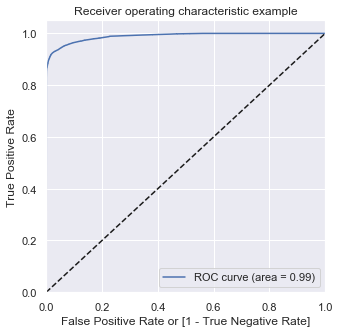

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.018560,1,0,0,0,0,0,0,0,0,0
1,0,0.007308,1,0,0,0,0,0,0,0,0,0
2,0,0.002369,1,0,0,0,0,0,0,0,0,0
3,0,0.025527,1,0,0,0,0,0,0,0,0,0
4,0,0.030067,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.912839  0.969742  0.878697  0.827485
0.2   0.2  0.946326  0.943613  0.947953  0.915811
0.3   0.3  0.955622  0.929192  0.971479  0.951333
0.4   0.4  0.958398  0.919746  0.981589  0.967715
0.5   0.5  0.957732  0.908901  0.987031  0.976771
0.6   0.6  0.956413  0.899998  0.990262  0.982286
0.7   0.7  0.955339  0.893533  0.992423  0.986063
0.8   0.8  0.952739  0.883693  0.994166  0.989117
0.9   0.9  0.948782  0.867840  0.997347  0.994931


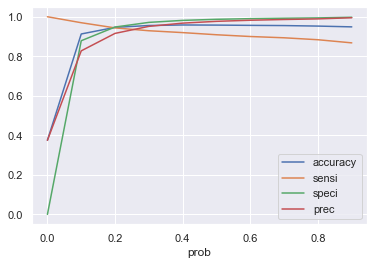

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 95% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9401322673987552


In [0]:
colr

Index(['V1', 'V4', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V17',
       'V26', 'V27', 'Amount'],
      dtype='object')

In [0]:
X_test_rfe = X_test_smt[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.01363062, 0.07672987, 0.03484206, ..., 0.01320748, 0.03567648,
       0.00176873])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_smt
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9697108013529487


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.04703703703703704


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8943661971830986


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to still, remarkebly low value, i.e., just 4.7%. Its better than in the case of best model for oversampling method but still too low.

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.08937368050668544


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 8.9%. The difference again shows a severe case of overfitting when it comes to the precision score and shows sampling the data, oversampling or SMOTE, improves recall score by a good margin but at the cost of precision score. Will now check with RFE with features 10 and 7 and see if overfitting can be reduced and precision score can be improved 

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 10 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 10)
rfe = rfe.fit(X_train_smt, y_train_smt)

In [0]:
list(zip(X_train_smt.columns, rfe.support_, rfe.ranking_))

[('V1', False, 3),
 ('V2', False, 17),
 ('V3', False, 16),
 ('V4', True, 1),
 ('V5', False, 9),
 ('V6', False, 6),
 ('V7', False, 15),
 ('V8', True, 1),
 ('V9', False, 5),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', True, 1),
 ('V14', True, 1),
 ('V15', False, 7),
 ('V16', True, 1),
 ('V17', False, 2),
 ('V18', False, 8),
 ('V19', False, 14),
 ('V20', False, 10),
 ('V21', False, 12),
 ('V22', False, 13),
 ('V23', False, 19),
 ('V24', False, 18),
 ('V25', False, 11),
 ('V26', True, 1),
 ('V27', True, 1),
 ('Amount', False, 4)]

In [0]:
colr = X_train_smt.columns[rfe.support_]

In [0]:
# Best 10 features
print(colr)

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V26', 'V27'], dtype='object')


In [0]:
X_train_rfe_smt = X_train_smt[colr]

In [0]:
X_train_sm_smt = sm.add_constant(X_train_rfe_smt)
lgr1 = sm.GLM(y_train_smt,X_train_sm_smt, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_smt)

In [0]:
y_train_pred[:10]

0    0.021279
1    0.006730
2    0.001074
3    0.040011
4    0.033645
5    0.020161
6    0.080790
7    0.006579
8    0.001572
9    0.111530
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.02127947, 0.0067303 , 0.00107359, 0.04001118, 0.03364538,
       0.02016129, 0.08079008, 0.0065791 , 0.00157237, 0.11152953])

In [0]:
y_train_pred.reshape(-1)

array([0.02127947, 0.0067303 , 0.00107359, ..., 1.        , 0.99999847,
       0.99999959])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_smt.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.021279
1,0,0.006730
2,0,0.001074
3,0,0.040011
4,0,0.033645


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

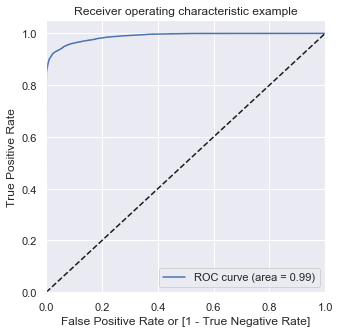

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.021279,1,0,0,0,0,0,0,0,0,0
1,0,0.006730,1,0,0,0,0,0,0,0,0,0
2,0,0.001074,1,0,0,0,0,0,0,0,0,0
3,0,0.040011,1,0,0,0,0,0,0,0,0,0
4,0,0.033645,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.910562  0.968059  0.876064  0.824147
0.2   0.2  0.945060  0.940146  0.948009  0.915609
0.3   0.3  0.954111  0.926378  0.970751  0.950008
0.4   0.4  0.955813  0.914336  0.980700  0.966015
0.5   0.5  0.955911  0.905174  0.986353  0.975488
0.6   0.6  0.955534  0.898859  0.989538  0.980971
0.7   0.7  0.953879  0.891155  0.991513  0.984376
0.8   0.8  0.952026  0.882939  0.993478  0.987838
0.9   0.9  0.947240  0.864406  0.996940  0.994134


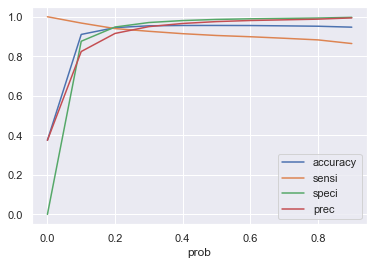

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 95% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.938044317054349


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V16', 'V26', 'V27'], dtype='object')

In [0]:
X_test_rfe = X_test_smt[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.02090704, 0.09435319, 0.03022258, ..., 0.01068848, 0.03864571,
       0.00136559])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_smt
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9694065049214096


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.046255506607929514


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8873239436619719


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score has reduced to still, remarkebly low value, i.e., just 4.6%. In fact model performance has lowered a bit when compared to model with 14 best features

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.08792742498255407


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 8.8%. The model performance has lowered after reducing features to '10' instead of increasing. Will still try with '7' features as well

In [0]:
# Model-1 Logistic Regression
# Assessing the model with StatsModels for logistic regression based model using top 7 features now, selected using RFE   
log_r = LogisticRegression()
rfe = RFE(log_r, 7)
rfe = rfe.fit(X_train_smt, y_train_smt)

In [0]:
list(zip(X_train_smt.columns, rfe.support_, rfe.ranking_))

[('V1', False, 6),
 ('V2', False, 20),
 ('V3', False, 19),
 ('V4', True, 1),
 ('V5', False, 12),
 ('V6', False, 9),
 ('V7', False, 18),
 ('V8', True, 1),
 ('V9', False, 8),
 ('V10', True, 1),
 ('V11', True, 1),
 ('V12', True, 1),
 ('V13', False, 2),
 ('V14', True, 1),
 ('V15', False, 10),
 ('V16', False, 3),
 ('V17', False, 5),
 ('V18', False, 11),
 ('V19', False, 17),
 ('V20', False, 13),
 ('V21', False, 15),
 ('V22', False, 16),
 ('V23', False, 22),
 ('V24', False, 21),
 ('V25', False, 14),
 ('V26', True, 1),
 ('V27', False, 4),
 ('Amount', False, 7)]

In [0]:
colr = X_train_smt.columns[rfe.support_]

In [0]:
# Best 7 features
print(colr)

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V14', 'V26'], dtype='object')


In [0]:
X_train_rfe_smt = X_train_smt[colr]

In [0]:
X_train_sm_smt = sm.add_constant(X_train_rfe_smt)
lgr1 = sm.GLM(y_train_smt,X_train_sm_smt, family = sm.families.Binomial())
lgm = lgr1.fit()

In [0]:
y_train_pred = lgm.predict(X_train_sm_smt)

In [0]:
y_train_pred[:10]

0    0.039742
1    0.009255
2    0.001538
3    0.043500
4    0.030820
5    0.021941
6    0.077159
7    0.008921
8    0.002437
9    0.048109
dtype: float64

In [0]:
y_train_pred = np.array(y_train_pred)

In [0]:
y_train_pred[:10]

array([0.03974183, 0.0092553 , 0.00153843, 0.04350005, 0.03081997,
       0.02194086, 0.07715901, 0.00892105, 0.00243679, 0.04810862])

In [0]:
y_train_pred.reshape(-1)

array([0.03974183, 0.0092553 , 0.00153843, ..., 0.99999998, 0.99999452,
       0.99999714])

In [0]:
# Creating a dataframe with the actual 'Class' flag and the predicted 'Class' probabilities
y_train_pred_df = pd.DataFrame({'Class':y_train_smt.values, 'Class_Prob':y_train_pred})
y_train_pred_df.head()

,Class,Class_Prob
0,0,0.039742
1,0,0.009255
2,0,0.001538
3,0,0.043500
4,0,0.030820


In [0]:
# Plotting the ROC Curve using 'draw_roc' function
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

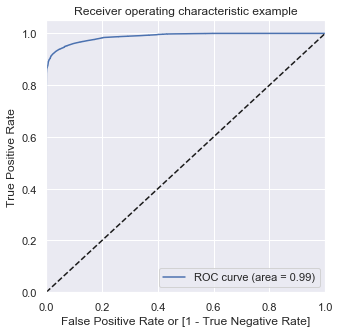

In [0]:
draw_roc(y_train_pred_df.Class, y_train_pred_df.Class_Prob)

The 'ROC' curve value is excellent. Infact, with data being balanced, its better than the one we got when data was unbalanced. Will still have to check other scores such as 'Precision' and 'Recall' or 'Sensitivity

In [0]:
# Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs within the y_train_pred_df dataframe
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Class_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Class,Class_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.039742,1,0,0,0,0,0,0,0,0,0
1,0,0.009255,1,0,0,0,0,0,0,0,0,0
2,0,0.001538,1,0,0,0,0,0,0,0,0,0
3,0,0.043500,1,0,0,0,0,0,0,0,0,0
4,0,0.030820,1,0,0,0,0,0,0,0,0,0


In [0]:
cutoff_df = pd.DataFrame(columns = ['prob', 'accuracy', 'sensi', 'speci','prec'])

In [0]:
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in num:
    cml = cm(y_train_pred_df.Class.astype(int), y_train_pred_df[i])
    total = sum(sum(cml))
    accuracy = (cml[0,0] + cml[1,1])/total
    sensi = cml[1,1]/(cml[1,0] + cml[1,1])
    speci = cml[0,0]/(cml[0,0] + cml[0,1])
    prec = cml[1,1]/(cml[1,1] + cml[0,1])
    cutoff_df.loc[i] = [i,accuracy, sensi, speci, prec]
print(cutoff_df)

     prob  accuracy     sensi     speci      prec
0.0   0.0  0.374999  1.000000  0.000000  0.374999
0.1   0.1  0.911598  0.966543  0.878632  0.826936
0.2   0.2  0.946571  0.939627  0.950737  0.919641
0.3   0.3  0.953938  0.924930  0.971344  0.950898
0.4   0.4  0.956156  0.914369  0.981227  0.966914
0.5   0.5  0.955000  0.902653  0.986408  0.975518
0.6   0.6  0.955223  0.897720  0.989724  0.981280
0.7   0.7  0.954400  0.892645  0.991453  0.984292
0.8   0.8  0.952098  0.883743  0.993111  0.987175
0.9   0.9  0.948345  0.867480  0.996865  0.994012


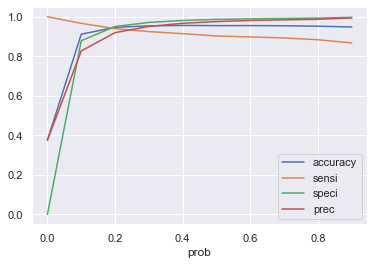

In [0]:
cutoff_df.plot.line(x = 'prob', y = ['accuracy', 'sensi','speci','prec'])
plt.show()

From the graph and confusion matrix table 'precision' and 'recall' or 'senstivity' values, its clear that in the case of balanced data, cutoff value of 0.3 is relatively ideal as both the 'precision' and 'recall' scores are high and close to each other at 95% and 93%. Accuracy, here is great and is better for most of the higher cut off values but we have the high values at this point and are close to each other, which is always the ideal scenario 

In [0]:
y_train_pred_df['pred_Class_Value_0.3'] = y_train_pred_df.Class_Prob.map(lambda x:1 if x >= 0.3 else 0)

Lets see the F1 score

In [0]:
prtr = metrics.precision_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])
rectr = metrics.recall_score(y_train_pred_df.Class.astype(int), y_train_pred_df['pred_Class_Value_0.3'])

In [0]:
f1tr = 2*prtr*rectr/(prtr+rectr)
print(f1tr)

0.9377342871091677


In [0]:
colr

Index(['V4', 'V8', 'V10', 'V11', 'V12', 'V14', 'V26'], dtype='object')

In [0]:
X_test_rfe = X_test_smt[colr]

In [0]:
X_test_sm = sm.add_constant(X_test_rfe)
y_test_pred = lgm.predict(X_test_sm)
y_test_pred = np.array(y_test_pred)

In [0]:
y_test_pred.reshape(-1)

array([0.02131617, 0.12764538, 0.02401298, ..., 0.01436592, 0.04815259,
       0.00180308])

In [0]:
y_test_pred_df = pd.DataFrame()
y_test_pred_df['Class'] = y_test_smt
y_test_pred_df['Class_prob'] = y_test_pred
y_test_pred_df['Class_pred_0.3'] = y_test_pred_df.Class_prob.map(lambda x:1 if x >= 0.3 else 0)


In [0]:
print(metrics.accuracy_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.9706705054831877


In [0]:
print(metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.0481651376146789


In [0]:
print(metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3']))

0.8873239436619719


The accuracy, recall scores are similar when compared with the train data set. But value of 'precision' score is till remarkebly low value, i.e., just 4.8%. However, this is the best model so far for SMOTE balanced data with highest preciosion  score of 4.8%

In [0]:
prt = metrics.precision_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])
rect = metrics.recall_score(y_test_pred_df.Class.astype(int), y_test_pred_df['Class_pred_0.3'])

In [0]:
f1t = 2*prt*rect/(prt+rect)
print(f1t)

0.09137055837563453


F1 scores and precison scores of both train and test data set show huge difference, with train F1 being around 94% and test F1 being 9.1%.  However, this is the best model so far for SMOTE balanced data with highest test preciosion  score of 4.8% and F1 score of 9.1% 

# Logistic Model Summary
F1 scores and precison scores of both train and test data set show huge difference in the case of balanced data (SMOTE and Oversampling techniques). The best result we have got in the case of balanced data model is with SMOTE balanced technique and model using 7 most important features. 
Following are the key observations of logistic model performance comparison when executed on unbalanced and balanced data (oversampling and smote):
1. The accuracy scores of both training and test data in both balanced and un balanced data set cases are high and close to each other.
2. The cut-off for unbalanced dataset came out to be at 0.1 and for balanced data set is 0.3. 
3. The model performance over unbalanced data set is more consistant as all the four key parameters, Precision, Recall (Sensitivity), F1 score and Accuracy are similar for both train and test data.
4. In the case of balanced data set though, even the best model achieved has similar and high accuracy and recall scores for both train and test data set but poor precision score for test and hence, poor F1 score in the case of test data. Both precision and F1 scores are great in the case of train data set so balancing data via over-sampling  or SMOTE, does result in model being inconsistent when it comes to precision score. However, since rest of the scores are similar and high in both test and train data set, model can be considered slightly 'Overfitted'
5. The recall scores achieved in both test and train is quite higher in the case best balanced data model when compared to best un balanced model. But the precision score in the case of balanced data is poor in the case of test data and hence inconsistent to consider it as a better model that could save more money. This is because with such a poor precision score, we could loose more money by utilizing unnecessary resources in tracking wrongly predicted fraudulent entries, due to large number of false positives.
6. However, the best model on unbalanced data may be lot more consistent but the recall and precision scores are about 80% and 76% respectively which are good, but we can probably get better scores from other models.
7. The best result we have got in the case of balanced data model is with SMOTE balanced technique and model using  7 most important features. The test accuracy is 95%, recall score is 89% but precision and F1 scores are ridulously low when compared to train score at 4.8% and 9.1% respectively, compared to 95% and 93% for train data set.
9. Important features in the case of un balanced data set best model are : ['V1', 'V4', 'V7', 'V8', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V21', 'V22'] 
10. Important features in the case of balanced data set best model are ['V4', 'V8', 'V10', 'V11', 'V12', 'V14', 'V26']
11. We will now move on to other models to check their performance over balanced data

# Random Forest Model with balanced data (over sampling)

Following are the train and test pair of features to be considered in the case of over-sampling balanced data
1. X_train_up, y_train_up
2. X_test_up, y_test_up

In [64]:
X_train_up.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,0.598470,0.010653,0.731921,0.017924,-0.204162,0.345395,-0.503116,0.053042,1.279474,-0.468132,3.021936,-1.044975,2.523534,1.642896,0.192412,-0.059052,0.630296,-0.664479,-0.614659,-0.109200,-0.217742,-0.142183,0.229615,-0.518220,-0.052688,0.904879,-0.061990,-1.066222
1,1.445565,-0.078678,-1.233161,0.208193,0.187539,-0.409005,0.102048,-0.252318,0.245017,0.257359,0.610062,1.546125,0.521753,0.351972,-0.765034,0.208449,-0.738125,-0.275378,0.612126,-0.169517,-0.355324,-0.636424,0.418801,-0.841362,-0.249245,0.206509,-0.072079,-1.029305
2,0.843049,-1.560173,-0.783968,-1.919788,0.578638,2.278265,-1.814737,0.853644,-1.680052,1.315947,-0.311041,-1.117650,0.620637,-0.406962,1.139137,0.189104,-0.129896,0.835635,-0.120798,-0.068984,-0.009865,0.089320,-0.203779,1.917859,0.510411,-0.038200,0.047306,0.700423
3,-0.326321,1.235492,-0.312905,-0.296532,0.699869,-0.805682,0.964615,-0.185940,0.082123,-0.479100,-0.183169,0.007221,0.112076,-1.092514,-0.307278,0.111046,0.566802,-0.491726,-0.501441,0.135098,-0.457294,-0.734681,0.252022,1.861162,-0.439226,0.093359,0.332998,-1.043594
4,0.566536,-0.093882,0.988880,0.445581,-0.769281,0.053504,-0.575773,0.184401,0.235960,0.107031,1.635221,0.577842,-0.843761,0.467763,1.052225,0.460752,-0.391411,-0.042388,-0.463772,-0.170440,0.013937,-0.052800,0.225649,0.287704,0.000863,0.215796,0.000743,-0.865909


In [65]:
y_train_up.head()

0    0
1    0
2    0
3    0
4    0
Name: Class, dtype: int64

Will first check performance of untuned RandomForest model

In [0]:
rfc=RandomForestClassifier()





In [46]:
X_train_up.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318422 entries, 0 to 22907
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      318422 non-null  float64
 1   V2      318422 non-null  float64
 2   V3      318422 non-null  float64
 3   V4      318422 non-null  float64
 4   V5      318422 non-null  float64
 5   V6      318422 non-null  float64
 6   V7      318422 non-null  float64
 7   V8      318422 non-null  float64
 8   V9      318422 non-null  float64
 9   V10     318422 non-null  float64
 10  V11     318422 non-null  float64
 11  V12     318422 non-null  float64
 12  V13     318422 non-null  float64
 13  V14     318422 non-null  float64
 14  V15     318422 non-null  float64
 15  V16     318422 non-null  float64
 16  V17     318422 non-null  float64
 17  V18     318422 non-null  float64
 18  V19     318422 non-null  float64
 19  V20     318422 non-null  float64
 20  V21     318422 non-null  float64
 21  V22     318

In [47]:
rfc.fit(X_train_up,y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [0]:
# Making predictions
pred_train = rfc.predict(X_train_up)

In [0]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [51]:
# Let's check the report of our default model
print(classification_report(y_train_up,pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



The model showns all metrics as perfect which are characteristics of model being overfitted. Lets see the scores on test data set

In [0]:
pred_test = rfc.predict(X_test_up)

In [2]:
print(classification_report(y_test_up,pred_test))

NameError: ignored

We can clearly see significant dip in metric scores such as F1, precision and recall which signifies model's suffering from overfitting. Will now tune the model using GridSearch and validate using K-fold as well

In [55]:
# Hyper parameter Tuning
# First will get the apt value of 'max_depth' 
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(10, 50, 5)}

# instantiate the base model
rf = RandomForestClassifier()


# fit tree on training data
rfd = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfd.fit(X_train_up, y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

float64


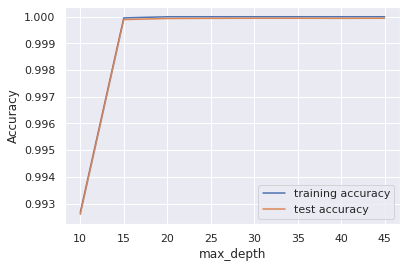

In [56]:
# scores of GridSearch CV
scores = rfd.cv_results_
print(scores["mean_train_score"].dtype)
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"],
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


We can see the 'max_depth' of 15 will give us the maximum test accuracy and the difference between test and train is least

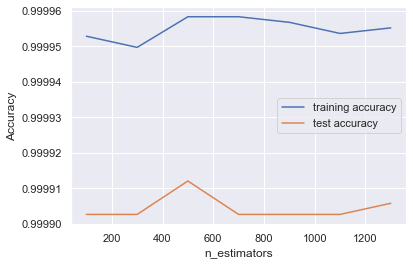

In [41]:
# GridSearchCV to find optimal n_estimators

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100,1500,200)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=15)


# fit tree on training data
rfdn = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfdn.fit(X_train_up, y_train_up)
# scores of GridSearch CV
scores_est = pd.DataFrame(rfdn.cv_results_)
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [42]:
# We can see that both train and test 'n_estimators' peak at '500' and hence are closest to each other as well. There's trend of increase in 'test' and 'train' scores after 1200 n_estimators mark but will first consider the first peak of '500'  

In [0]:
# As per the analysis of results, will be selecting 'n_estimators' to be '500'

In [44]:
# tuning Max_features


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': range(5, 24, 2)}

# instantiate the model
rf = RandomForestClassifier(max_depth=15, n_estimators = 500)


# fit tree on training data
rfmx = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfmx.fit(X_train_up, y_train_up)



KeyboardInterrupt: 

In [0]:
scores_mx = pd.DataFrame(rfmx.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# The model was not completing the above hyper tuning and due to time being a constraint. Decided to check values of Max features of values '7', '9' and '11' 
# First checking performance with max features '7'

In [35]:
# tuning min_smaples_leaf


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 1200, 100)}

# instantiate the model
rf = RandomForestClassifier(max_depth=15, n_estimators = 500, max_features = 7)


# fit tree on training data
rfl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfl.fit(X_train_up, y_train_up)


KeyboardInterrupt: 

In [ ]:
scores_l = pd.DataFrame(rfl.cv_results_)
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [0]:
# Unfortunately the model was not completing even for 'min_samples_leaf', will keep it as default

# Following are therefore, the key hyper parameter tunned values:
1. max_features: 9
2. n_estimators: 500
3. max_depth: 15 

In [66]:
# Model with tuned parameters
rff=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 9)
rff.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [67]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [68]:
predictions_train =rff.predict(X_train_up)

In [69]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [70]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9999120663773232


In [71]:
print(metrics.precision_score(y_train_up, predictions_train))

0.999765564821327


In [72]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [73]:
predictions_test =rff.predict(X_test_up)

In [74]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.82      0.79      0.80       142

    accuracy                           1.00     85443
   macro avg       0.91      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [75]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9993562960102056


In [76]:
print(metrics.precision_score(y_test_up, predictions_test))

0.8175182481751825


In [77]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7887323943661971


The test scores are consistent with the crucial ones, recall and precison being 80% for call label '1' and again exceptionally great as macro or weighted scores.
This Random Forest model is definitely better then the one we achieved over the unbalanced one and surely we can tune it further to get even better model
However, we ran out of time so considering this as our best Random forest model





In [ ]:
# Continuing my work after submission

In [78]:
# tuning Max_features


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': range(5, 18, 2)}

# instantiate the model
rf = RandomForestClassifier(max_depth=15, n_estimators = 500)


# fit tree on training data
rfmx = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfmx.fit(X_train_up, y_train_up)



GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=15,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=500, n_jobs=None,
                                              oob_score=False,
                                              random_

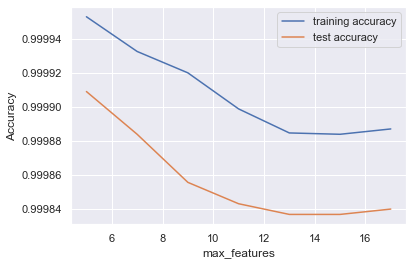

In [79]:
scores_mx = pd.DataFrame(rfmx.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above we can see that value of max_features being '5' gives the best result

In [80]:
# tuning min_smaples_leaf


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 1200, 100)}

# instantiate the model
rf = RandomForestClassifier(max_depth=15, n_estimators = 500, max_features = 5)


# fit tree on training data
rfl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfl.fit(X_train_up, y_train_up)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=15,
                                              max_features=5,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=500, n_jobs=None,
                                              oob_score=False,
                                              random_state

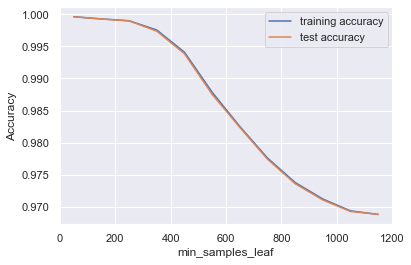

In [81]:
scores_l = pd.DataFrame(rfl.cv_results_)
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [0]:
# We can see that min_samples_leaf value of '200' gives us the best result as both train and test have high accuracy at this value

# Following are therefore, the key hyper parameter tunned values:
1. max_features: 5
2. n_estimators: 500
3. max_depth: 15 
4. min_samples_leaf: 200
We will now build model with these values

In [82]:
# Model-2 with tuned parameters
rff2=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 5, min_samples_leaf = 200)
rff2.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [83]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [84]:
predictions_train =rff2.predict(X_train_up)

In [85]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [86]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.999252564207247


In [87]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9980107985223075


In [88]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [89]:
predictions_test =rff2.predict(X_test_up)

In [90]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.48      0.82      0.60       142

    accuracy                           1.00     85443
   macro avg       0.74      0.91      0.80     85443
weighted avg       1.00      1.00      1.00     85443



In [91]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9982093325374811


In [92]:
print(metrics.precision_score(y_test_up, predictions_test))

0.4773662551440329


In [93]:
print(metrics.recall_score(y_test_up, predictions_test))

0.8169014084507042


The recall score has improved slightly but the precision score has taken a hit. Model will need further tuning




In [94]:
# tuning min_samples_split


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 1200, 200)}

# instantiate the model
rf = RandomForestClassifier(max_depth=15, n_estimators = 500, max_features = 5, min_samples_leaf = 200)


# fit tree on training data
rfsl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfsl.fit(X_train_up, y_train_up)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=15,
                                              max_features=5,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=200,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=500, n_jobs=None,
                                              oob_score=False,
                                              random_sta

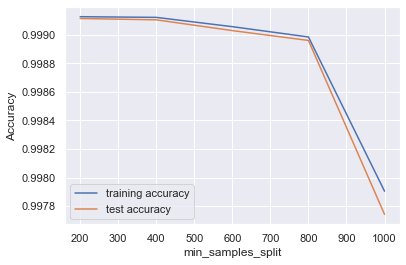

In [95]:
scores_sl = pd.DataFrame(rfsl.cv_results_)
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
# As per the graph above, will try with min_samples_split values of '400' and then if model shows signs of overfitting, will try with value of '800' 

In [96]:
# Model-3 with tuned parameters
rff3=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 5, min_samples_split = 400)
rff3.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=400,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [97]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [98]:
predictions_train =rff3.predict(X_train_up)

In [99]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [100]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9999309092964682


In [101]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9998157916771331


In [102]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [103]:
predictions_test =rff3.predict(X_test_up)

In [104]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.83      0.78      0.81       142

    accuracy                           1.00     85443
   macro avg       0.92      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [105]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9993797034280163


In [106]:
print(metrics.precision_score(y_test_up, predictions_test))

0.8345864661654135


In [107]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7816901408450704


The scores are much better here. Will try and tune further to improve the recall scoresw




In [108]:
# Model-4 with tuned parameters
rff4=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 6, min_samples_split = 500)
rff4.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=6,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=500,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [109]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [110]:
predictions_train =rff4.predict(X_train_up)

In [111]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [112]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998838019986056


In [113]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996902339989117


In [114]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [115]:
predictions_test =rff4.predict(X_test_up)

In [116]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.79      0.79      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.89      0.89     85443
weighted avg       1.00      1.00      1.00     85443



In [117]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [118]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7887323943661971


In [119]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7887323943661971


The scores are much better here. Will try and tune further to improve the recall scoresw




In [120]:
# Model-5 with tuned parameters
rff5=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 5, min_samples_split = 600)
rff5.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=600,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [121]:
predictions_train =rff5.predict(X_train_up)

In [122]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [123]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998869424851298


In [124]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996986035296875


In [125]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [126]:
predictions_test =rff5.predict(X_test_up)

In [127]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.81      0.79      0.80       142

    accuracy                           1.00     85443
   macro avg       0.90      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [128]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9993328885923949


In [129]:
print(metrics.precision_score(y_test_up, predictions_test))

0.8057553956834532


In [130]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7887323943661971


The scores are much better here. Will try and tune further to improve the recall scoresw




In [131]:
# Model-6 with tuned parameters
rff6=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 6, min_samples_split = 600)
rff6.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=6,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=600,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [132]:
predictions_train =rff6.predict(X_train_up)

In [133]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [123]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998869424851298


In [134]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996818646082749


In [135]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [136]:
predictions_test =rff6.predict(X_test_up)

In [137]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.79      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.89      0.89     85443
weighted avg       1.00      1.00      1.00     85443



In [138]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992860737567735


In [139]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7832167832167832


In [140]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7887323943661971


The scores are much better here. Will try and tune further to improve the recall scoresw




In [141]:
# Model-7 with tuned parameters
rff7=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 7, min_samples_split = 700)
rff7.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=700,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [142]:
predictions_train =rff7.predict(X_train_up)

In [143]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [144]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998712400525089


In [145]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996567572771643


In [146]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [147]:
predictions_test =rff7.predict(X_test_up)

In [148]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.80      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.89     85443
weighted avg       1.00      1.00      1.00     85443



In [149]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [150]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7847222222222222


In [151]:
print(metrics.recall_score(y_test_up, predictions_test))

0.795774647887324


The scores are better here. Will try and tune further to improve the recall scores further




In [152]:
# Model-8 with tuned parameters
rff8=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 7, min_samples_split = 800)
rff8.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [153]:
predictions_train =rff8.predict(X_train_up)

In [154]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [155]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998712400525089


In [156]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996567572771643


In [157]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [158]:
predictions_test =rff8.predict(X_test_up)

In [159]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.80      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [160]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [161]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7808219178082192


In [162]:
print(metrics.recall_score(y_test_up, predictions_test))

0.8028169014084507


The scores are better here. Will try and tune further to improve the recall scores further




In [163]:
# Model-9 with tuned parameters
rff9=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 7, min_samples_split = 900)
rff9.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=900,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [164]:
predictions_train =rff9.predict(X_train_up)

In [165]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [166]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998618185929364


In [167]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996316512071795


In [168]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [169]:
predictions_test =rff9.predict(X_test_up)

In [170]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.77      0.80      0.78       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.89     85443
weighted avg       1.00      1.00      1.00     85443



In [171]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992743700478681


In [172]:
print(metrics.precision_score(y_test_up, predictions_test))

0.773972602739726


In [173]:
print(metrics.recall_score(y_test_up, predictions_test))

0.795774647887324


The scores are better here. Will try and tune further to improve the recall scores further




In [174]:
# Model-10 with tuned parameters
rff10=RandomForestClassifier(max_depth=20,n_estimators=500, max_features = 7, min_samples_split = 800)
rff10.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [175]:
predictions_train =rff10.predict(X_train_up)

In [176]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [177]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9999309092964682


In [178]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9998157916771331


In [179]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [180]:
predictions_test =rff10.predict(X_test_up)

In [181]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.81      0.79      0.80       142

    accuracy                           1.00     85443
   macro avg       0.90      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [171]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992743700478681


In [182]:
print(metrics.precision_score(y_test_up, predictions_test))

0.8057553956834532


In [183]:
print(metrics.recall_score(y_test_up, predictions_test))

0.7887323943661971


The recall score has reduced so will keep depth at '15'




In [184]:
# Model-10 with tuned parameters
rff10=RandomForestClassifier(max_depth=15,n_estimators=500, max_features = 8, min_samples_split = 800)
rff10.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [185]:
predictions_train =rff10.predict(X_train_up)

In [186]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [187]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998743805390331


In [188]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996651262474048


In [189]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [190]:
predictions_test =rff10.predict(X_test_up)

In [191]:
print(classification_report(y_test_up,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.80      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [192]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [193]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7808219178082192


In [194]:
print(metrics.recall_score(y_test_up, predictions_test))

0.8028169014084507


The recall score has reduced so will keep depth at '15'




In [207]:
# Model-11 with tuned parameters
rff11=RandomForestClassifier(max_depth=15,n_estimators=600, max_features = 9, min_samples_split = 800)
rff11.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [208]:
predictions_train =rff11.predict(X_train_up)

In [209]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [210]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998649590794606


In [211]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996400197570552


In [212]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [213]:
predictions_test =rff11.predict(X_test_up)

In [214]:
print(classification_report(y_test_up,predictions_test))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.81      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [215]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [216]:
print(metrics.precision_score(y_test_up, predictions_test))

0.777027027027027


In [217]:
print(metrics.recall_score(y_test_up, predictions_test))

0.8098591549295775


The recall score has improved a bit. So will see if tuning it further helps




In [249]:
# Model-13 with tuned parameters
rff13=RandomForestClassifier(max_depth=15,n_estimators=700, max_features = 9, min_samples_split = 800)
rff13.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=700,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [250]:
predictions_train =rff13.predict(X_train_up)

In [251]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [252]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998649590794606


In [253]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996400197570552


In [254]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


All scores are exceptionally great. Lets see the test scores


In [255]:
predictions_test =rff13.predict(X_test_up)

In [256]:
print(classification_report(y_test_up,predictions_test))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.81      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [257]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992977774656788


In [258]:
print(metrics.precision_score(y_test_up, predictions_test))

0.777027027027027


In [259]:
print(metrics.recall_score(y_test_up, predictions_test))

0.8098591549295775


In [260]:
print(metrics.roc_auc_score(y_test_up, predictions_test))

0.9047361447969419


The recall score, for class '1' label is not improving beyond 81. Will try one more model for oversampling




In [274]:
# Model-14 with tuned parameters
rff14=RandomForestClassifier(max_depth=15,n_estimators=700, max_features = 8, min_samples_split = 800)
rff14.fit(X_train_up, y_train_up)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=700,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [275]:
predictions_train =rff14.predict(X_train_up)

In [276]:
print(classification_report(y_train_up,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    119408

    accuracy                           1.00    318422
   macro avg       1.00      1.00      1.00    318422
weighted avg       1.00      1.00      1.00    318422



In [277]:
print(metrics.accuracy_score(y_train_up, predictions_train))

0.9998618185929364


In [278]:
print(metrics.precision_score(y_train_up, predictions_train))

0.9996316512071795


In [279]:
print(metrics.recall_score(y_train_up, predictions_train))

1.0


In [280]:
print(metrics.roc_auc_score(y_train_up, predictions_train))

0.9998894550132151


All scores are exceptionally great. Lets see the test scores


In [281]:
predictions_test =rff14.predict(X_test_up)

In [282]:
print(classification_report(y_test_up,predictions_test))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.78      0.80      0.79       142

    accuracy                           1.00     85443
   macro avg       0.89      0.90      0.89     85443
weighted avg       1.00      1.00      1.00     85443



In [283]:
print(metrics.accuracy_score(y_test_up, predictions_test))

0.9992860737567735


In [284]:
print(metrics.precision_score(y_test_up, predictions_test))

0.7793103448275862


In [285]:
print(metrics.recall_score(y_test_up, predictions_test))

0.795774647887324


In [286]:
print(metrics.roc_auc_score(y_test_up, predictions_test))

0.8976997528718106


Scores have not improved. The best model achieved with oversampling balancing technique is rff13. Now will try with 'SMOTE'




In [14]:
# SMOTE synthetic sampling
from imblearn.over_sampling import SMOTE


Using TensorFlow backend.


In [15]:
col = df.columns
col = col.drop('Class')
y = df['Class']
X = df[col]

In [16]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,149.62
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,2.69
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,378.66
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,123.50
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,69.99


In [17]:
X_train_smt, X_test_smt, y_train_smt, y_test_smt = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [18]:
# Transforming the amount using PCA method
st = StandardScaler()

In [19]:
X_train_smt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 7610 to 56088
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [20]:
cola = ['Amount']

In [21]:
X_train_smt[cola] = st.fit_transform(X_train_smt[cola])

In [22]:
X_test_smt[cola] = st.transform(X_test_smt[cola])

In [23]:
colp

['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [24]:
X_train_smt[colp] = pt.fit_transform(X_train_smt[colp])

In [25]:
X_test_smt[colp] = pt.fit_transform(X_test_smt[colp])

In [26]:
X_train_smt.index = pd.RangeIndex(0, len(X_train_smt.index))
y_train_smt.index = pd.RangeIndex(0, len(y_train_smt.index))

In [27]:
X_test_smt.index = pd.RangeIndex(0, len(X_test_smt.index))
y_test_smt.index = pd.RangeIndex(0, len(y_test_smt.index))

In [28]:
smt = SMOTE(random_state=27, sampling_strategy=0.6)
X_train_smt, y_train_smt = smt.fit_sample(X_train_smt, y_train_smt)

In [29]:
round(100*(y_train_smt.value_counts()/len(y_train_smt.index)),2)

0    62.5
1    37.5
Name: Class, dtype: float64

In [305]:
# Hyper parameter Tuning
# First will get the apt value of 'max_depth' 
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(10, 50, 5)}

# instantiate the base model
rf = RandomForestClassifier()


# fit tree on training data
rfd = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring= "roc_auc", return_train_score=True)
rfd.fit(X_train_smt, y_train_smt)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

float64


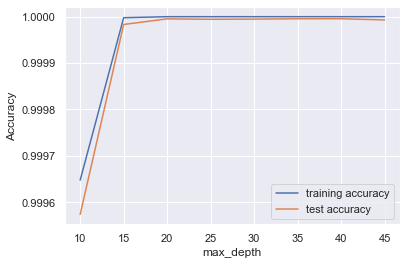

In [306]:
# scores of GridSearch CV
scores = rfd.cv_results_
print(scores["mean_train_score"].dtype)
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"],
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


We can see the 'max_depth' of 20 will give us the maximum test accuracy and the difference between test and train is least

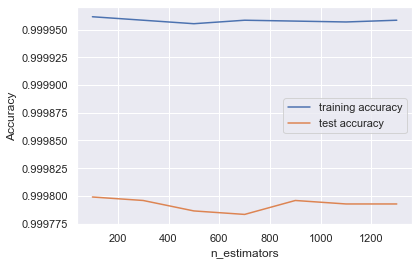

In [308]:
# GridSearchCV to find optimal n_estimators

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100,1500,200)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=20)


# fit tree on training data
rfdn = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfdn.fit(X_train_smt, y_train_smt)
# scores of GridSearch CV
scores_est = pd.DataFrame(rfdn.cv_results_)
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [42]:
# We can see that both train and test 'n_estimators' peak at '900' and hence are closest to each other as well. There's trend of increase in 'test' and 'train' scores after 1200 n_estimators mark but will first consider the first peak of '500'  

In [0]:
# As per the analysis of results, will be selecting 'n_estimators' to be '900'

In [30]:
# tuning Max_features


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': range(5, 24, 3)}

# instantiate the model
rf = RandomForestClassifier(max_depth=20, n_estimators = 900)


# fit tree on training data
rfmx = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfmx.fit(X_train_smt, y_train_smt)



GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=20,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=900, n_jobs=None,
                                              oob_score=False,
                                              random_

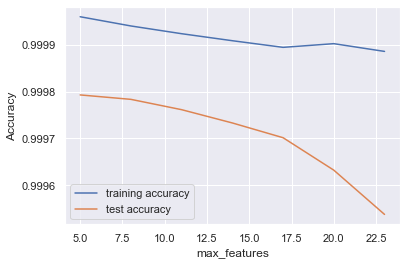

In [31]:
scores_mx = pd.DataFrame(rfmx.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above we can see that value of max_features being '5' gives the best result

In [32]:
# tuning min_smaples_leaf


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 1200, 100)}

# instantiate the model
rf = RandomForestClassifier(max_depth=20, n_estimators = 900, max_features = 5)


# fit tree on training data
rfl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfl.fit(X_train_smt, y_train_smt)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=20,
                                              max_features=5,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=900, n_jobs=None,
                                              oob_score=False,
                                              random_state

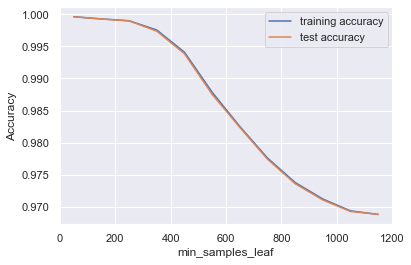

In [81]:
scores_l = pd.DataFrame(rfl.cv_results_)
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can consider the min_samples_leaf to be '400' as after that there's a steep decline in accuarcy scores. 

In [33]:
# tuning min_samples_split


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 1400, 200)}

# instantiate the model
rf = RandomForestClassifier(max_depth=20, n_estimators = 900, max_features = 5, min_samples_leaf = 400)


# fit tree on training data
rfsl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfsl.fit(X_train_smt, y_train_smt)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=20,
                                              max_features=5,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=400,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=900, n_jobs=None,
                                              oob_score=False,
                                              random_sta

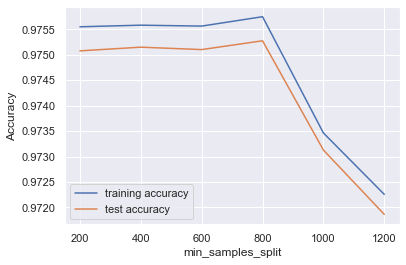

In [34]:
scores_sl = pd.DataFrame(rfsl.cv_results_)
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can see that min_samples_split of value '800' is most suited as at this point, testing and training accuracies are closest at this point and highest too.

# Following are therefore, the key hyper parameter tunned values:
1. max_features: 5
2. n_estimators: 900
3. max_depth: 20 
4. min_samples_leaf: 400
5. min_samples_split: 800
We will now build model with these values

In [35]:
# Model-1 SMOTE with tuned parameters
rff1=RandomForestClassifier(max_depth=20,n_estimators=900, max_features = 5, min_samples_split = 800)
rff1.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [36]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [37]:
predictions_train =rff1.predict(X_train_smt)

In [38]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    199014
           1       1.00      0.97      0.98    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.98      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [39]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9884932573754326


In [40]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992753123058872


In [41]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9700187592121131


All scores are exceptionally great. Lets see the test scores


In [42]:
predictions_test =rff1.predict(X_test_smt)

In [43]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.66      0.81      0.73       142

    accuracy                           1.00     85443
   macro avg       0.83      0.90      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [44]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989817773252344


In [45]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.6571428571428571


In [46]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8098591549295775


The recall, precision and f1 macro scores of test data too for label '1' are quite high, 83%, 90% and 86% respectively. The label '1' specific precision, recall and hence, f1- score for test data can perhaps increased a bit. Model can be further tuned to see if we can get better scores. Accuracy of both test and train are excellent and close to each other




In [58]:
# Model-2 SMOTE with tuned parameters
rff2=RandomForestClassifier(max_depth=20,n_estimators=900, max_features = 7, min_samples_split = 800)
rff2.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [59]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [60]:
predictions_train =rff2.predict(X_train_smt)

In [61]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    199014
           1       1.00      0.97      0.99    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.99      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [62]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9896803612815698


In [63]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992604949524481


In [64]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9732011255527268


All scores are exceptionally great. Lets see the test scores


In [65]:
predictions_test =rff2.predict(X_test_smt)

In [69]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.66      0.82      0.73       142

    accuracy                           1.00     85443
   macro avg       0.83      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [70]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989817773252344


In [71]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.655367231638418


In [72]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


The recall score, for label-1, has improved a bit. So will see if can improve the important scores further


In [85]:
# Model-3 SMOTE with tuned parameters
rff3=RandomForestClassifier(max_depth=21,n_estimators=900, max_features = 8, min_samples_split = 800)
rff3.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=21, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [86]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [87]:
predictions_train =rff3.predict(X_train_smt)

In [88]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    199014
           1       1.00      0.97      0.99    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.99      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [89]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9895735847397479


In [90]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.999286046071533


In [91]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9728912635669302


All scores are exceptionally great. Lets see the test scores


In [92]:
predictions_test =rff3.predict(X_test_smt)

In [99]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.66      0.82      0.73       142

    accuracy                           1.00     85443
   macro avg       0.83      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [100]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989934810341398


In [101]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.6590909090909091


In [102]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


The scores did not improve. So will see if can improve the important scores further


In [103]:
# Model-4 SMOTE with tuned parameters
rff4=RandomForestClassifier(max_depth=19,n_estimators=950, max_features = 8, min_samples_split = 800)
rff4.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=19, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=950,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [104]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [105]:
predictions_train =rff4.predict(X_train_smt)

In [106]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    199014
           1       1.00      0.97      0.99    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.99      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [107]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9899849884744144


In [108]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992782699098697


In [109]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9739967171378802


All scores are exceptionally great. Lets see the test scores


In [110]:
predictions_test =rff4.predict(X_test_smt)

In [111]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.65      0.82      0.72       142

    accuracy                           1.00     85443
   macro avg       0.82      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [112]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989583699074237


In [113]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.6480446927374302


In [114]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


Scores did not improve. So will see if can improve the important scores further


In [130]:
# Model-5 SMOTE with tuned parameters
rff5=RandomForestClassifier(max_depth=20,n_estimators=850, max_features = 9, min_samples_split = 800)
rff5.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=850,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [133]:
predictions_train =rff5.predict(X_train_smt)

In [134]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    199014
           1       1.00      0.98      0.99    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.99      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [135]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9904906068048062


In [136]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992535648712185


In [137]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.975370159453303


All scores are exceptionally great. Lets see the test scores


In [138]:
predictions_test =rff5.predict(X_test_smt)

In [139]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.63      0.82      0.71       142

    accuracy                           1.00     85443
   macro avg       0.82      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [140]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989115550718023


In [141]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.6338797814207651


In [142]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


Scores worsened for test data. So will not increase any more features


In [143]:
# Model-6 SMOTE with tuned parameters
rff6=RandomForestClassifier(max_depth=20,n_estimators=900, max_features = 7, min_samples_split = 900)
rff6.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=7,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=900,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [144]:
predictions_train =rff6.predict(X_train_smt)

In [145]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99    199014
           1       1.00      0.97      0.98    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.98      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [146]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9884210261853766


In [147]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992493205056301


In [148]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9698512662468176


All scores are exceptionally great. Lets see the test scores


In [149]:
predictions_test =rff6.predict(X_test_smt)

In [150]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.65      0.82      0.72       142

    accuracy                           1.00     85443
   macro avg       0.83      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [151]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989700736163291


In [152]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.651685393258427


In [154]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


Scores have not improved. So will see if can improve the important scores further by trying one more tuning exercise for SMOTE


In [155]:
# Model-7 SMOTE with tuned parameters
rff7=RandomForestClassifier(max_depth=20,n_estimators=900, max_features = 9, min_samples_split = 750)
rff7.fit(X_train_smt, y_train_smt)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=20, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [156]:
predictions_train =rff7.predict(X_train_smt)

In [157]:
print(classification_report(y_train_smt,predictions_train))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99    199014
           1       1.00      0.98      0.99    119408

    accuracy                           0.99    318422
   macro avg       0.99      0.99      0.99    318422
weighted avg       0.99      0.99      0.99    318422



In [158]:
print(metrics.accuracy_score(y_train_smt, predictions_train))

0.9910496134061089


In [159]:
print(metrics.precision_score(y_train_smt, predictions_train))

0.9992632570890089


In [160]:
print(metrics.recall_score(y_train_smt, predictions_train))

0.9768524721961678


All scores are exceptionally great. Lets see the test scores


In [164]:
predictions_test =rff7.predict(X_test_smt)

In [165]:
print(classification_report(y_test_smt,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.65      0.82      0.72       142

    accuracy                           1.00     85443
   macro avg       0.82      0.91      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [166]:
print(metrics.accuracy_score(y_test_smt, predictions_test))

0.9989583699074237


In [167]:
print(metrics.precision_score(y_test_smt, predictions_test))

0.6480446927374302


In [169]:
print(metrics.recall_score(y_test_smt, predictions_test))

0.8169014084507042


Scores have not improved. The best model achieved with SMOTE is model rff3. Will now try with ADASYN


In [16]:
X_train_ad, X_test_ad, y_train_ad, y_test_ad = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [17]:
# Transforming the amount using PCA method
st = StandardScaler()

In [18]:
X_train_ad.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 7610 to 56088
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [19]:
cola = ['Amount']

In [20]:
X_train_ad[cola] = st.fit_transform(X_train_ad[cola])

In [21]:
X_test_ad[cola] = st.transform(X_test_ad[cola])

In [22]:
colp

['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [23]:
X_train_ad[colp] = pt.fit_transform(X_train_ad[colp])

In [24]:
X_test_ad[colp] = pt.fit_transform(X_test_ad[colp])

In [25]:
X_train_ad.index = pd.RangeIndex(0, len(X_train_ad.index))
y_train_ad.index = pd.RangeIndex(0, len(y_train_ad.index))

In [26]:
X_test_ad.index = pd.RangeIndex(0, len(X_test_ad.index))
y_test_ad.index = pd.RangeIndex(0, len(y_test_ad.index))

In [27]:
from imblearn.over_sampling import ADASYN

Using TensorFlow backend.


In [28]:
adasyn=ADASYN()
X_train_ad,y_train_ad=adasyn.fit_resample(X_train_ad,y_train_ad)

In [29]:
round(100*(y_train_ad.value_counts()/len(y_train_ad.index)),2)

0    50.0
1    50.0
Name: Class, dtype: float64

In [185]:
# Hyper parameter Tuning
# First will get the apt value of 'max_depth' 
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(10, 50, 5)}

# instantiate the base model
rf = RandomForestClassifier()


# fit tree on training data
rfd = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring= "roc_auc", return_train_score=True)
rfd.fit(X_train_ad, y_train_ad)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

float64


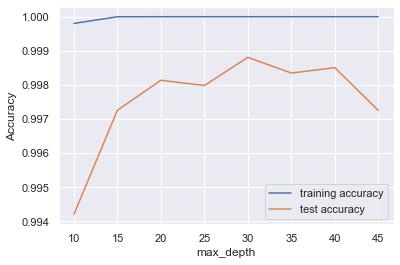

In [186]:
# scores of GridSearch CV
scores = rfd.cv_results_
print(scores["mean_train_score"].dtype)
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"],
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


We can see the 'max_depth' of 30 will give us the maximum test accuracy and the difference between test and train is least

In [187]:
# GridSearchCV to find optimal n_estimators

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100,1500,200)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=30)


# fit tree on training data
rfdn = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfdn.fit(X_train_ad, y_train_ad)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=30,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_

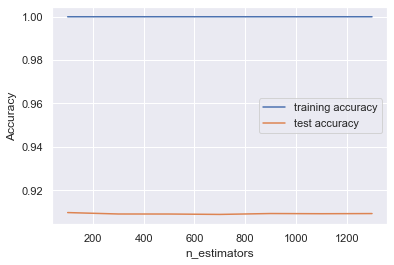

In [188]:
# scores of GridSearch CV
scores_est = pd.DataFrame(rfdn.cv_results_)
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_est["param_n_estimators"], 
         scores_est["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [42]:
# Will consider n_estimators to be 800

In [0]:
# As per the analysis of results, will be selecting 'n_estimators' to be '800'

In [32]:
# tuning Max_features


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': range(5, 24, 3)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 800)


# fit tree on training data
rfmx = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfmx.fit(X_train_ad, y_train_ad)



GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=30,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=800, n_jobs=None,
                                              oob_score=False,
                                              random_

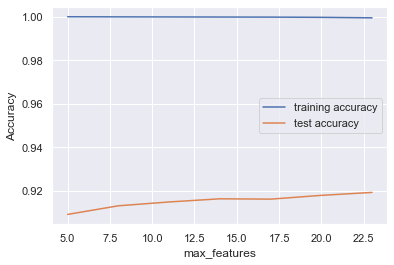

In [33]:
scores_mx = pd.DataFrame(rfmx.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_features"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above, the test score first achieves a peak at value of max features '14' and then '20'. Will first consider features to be 14

In [30]:
X_train_ad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398001 entries, 0 to 398000
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      398001 non-null  float64
 1   V2      398001 non-null  float64
 2   V3      398001 non-null  float64
 3   V4      398001 non-null  float64
 4   V5      398001 non-null  float64
 5   V6      398001 non-null  float64
 6   V7      398001 non-null  float64
 7   V8      398001 non-null  float64
 8   V9      398001 non-null  float64
 9   V10     398001 non-null  float64
 10  V11     398001 non-null  float64
 11  V12     398001 non-null  float64
 12  V13     398001 non-null  float64
 13  V14     398001 non-null  float64
 14  V15     398001 non-null  float64
 15  V16     398001 non-null  float64
 16  V17     398001 non-null  float64
 17  V18     398001 non-null  float64
 18  V19     398001 non-null  float64
 19  V20     398001 non-null  float64
 20  V21     398001 non-null  float64
 21  V22     39

In [31]:
X_test_ad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85443 entries, 0 to 85442
Data columns (total 28 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      85443 non-null  float64
 1   V2      85443 non-null  float64
 2   V3      85443 non-null  float64
 3   V4      85443 non-null  float64
 4   V5      85443 non-null  float64
 5   V6      85443 non-null  float64
 6   V7      85443 non-null  float64
 7   V8      85443 non-null  float64
 8   V9      85443 non-null  float64
 9   V10     85443 non-null  float64
 10  V11     85443 non-null  float64
 11  V12     85443 non-null  float64
 12  V13     85443 non-null  float64
 13  V14     85443 non-null  float64
 14  V15     85443 non-null  float64
 15  V16     85443 non-null  float64
 16  V17     85443 non-null  float64
 17  V18     85443 non-null  float64
 18  V19     85443 non-null  float64
 19  V20     85443 non-null  float64
 20  V21     85443 non-null  float64
 21  V22     85443 non-null  float64
 22

In [32]:
# tuning min_smaples_leaf


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(50, 1200, 100)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 800, max_features = 14)


# fit tree on training data
rfl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfl.fit(X_train_ad, y_train_ad)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=30,
                                              max_features=14,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=800, n_jobs=None,
                                              oob_score=False,
                                              random_stat

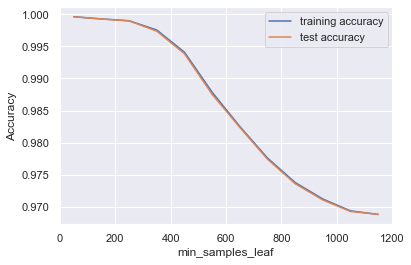

In [81]:
scores_l = pd.DataFrame(rfl.cv_results_)
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_min_samples_leaf"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can consider the min_samples_leaf to be '800' or '400' as after that there's a steep decline in accuarcy scores.  Will first consider '600' to see if it can result in good model with high performance and not suffer with overfitting. It that will put less computational load as well compared to '400' value. 

In [33]:
# tuning min_samples_split


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 1400, 200)}

# instantiate the model
rf = RandomForestClassifier(max_depth=30, n_estimators = 800, max_features = 14, min_samples_leaf = 600)


# fit tree on training data
rfsl = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
rfsl.fit(X_train_ad, y_train_ad)


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=30,
                                              max_features=14,
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=600,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=800, n_jobs=None,
                                              oob_score=False,
                                              random_st

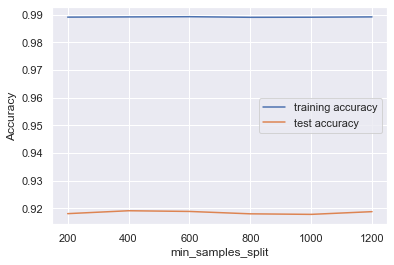

In [34]:
scores_sl = pd.DataFrame(rfsl.cv_results_)
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_sl["param_min_samples_split"], 
         scores_sl["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can see that min_samples_split of value '800' is most suited as at this point, testing and training accuracies are closest at this point and highest too.

# Following are therefore, the key hyper parameter tunned values:
1. max_features: 14 or 22
2. n_estimators: 900
3. max_depth: 30 
4. min_samples_leaf: 600 - 800
5. min_samples_split: 1200
We will now build model with these values

In [35]:
# Model-1 Adasyn with tuned parameters
rff1=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 14, min_samples_split = 1200)
rff1.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=14,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1200,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [36]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [38]:
predictions_train =rff1.predict(X_train_ad)

In [39]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [40]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.998902012809013


In [41]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9984185159152525


In [42]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9993868946212566


All scores are exceptionally great. Lets see the test scores


In [43]:
predictions_test =rff1.predict(X_test_ad)

In [44]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.39      0.77      0.52       142

    accuracy                           1.00     85443
   macro avg       0.70      0.88      0.76     85443
weighted avg       1.00      1.00      1.00     85443



In [45]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9976592582189295


In [46]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.39492753623188404


In [47]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


The label '1' specific precision, recall and hence, f1- score for test data can perhaps increased a bit. The label-1 recall score is still decent at '77' but precision score is quite low.Model can be further tuned to see if we can get better scores. Accuracy of both test and train are excellent and close to each other




In [59]:
# Model-1 Adasyn with tuned parameters
rff2=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 16, min_samples_leaf = 600)
rff2.fit(X_train_ad, y_train_ad)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-59-6f4172268ef0>", line 3, in <module>
    rff3.fit(X_train_ad, y_train_ad)
  File "C:\Users\pchadha\AppData\Roaming\Python\Python37\site-packages\sklearn\ensemble\_forest.py", line 383, in fit
    for i, t in enumerate(trees))
  File "C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\joblib\parallel.py", line 1004, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\joblib\parallel.py", line 835, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\pchadha\AppData\Local\Continuum\anaconda3\lib\site-packages\joblib\parallel.py", line 754, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\Users\pchadha\AppD

KeyboardInterrupt: 

In [49]:
predictions_train =rff2.predict(X_train_ad)

In [50]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99    199014
           1       0.99      1.00      0.99    198987

    accuracy                           0.99    398001
   macro avg       0.99      0.99      0.99    398001
weighted avg       0.99      0.99      0.99    398001



In [51]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9921733864990289


In [52]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9881715499107757


In [53]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9962711131882988


All scores are exceptionally great. Lets see the test scores


In [54]:
predictions_test =rff2.predict(X_test_ad)

In [55]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     85301
           1       0.09      0.83      0.17       142

    accuracy                           0.99     85443
   macro avg       0.55      0.91      0.58     85443
weighted avg       1.00      0.99      0.99     85443



In [56]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.986306660580738


In [57]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.09335443037974683


In [58]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.8309859154929577


The label-1 recall score has increased to '83' but precision score has reduced dramatically. Model needs to be tuned with different parameters as the approach considered did not give good results




In [60]:
# Model-1 Adasyn with tuned parameters
rff3=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 16, min_samples_split = 1400)
rff3.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=16,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1400,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [61]:
predictions_train =rff3.predict(X_train_ad)

In [62]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [63]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9980100552511174


In [64]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9976148032840393


In [65]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9984069311060522


All scores are exceptionally great. Lets see the test scores


In [66]:
predictions_test =rff3.predict(X_test_ad)

In [67]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.32      0.76      0.45       142

    accuracy                           1.00     85443
   macro avg       0.66      0.88      0.73     85443
weighted avg       1.00      1.00      1.00     85443



In [68]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9969687393935138


In [69]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.32432432432432434


In [70]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7605633802816901


The label-1 recall score has decreased to '76' but precision score has increased dramatically. Model needs to be tuned with similar approach to see if the label-'1' specific score recall and precision scores can be brought to parity, hence increase the F1-score further




In [80]:
# Model-1 Adasyn with tuned parameters
rff4=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 17, min_samples_split = 1400)
rff4.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=17,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1400,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [81]:
predictions_train =rff4.predict(X_train_ad)

In [82]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [83]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9978417139655428


In [84]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9972293607452618


In [85]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9984571856452934


All scores are exceptionally great. Lets see the test scores


In [88]:
predictions_test =rff4.predict(X_test_ad)

In [89]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.30      0.76      0.43       142

    accuracy                           1.00     85443
   macro avg       0.65      0.88      0.71     85443
weighted avg       1.00      1.00      1.00     85443



In [90]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9966059244174479


In [91]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.2967032967032967


In [92]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7605633802816901


The label-1 recall score has remained same at '76' but precision score has reduced a bit. Model needs to be tuned with different parameters as the approach considered did not give good results




In [104]:
# Model-6 Adasyn with tuned parameters
rff6=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 1200)
rff6.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1200,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [105]:
predictions_train =rff6.predict(X_train_ad)

In [106]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [107]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9989874397300509


In [108]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9985789605824755


In [109]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.999396945529105


All scores are exceptionally great. Lets see the test scores


In [110]:
predictions_test =rff6.predict(X_test_ad)

In [111]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.41      0.77      0.54       142

    accuracy                           1.00     85443
   macro avg       0.71      0.89      0.77     85443
weighted avg       1.00      1.00      1.00     85443



In [112]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9977762953079831


In [113]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.41044776119402987


In [114]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


The scores have improved by decreasing the max_features value. Model will be tuned further with similar approach to get better results



In [123]:
# Model-7 Adasyn with tuned parameters
rff7=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 11, min_samples_split = 1200)
rff7.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=11,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1200,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [124]:
predictions_train =rff7.predict(X_train_ad)

In [117]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [125]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9988015105489685


In [126]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9986936642717178


In [127]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9989094764984647


All scores are exceptionally great. Lets see the test scores


In [128]:
predictions_test =rff7.predict(X_test_ad)

In [129]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.42      0.77      0.54       142

    accuracy                           1.00     85443
   macro avg       0.71      0.88      0.77     85443
weighted avg       1.00      1.00      1.00     85443



In [130]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9978465175614152


In [131]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.41923076923076924


In [132]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Not getting beneficial results by decreasing max_features beyond value of '13'. Will try and optimize other parameters now



In [133]:
# Model-8 Adasyn with tuned parameters
rff8=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 1100)
rff8.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1100,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [134]:
predictions_train =rff8.predict(X_train_ad)

In [135]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [136]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9989648267215409


In [137]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9986940907606922


In [138]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9992361310035329


All scores are exceptionally great. Lets see the test scores


In [139]:
predictions_test =rff8.predict(X_test_ad)

In [140]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.42      0.77      0.55       142

    accuracy                           1.00     85443
   macro avg       0.71      0.89      0.77     85443
weighted avg       1.00      1.00      1.00     85443



In [141]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9978816286881312


In [142]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4247104247104247


In [143]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Not much improvement is scores. Model will be tuned further with similar approach to get better results



In [144]:
# Model-9 Adasyn with tuned parameters
rff9=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 1000)
rff9.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=1000,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [145]:
predictions_train =rff9.predict(X_train_ad)

In [146]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [147]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9992839213971825


In [148]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9988301333547558


In [149]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9997386763959455


All scores are exceptionally great. Lets see the test scores


In [150]:
predictions_test =rff9.predict(X_test_ad)

In [151]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.44      0.77      0.56       142

    accuracy                           1.00     85443
   macro avg       0.72      0.89      0.78     85443
weighted avg       1.00      1.00      1.00     85443



In [152]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9980103694860901


In [153]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4435483870967742


In [154]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Slight improvement is scores. Model will be tuned further with similar approach to get better results



In [163]:
# Model-9 Adasyn with tuned parameters
rff10=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 900)
rff10.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=900,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [164]:
predictions_train =rff10.predict(X_train_ad)

In [165]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [166]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9994623129087615


In [167]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9989607755526214


In [168]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999648218225311


All scores are exceptionally great. Lets see the test scores


In [169]:
predictions_test =rff10.predict(X_test_ad)

In [170]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.47      0.77      0.58       142

    accuracy                           1.00     85443
   macro avg       0.73      0.88      0.79     85443
weighted avg       1.00      1.00      1.00     85443



In [171]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9981508139929544


In [172]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4658119658119658


In [173]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Precision score has improved. Model will be tuned further with similar approach to get better results



In [174]:
# Model-11 Adasyn with tuned parameters
rff11=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 850)
rff11.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=850,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [175]:
predictions_train =rff11.predict(X_train_ad)

In [176]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [177]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9994849259172716


In [178]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9989808623009419


In [179]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999899490921518


All scores are exceptionally great. Lets see the test scores


In [182]:
predictions_test =rff11.predict(X_test_ad)

In [183]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.47      0.77      0.59       142

    accuracy                           1.00     85443
   macro avg       0.74      0.89      0.79     85443
weighted avg       1.00      1.00      1.00     85443



In [184]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9981859251196704


In [185]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4721030042918455


In [186]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Scores have improved a bit. Model will be tuned further with similar approach to get better results



In [187]:
# Model-12 Adasyn with tuned parameters
rff12=RandomForestClassifier(max_depth=30,n_estimators=900, max_features = 13, min_samples_split = 750)
rff12.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [188]:
predictions_train =rff12.predict(X_train_ad)

In [189]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [190]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9994899510302738


In [191]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9990059242895873


In [192]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999748727303793


All scores are exceptionally great. Lets see the test scores


In [193]:
predictions_test =rff12.predict(X_test_ad)

In [194]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.48      0.77      0.59       142

    accuracy                           1.00     85443
   macro avg       0.74      0.89      0.79     85443
weighted avg       1.00      1.00      1.00     85443



In [195]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9982093325374811


In [198]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.47619047619047616


In [199]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Scores are more or less static now. Model will be tuned further focussing on different parameter to get better results



In [200]:
# Model-13 Adasyn with tuned parameters
rff13=RandomForestClassifier(max_depth=30,n_estimators=1000, max_features = 13, min_samples_split = 750)
rff13.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [201]:
predictions_train =rff13.predict(X_train_ad)

In [202]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [203]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9995100514822827


In [204]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9990460506496898


In [205]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999748727303793


All scores are exceptionally great. Lets see the test scores


In [206]:
predictions_test =rff13.predict(X_test_ad)

In [207]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.48      0.77      0.59       142

    accuracy                           1.00     85443
   macro avg       0.74      0.89      0.80     85443
weighted avg       1.00      1.00      1.00     85443



In [208]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9982327399552918


In [209]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.48034934497816595


In [211]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Scores have improved a bit. Model will be tuned further with similar approach to get better results



In [212]:
# Model-14 Adasyn with tuned parameters
rff14=RandomForestClassifier(max_depth=30,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff14.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [213]:
predictions_train =rff14.predict(X_train_ad)

In [214]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [215]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9995075389257816


In [216]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9990410346783951


In [217]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999748727303793


All scores are exceptionally great. Lets see the test scores


In [218]:
predictions_test =rff14.predict(X_test_ad)

In [219]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.49      0.77      0.60       142

    accuracy                           1.00     85443
   macro avg       0.74      0.89      0.80     85443
weighted avg       1.00      1.00      1.00     85443



In [220]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9982795547909132


In [221]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4888888888888889


In [223]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Scores, particularly precision label-1 score, has improved. Will continue to tune with same approach

In [225]:
# Model-15 Adasyn with tuned parameters
rff15=RandomForestClassifier(max_depth=30,n_estimators=1200, max_features = 13, min_samples_split = 750)
rff15.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [226]:
predictions_train =rff15.predict(X_train_ad)

In [227]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [228]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9995100514822827


In [229]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9990360284371611


In [230]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999849236382277


All scores are exceptionally great. Lets see the test scores


In [233]:
predictions_test =rff15.predict(X_test_ad)

In [234]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.49      0.77      0.60       142

    accuracy                           1.00     85443
   macro avg       0.74      0.89      0.80     85443
weighted avg       1.00      1.00      1.00     85443



In [238]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9982795547909132


In [239]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.4888888888888889


In [240]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7746478873239436


Theres not been any improvement, so will now try and optimize different parameter. 

In [249]:
# Model-16 Adasyn with tuned parameters
rff16=RandomForestClassifier(max_depth=32,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff16.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=32, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [250]:
predictions_train =rff16.predict(X_train_ad)

In [251]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [252]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.999560302612305


In [253]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9991463806539729


In [254]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999748727303793


All scores are exceptionally great. Lets see the test scores


In [255]:
predictions_test =rff16.predict(X_test_ad)

In [256]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.51      0.77      0.61       142

    accuracy                           1.00     85443
   macro avg       0.75      0.88      0.81     85443
weighted avg       1.00      1.00      1.00     85443



In [257]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9983848881710614


In [258]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.5093457943925234


In [259]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Theres an improvement in Precision score, but slight reduction in recall. Will try tuning furher with this approach. 

In [260]:
# Model-17 Adasyn with tuned parameters
rff17=RandomForestClassifier(max_depth=34,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff17.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=34, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [261]:
predictions_train =rff17.predict(X_train_ad)

In [262]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [263]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9996180914118307


In [264]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9992517563638372


In [265]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999849236382277


All scores are exceptionally great. Lets see the test scores


In [266]:
predictions_test =rff17.predict(X_test_ad)

In [267]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.53      0.77      0.63       142

    accuracy                           1.00     85443
   macro avg       0.77      0.88      0.81     85443
weighted avg       1.00      1.00      1.00     85443



In [268]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9985019252601149


In [269]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.5343137254901961


In [270]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


roc_auc_score(y_train_pred3,y_train_smote)

Theres an improvement in Precision score, recall score remains the same. Will try tuning furher with this approach. 

In [271]:
# Model-18 Adasyn with tuned parameters
rff18=RandomForestClassifier(max_depth=36,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff18.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=36, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [272]:
predictions_train =rff18.predict(X_train_ad)

In [273]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [274]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9996582923158485


In [275]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.999347097849943


In [276]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999698472764552


All scores are exceptionally great. Lets see the test scores


In [277]:
predictions_test =rff18.predict(X_test_ad)

In [278]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.55      0.77      0.64       142

    accuracy                           1.00     85443
   macro avg       0.78      0.88      0.82     85443
weighted avg       1.00      1.00      1.00     85443



In [279]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9985838512224524


In [280]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.5532994923857868


In [281]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Theres an improvement in Precision score, recall score remains the same and there's improvemnt in macro precision and F1 scores as well. Will try tuning furher with this approach. 

In [282]:
# Model-19 Adasyn with tuned parameters
rff19=RandomForestClassifier(max_depth=38,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff19.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=38, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [283]:
predictions_train =rff19.predict(X_train_ad)

In [284]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [285]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9996984932198663


In [286]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9994173752756167


In [287]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999798981843036


All scores are exceptionally great. Lets see the test scores


In [288]:
predictions_test =rff19.predict(X_test_ad)

In [289]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.58      0.77      0.66       142

    accuracy                           1.00     85443
   macro avg       0.79      0.88      0.83     85443
weighted avg       1.00      1.00      1.00     85443



In [290]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9986774808936952


In [291]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.5767195767195767


In [292]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Theres an improvement in Precision score, recall score remains the same and there's improvemnt in macro precision and F1 scores as well. Will try tuning furher with this approach. 

In [293]:
# Model-20 Adasyn with tuned parameters
rff20=RandomForestClassifier(max_depth=40,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff20.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=40, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [294]:
predictions_train =rff20.predict(X_train_ad)

In [295]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [322]:
metrics.roc_auc_score(predictions_train,y_train_ad)

0.9997890087525451

In [296]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9997462317933875


In [297]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9995027224689076


In [298]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999899490921518


All scores are exceptionally great. Lets see the test scores


In [319]:
predictions_test =rff20.predict(X_test_ad)

In [320]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.59      0.77      0.67       142

    accuracy                           1.00     85443
   macro avg       0.80      0.88      0.83     85443
weighted avg       1.00      1.00      1.00     85443



In [321]:
metrics.roc_auc_score(predictions_test,y_test_ad)

0.7960021242179202

In [301]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.998735999438222


In [302]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.592391304347826


In [303]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Theres an improvement in Precision score, recall score remains the same and there's improvemnt in macro precision and F1 scores as well. Will try tuning furher with this approach. 

In [304]:
# Model-21 Adasyn with tuned parameters
rff21=RandomForestClassifier(max_depth=42,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff21.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=42, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [305]:
predictions_train =rff21.predict(X_train_ad)

In [306]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [318]:
metrics.roc_auc_score(predictions_train,y_train_ad)

0.9997890087525451

In [307]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9997889452539064


In [308]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9995930977318966


In [309]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999849236382277


All scores are exceptionally great. Lets see the test scores


In [310]:
predictions_test =rff21.predict(X_test_ad)

In [311]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.62      0.77      0.69       142

    accuracy                           1.00     85443
   macro avg       0.81      0.88      0.84     85443
weighted avg       1.00      1.00      1.00     85443



In [317]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test_ad))

auc score is :  0.8094655811104583


In [312]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9988296291094648


In [313]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.6193181818181818


In [314]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


Theres an improvement in Precision score, recall score remains the same and there's improvemnt in macro precision and F1 scores as well. The recall scores aren't improving though but the 'roc auc' score is increasing as well. Will continue to increase depth, but will also increase number of estimators to see if recall scores can be improved 

In [323]:
# Model-22 Adasyn with tuned parameters
rff22=RandomForestClassifier(max_depth=44,n_estimators=1200, max_features = 13, min_samples_split = 750)
rff22.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=44, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [324]:
predictions_train =rff22.predict(X_train_ad)

In [325]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [326]:
metrics.roc_auc_score(predictions_train,y_train_ad)

0.9998216507416106

In [327]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9998216084884208


In [328]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9996583807246348


In [329]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999849236382277


All scores are exceptionally great. Lets see the test scores


In [330]:
predictions_test =rff22.predict(X_test_ad)

In [331]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.62      0.77      0.69       142

    accuracy                           1.00     85443
   macro avg       0.81      0.88      0.84     85443
weighted avg       1.00      1.00      1.00     85443



In [332]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test_ad))

auc score is :  0.8112350638993694


In [333]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9988413328183702


In [334]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.6228571428571429


In [335]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


The scores have not improved by much. Will keep the number of estimators same now. Try optimizing another parameter with depth now.

In [336]:
# Model-23 Adasyn with tuned parameters
rff23=RandomForestClassifier(max_depth=46,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff23.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=46, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=700,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [337]:
predictions_train =rff23.predict(X_train_ad)

In [338]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [339]:
metrics.roc_auc_score(predictions_train,y_train_ad)

0.9998216537329987

In [340]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9998216084884208


In [341]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9996533603946668


In [342]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999899490921518


All scores are exceptionally great. Lets see the test scores


In [343]:
predictions_test =rff23.predict(X_test_ad)

In [344]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.63      0.77      0.69       142

    accuracy                           1.00     85443
   macro avg       0.81      0.88      0.85     85443
weighted avg       1.00      1.00      1.00     85443



In [345]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test_ad))

auc score is :  0.8148353987436032


In [346]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9988647402361809


In [347]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.630057803468208


In [348]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


The scores have not improved by much. Therefore, see no point in increasing the 'depth' further. Also, increasing the depth is not increasing the Try optimizing another parameter with depth now.

In [381]:
# Model-24 Adasyn with tuned parameters
rff24=RandomForestClassifier(max_depth=46,n_estimators=1100, max_features = 13, min_samples_split = 650)
rff24.fit(X_train_ad, y_train_ad)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=46, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=650,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [382]:
predictions_train =rff24.predict(X_train_ad)

In [383]:
print(classification_report(y_train_ad,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00    198987

    accuracy                           1.00    398001
   macro avg       1.00      1.00      1.00    398001
weighted avg       1.00      1.00      1.00    398001



In [384]:
metrics.roc_auc_score(predictions_train,y_train_ad)

0.9998417377521188

In [385]:
print(metrics.accuracy_score(y_train_ad, predictions_train))

0.9998417089404298


In [386]:
print(metrics.precision_score(y_train_ad, predictions_train))

0.9997035801489133


In [387]:
print(metrics.recall_score(y_train_ad, predictions_train))

0.9999798981843036


All scores are exceptionally great. Lets see the test scores


In [388]:
predictions_test =rff24.predict(X_test_ad)

In [389]:
print(classification_report(y_test_ad,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.63      0.77      0.69       142

    accuracy                           1.00     85443
   macro avg       0.81      0.88      0.84     85443
weighted avg       1.00      1.00      1.00     85443



In [390]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test_ad))

auc score is :  0.8130248855447728


In [391]:
print(metrics.accuracy_score(y_test_ad, predictions_test))

0.9988530365272755


In [392]:
print(metrics.precision_score(y_test_ad, predictions_test))

0.6264367816091954


In [393]:
print(metrics.recall_score(y_test_ad, predictions_test))

0.7676056338028169


The scores have not improved by much. Therefore, no further use of optimizing model futher. The best model for Adasyn is rff23 

## Summary for RandomForest trees model analysis
1. Best model for unbalanced data is rff8, with tuned features:- max_depth = 35, n_estimators = 700, max_features = 9, min_samples_split = 1000. The macro scores: precision = 0.64, recall = 0.93, f1-score = 0.72
2. Best model for "upsampled" data is rff13 withe tuned features:- max_depth = 15, n_estimators = 700, max_features = 9, min_samples_split = 800. The macro scores: precision = 0.89, recall = 0.90, f1-score = 0.90
3. Best model for "SMOTE" data is rff3, with tuned features:- max_depth = 21, n_estimators = 900, max_features = 8, min_samples_split = 800. The macro scores: precision = 0.83, recall = 0.91, f1-score = 0.86
4. Best model for "Adasyn" data is rff23 withe tuned features:- max_depth = 46, n_estimators = 1100, max_features = 13, min_samples_split = 750. The macro scores: precision = 0.81, recall = 0.88, f1-score = 0.85

Will now calculate best model from the results of best model configurations as per "upsampled", "SMOTE" and "Adasyn". The model that gave results without external balancing data did not have satisfactory macro precision and recall scores and so not considering them.

In [ ]:
# Best model analysis



In [394]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, test_size = 0.3, random_state = 100)

In [395]:
# Transforming the amount using PCA method
st = StandardScaler()

In [396]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199364 entries, 7610 to 56088
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      199364 non-null  float64
 1   V2      199364 non-null  float64
 2   V3      199364 non-null  float64
 3   V4      199364 non-null  float64
 4   V5      199364 non-null  float64
 5   V6      199364 non-null  float64
 6   V7      199364 non-null  float64
 7   V8      199364 non-null  float64
 8   V9      199364 non-null  float64
 9   V10     199364 non-null  float64
 10  V11     199364 non-null  float64
 11  V12     199364 non-null  float64
 12  V13     199364 non-null  float64
 13  V14     199364 non-null  float64
 14  V15     199364 non-null  float64
 15  V16     199364 non-null  float64
 16  V17     199364 non-null  float64
 17  V18     199364 non-null  float64
 18  V19     199364 non-null  float64
 19  V20     199364 non-null  float64
 20  V21     199364 non-null  float64
 21  V22     

In [397]:
cola = ['Amount']

In [398]:
X_train[cola] = st.fit_transform(X_train[cola])

In [399]:
X_test[cola] = st.transform(X_test[cola])

In [400]:
colp

['V1', 'V4', 'V6', 'V8', 'V10', 'V12', 'V15', 'V21', 'V23', 'V24', 'Amount']

In [401]:
X_train[colp] = pt.fit_transform(X_train[colp])

In [402]:
X_test[colp] = pt.fit_transform(X_test[colp])

In [403]:
X_train.index = pd.RangeIndex(0, len(X_train.index))
y_train.index = pd.RangeIndex(0, len(y_train.index))

In [404]:
X_test.index = pd.RangeIndex(0, len(X_test.index))
y_test.index = pd.RangeIndex(0, len(y_test.index))

In [ ]:
# Upsample model result


In [405]:
# Upsample model result with tuned parameters on original data
rff_up=RandomForestClassifier(max_depth=15,n_estimators=700, max_features = 9, min_samples_split = 800)
rff_up.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features=9,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=700,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [406]:
predictions_train =rff_up.predict(X_train)

In [407]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       0.84      0.75      0.79       350

    accuracy                           1.00    199364
   macro avg       0.92      0.88      0.90    199364
weighted avg       1.00      1.00      1.00    199364



In [408]:
metrics.roc_auc_score(predictions_train,y_train)

0.9185712708614326

In [410]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9993077988001846


In [411]:
print(metrics.precision_score(y_train, predictions_train))

0.8375796178343949


In [413]:
print(metrics.recall_score(y_train, predictions_train))

0.7514285714285714


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [414]:
predictions_test =rff_up.predict(X_test)

In [415]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.73      0.70      0.72       142

    accuracy                           1.00     85443
   macro avg       0.86      0.85      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [416]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.8647173310474734


In [417]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9990754069964772


In [418]:
print(metrics.precision_score(y_test, predictions_test))

0.7299270072992701


In [419]:
print(metrics.recall_score(y_test, predictions_test))

0.704225352112676


The test scores are consistent with train scores so overfiiting is not an issue. Lets try other models.

In [ ]:
# SMOTE model result


In [420]:
# SMOTE model result with tuned parameters on original data
rff_smt=RandomForestClassifier(max_depth=21,n_estimators=900, max_features = 8, min_samples_split = 800)
rff_smt.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=21, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=800,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [421]:
predictions_train =rff_smt.predict(X_train)

In [422]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       0.85      0.75      0.80       350

    accuracy                           1.00    199364
   macro avg       0.92      0.87      0.90    199364
weighted avg       1.00      1.00      1.00    199364



In [423]:
metrics.roc_auc_score(predictions_train,y_train)

0.9237271756297697

In [424]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9993228466523545


In [425]:
print(metrics.precision_score(y_train, predictions_train))

0.8478964401294499


In [426]:
print(metrics.recall_score(y_train, predictions_train))

0.7485714285714286


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [427]:
predictions_test =rff_smt.predict(X_test)

In [428]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.74      0.70      0.72       142

    accuracy                           1.00     85443
   macro avg       0.87      0.85      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [429]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.8719284290905437


In [430]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9990988144142879


In [431]:
print(metrics.precision_score(y_test, predictions_test))

0.7443609022556391


In [432]:
print(metrics.recall_score(y_test, predictions_test))

0.6971830985915493


The test scores are consistent with train scores so overfiiting is not an issue. Scores are more or less similar to the "upsample" one. Lets try with Adasyn model now. 

In [ ]:
# Adasyn model result


In [433]:
# Adasyn model result with tuned parameters on original data
rff_ad=RandomForestClassifier(max_depth=46,n_estimators=1100, max_features = 13, min_samples_split = 750)
rff_ad.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=46, max_features=13,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=750,
                       min_weight_fraction_leaf=0.0, n_estimators=1100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [434]:
predictions_train =rff_ad.predict(X_train)

In [435]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       0.81      0.77      0.79       350

    accuracy                           1.00    199364
   macro avg       0.91      0.89      0.90    199364
weighted avg       1.00      1.00      1.00    199364



In [436]:
metrics.roc_auc_score(predictions_train,y_train)

0.9054901602111559

In [437]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9992877349972914


In [438]:
print(metrics.precision_score(y_train, predictions_train))

0.811377245508982


In [439]:
print(metrics.recall_score(y_train, predictions_train))

0.7742857142857142


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [440]:
predictions_test =rff_ad.predict(X_test)

In [441]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.70      0.72      0.71       142

    accuracy                           1.00     85443
   macro avg       0.85      0.86      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [442]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.8514896658449363


In [443]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9990285921608558


In [444]:
print(metrics.precision_score(y_test, predictions_test))

0.7034482758620689


In [445]:
print(metrics.recall_score(y_test, predictions_test))

0.7183098591549296


The test scores are consistent with train scores so overfiiting is not an issue. Lets try other models 

# Highlighting the top features (7 being the most important ones)

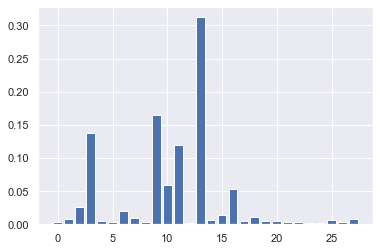

In [0]:
# plot
plt.bar(range(len(rff.feature_importances_)), rff8.feature_importances_)
plt.show()

In [0]:
imp_features = rff8.feature_importances_

In [0]:
imp_features.transpose()

array([0.00328783, 0.00751931, 0.02555213, 0.13819271, 0.00545624,
       0.00363608, 0.01959313, 0.0092649 , 0.00324334, 0.16494596,
       0.05860484, 0.11981207, 0.00261023, 0.31244155, 0.00646426,
       0.01387463, 0.05303728, 0.00454433, 0.01039989, 0.00495256,
       0.00476638, 0.00364678, 0.00289276, 0.00245686, 0.00256614,
       0.00576977, 0.00291081, 0.00755722])

In [0]:
colf = X_train.columns

In [0]:
imp_features.shape

(28,)

In [0]:
imp_ft_dat = pd.DataFrame(data = imp_features, index = colf)

In [0]:
imp_ft_dat.head()

,0
V1,0.003288
V2,0.007519
V3,0.025552
V4,0.138193
V5,0.005456


In [0]:
imp_ft_dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28 entries, V1 to Amount
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       28 non-null     float64
dtypes: float64(1)
memory usage: 1.7+ KB


In [0]:
imp_ft_dat.sort_values(by = 0, ascending = False, inplace = True)

In [0]:
# Highlighting top 9 features
imp_ft_dat.head(9)

,0
V14,0.312442
V10,0.164946
V4,0.138193
V12,0.119812
V11,0.058605
V17,0.053037
V3,0.025552
V7,0.019593
V16,0.013875


In [0]:
# As per the above dataframe, the top 9 features, also considered for modeling are:
'V14', 'V10', 'V4', 'V12', 'V11', 'V17', 'V3', 'V7' and 'V16'

In [ ]:
# Will now check results of other models over balanced data set

# Decision Tree Classifier with Balanced Data

### Random Oversampling 

In [110]:
from sklearn.utils import resample

In [120]:
# concatenate our training data back together
X = pd.concat([X_train, y_train], axis=1)

# separate minority and majority classes
not_fraud = X[X.Class==0]
fraud = X[X.Class==1]

# upsample minority
fraud_upsampled = resample(fraud,
                          replace=True, # sample with replacement
                          n_samples=int(len(not_fraud)*0.8), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
X_up = pd.concat([not_fraud, fraud_upsampled])

print(round(100*(X_up.Class.value_counts()/len(X_up.index)),2))

# We can see data is balanced now. Will start with modeling exercize now

y_train_up = X_up.Class
X_train_up = X_up.drop('Class', axis=1)

0    55.56
1    44.44
Name: Class, dtype: float64


In [112]:
X_train.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')

In [113]:
X_train_up.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')

In [121]:
# We can see that Minority class points are oversampled to 44.44 percent of total points


In [ ]:
# lets train Decision tree classified on this data

In [123]:
# starting of with default hyper parameters 
dtree1=DecisionTreeClassifier()
crossvalidation(X_train_up,y_train_up,dtree1,5)

train_recall_scores :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_precision_score : [1.0, 1.0, 1.0, 1.0, 1.0]
train_auc_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_accuracy_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
validation_recall_score :  [0.9995573542430758, 0.999497550558975, 0.9994048737705945, 0.9995283315514748, 0.9997506856145599]
validation_precision_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
validation_auc_score :  [0.9997786771215379, 0.9997487752794876, 0.9997024368852973, 0.9997641657757375, 0.99987534280728]
validation_accuracy_score :  [0.9998046002679768, 0.9997766829036805, 0.9997348109481207, 0.9997906402222005, 0.9998883414518402]
mean_train_recall_score :  1.00
mean_train_precision_score : 1.00
mean_train_auc_score :  1.00
mean_train_accuracy_score :  1.00
mean_validation_recall_score :  1.00
mean_validation_precision_score :  1.00
mean_validation_auc_score :  1.00
mean_validation_auccuracy_score :  1.00


In [124]:
# All the scores are good but we can see that model clearly overfits on the train data 
# Lets try tuning hyper parameters like max_depth,max_features,min_samples_leaf,min_samples_split to get rid of overfitting 

In [125]:
#using Grid Search CV algorithm for hyperparameter tuning

In [136]:
#Choosing between gini criterion and entropy 
param_grid={
    'criterion':['gini','entropy']
    }
n_folds=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring='roc_auc')
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy']},
             pre_d

In [137]:
cv_results=pd.DataFrame(gcv.cv_results_)

In [138]:
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,5.267718,0.431444,0.019357,0.001350,gini,{'criterion': 'gini'},0.999812,0.999849,0.999786,0.999786,0.999786,0.999804,0.000025,1
1,5.490533,0.109806,0.017762,0.000988,entropy,{'criterion': 'entropy'},0.999661,0.999724,0.999786,0.999686,0.999736,0.999719,0.000043,2


- we can see that gini index has better score than entropy

In [140]:
# Tuning Max_depth

In [144]:
param_grid={
    'criterion':['gini'],
    'max_depth':range(1,50,5)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring='roc_auc')
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini'], 'max_depth': range(1, 50, 5)},

In [145]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.765608,0.046200,0.017960,0.001092,gini,1,"{'criterion': 'gini', 'max_depth': 1}",0.922770,0.926050,0.925689,0.923729,0.924222,0.924492,0.001223,10
1,3.577839,0.017669,0.019748,0.001595,gini,6,"{'criterion': 'gini', 'max_depth': 6}",0.997380,0.987589,0.987341,0.997078,0.987373,0.991352,0.004800,9
2,4.724754,0.413575,0.018753,0.001164,gini,11,"{'criterion': 'gini', 'max_depth': 11}",0.999753,0.999507,0.999350,0.999586,0.999491,0.999538,0.000132,8
3,5.054083,0.512330,0.018552,0.001014,gini,16,"{'criterion': 'gini', 'max_depth': 16}",0.999776,0.999779,0.999625,0.999702,0.999773,0.999731,0.000060,6
4,5.323962,0.516460,0.018954,0.001543,gini,21,"{'criterion': 'gini', 'max_depth': 21}",0.999873,0.999759,0.999599,0.999700,0.999677,0.999722,0.000091,7


In [146]:
# we can see good scores from max_depth of 6 lets also check, precision recall scores

In [152]:
param_grid={
    'criterion':['gini'],
    'max_depth':range(1,50,5)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['roc_auc','precision','recall'],refit=False)
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini'], 'max_depth': range(1, 50, 5)},

In [153]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,params,split0_test_roc_auc,split1_test_roc_auc,split2_test_roc_auc,split3_test_roc_auc,split4_test_roc_auc,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,mean_test_recall,std_test_recall,rank_test_recall
0,0.722866,0.032431,0.047892,0.002749,gini,1,"{'criterion': 'gini', 'max_depth': 1}",0.922770,0.926050,0.925689,0.923729,0.924222,0.924492,0.001223,10,0.959795,0.961833,0.961643,0.958573,0.960144,0.960398,0.001214,10,0.874859,0.880036,0.879440,0.877807,0.877587,0.877946,0.001804,10
1,3.446594,0.071877,0.051267,0.004010,gini,6,"{'criterion': 'gini', 'max_depth': 6}",0.997380,0.987559,0.987341,0.997027,0.987358,0.991333,0.004795,9,0.990420,0.989349,0.987433,0.985730,0.987144,0.988015,0.001666,9,0.973967,0.974343,0.974688,0.976196,0.974217,0.974682,0.000792,9
2,4.436138,0.445463,0.050077,0.003844,gini,11,"{'criterion': 'gini', 'max_depth': 11}",0.999729,0.999483,0.999211,0.999586,0.999583,0.999518,0.000173,8,0.996651,0.998541,0.996801,0.994845,0.997467,0.996861,0.001208,8,1.000000,0.988663,0.988412,1.000000,0.989511,0.993317,0.005469,8
3,4.904112,0.552625,0.051078,0.003048,gini,16,"{'criterion': 'gini', 'max_depth': 16}",0.999794,0.999797,0.999683,0.999702,0.999793,0.999754,0.000050,7,0.999184,0.998808,0.997963,0.998495,0.998401,0.998570,0.000409,7,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1
4,5.171984,0.406011,0.050657,0.001928,gini,21,"{'criterion': 'gini', 'max_depth': 21}",0.999858,0.999780,0.999772,0.999721,0.999740,0.999774,0.000047,6,0.999372,0.999435,0.999059,0.998808,0.999341,0.999203,0.000236,6,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1


In [155]:
cv_results[['params','mean_test_roc_auc','mean_test_precision','mean_test_recall']]

,params,mean_test_roc_auc,mean_test_precision,mean_test_recall
0,"{'criterion': 'gini', 'max_depth': 1}",0.924492,0.960398,0.877946
1,"{'criterion': 'gini', 'max_depth': 6}",0.991333,0.988015,0.974682
2,"{'criterion': 'gini', 'max_depth': 11}",0.999518,0.996861,0.993317
3,"{'criterion': 'gini', 'max_depth': 16}",0.999754,0.998570,1.000000
4,"{'criterion': 'gini', 'max_depth': 21}",0.999774,0.999203,1.000000
5,"{'criterion': 'gini', 'max_depth': 26}",0.999795,0.999479,1.000000
6,"{'criterion': 'gini', 'max_depth': 31}",0.999786,0.999466,1.000000
7,"{'criterion': 'gini', 'max_depth': 36}",0.999794,0.999485,1.000000
8,"{'criterion': 'gini', 'max_depth': 41}",0.999789,0.999473,1.000000
9,"{'criterion': 'gini', 'max_depth': 46}",0.999797,0.999492,1.000000


In [156]:
# we can see that we are getting good results at depth of 11, or we can consider 6 also

In [158]:
param_grid={
    'criterion':['gini'],
    'max_depth':[6,11],
    'min_samples_leaf': range(50, 150, 50)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['roc_auc','precision','recall'],refit=False)
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini'], 'max_depth': [6, 11],
        

In [161]:
cv_results=pd.DataFrame(gcv.cv_results_)


In [169]:
cv_results[['params','mean_test_roc_auc','mean_test_precision','mean_test_recall']]

,params,mean_test_roc_auc,mean_test_precision,mean_test_recall
0,"{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 50}",0.991490,0.987543,0.974682
1,"{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 100}",0.991476,0.986495,0.974682
2,"{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 50}",0.999560,0.995512,0.993317
3,"{'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 100}",0.999505,0.991584,0.993317


In [168]:
pd.set_option('display.max_colwidth', -1)

- we can see that  all scores are good at max_depth of 11 and min_samples_leaf value:50

In [170]:
# lets try to fit the model using these values and check the scores on test data

In [171]:
dtree3=DecisionTreeClassifier(criterion='gini',max_depth=6,min_samples_leaf=50)

In [172]:
crossvalidation(X_train_up,y_train_up,dtree3,5)# funciton we defined for cross validation

train_recall_scores :  [0.9860237761905892, 0.9869488983918187, 0.9889048416686608, 0.9876127738794215, 0.9877525292822265]
train_precision_score : [0.9769596087835614, 0.976528401419286, 0.9738431689825543, 0.9741660061681406, 0.9737367858041782]
train_auc_score :  [0.9838335091094118, 0.984162476303405, 0.9841248539842694, 0.98357611253715, 0.9835232257032687]
train_accuracy_score :  [0.9835757254316301, 0.9838270135978702, 0.9835269322967735, 0.983080299662583, 0.9829930667262177]
validation_recall_score :  [0.9866973650550013, 0.9854338188727042, 0.9898957702483027, 0.9874904263466939, 0.9871260886028019]
validation_precision_score :  [0.9760232808249509, 0.9777554354656277, 0.9733287366408625, 0.9734797244156416, 0.9751870324189527]
validation_auc_score :  [0.9839619181129969, 0.9838817083980912, 0.984382756256892, 0.9832890101518392, 0.9836018379442492]
validation_accuracy_score :  [0.983614336757481, 0.9836978519686798, 0.9836978519686798, 0.982762711627842, 0.983195388501961]
m

- we can see that model is not overfitting and giving good auc,recall and precision scores

In [174]:
# Checking scores on test data

In [176]:
y_test_pred=dtree3.predict(X_test)
print(classification_report(y_test_pred,y_test))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     84476
           1       0.83      0.13      0.22       967

    accuracy                           0.99     85443
   macro avg       0.91      0.56      0.61     85443
weighted avg       0.99      0.99      0.99     85443



In [178]:
print(roc_auc_score(y_test_pred,y_test))

0.5634507880272487


In [179]:
# we are seeing good precision score but very poor recall score and average auc score
# Random oversampling clearly didn't help in improving the performance, lets try using SMOTE for oversampling

# SMOTE

In [180]:
X_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,1.445692,-0.149880,-1.092234,0.368105,-0.225796,-0.931864,0.082871,-0.301648,0.733270,0.138158,-0.908262,-0.409325,-1.216003,0.534920,0.196855,-0.103995,-0.158785,-0.802113,0.083010,-0.313465,-0.395420,-0.779702,0.586820,-0.175555,-0.356438,0.205392,-0.075806,-1.032424
1,-0.168557,1.112008,-0.391539,-0.340794,1.014727,-0.589994,1.042734,-0.238026,-0.200830,-0.804936,-0.537991,0.333235,1.034272,-1.222412,-0.431847,0.290628,0.298838,-0.333729,-0.226373,0.084311,-0.442209,-0.755443,0.117042,1.000062,-0.383245,0.110292,0.229167,-0.982501
2,1.540551,0.215237,-2.221643,0.027795,0.815822,-1.129044,0.843943,-0.616503,0.009745,0.022332,-0.476749,0.950682,1.144607,0.555759,0.263245,-0.661516,-0.362293,-0.647254,0.126100,-0.133286,0.225184,0.611995,-0.056913,1.496788,0.505014,0.203037,-0.083225,-0.917327
3,-0.457140,0.100332,1.721509,-0.598829,-0.371977,0.055891,-0.144740,0.084501,-1.843755,0.517523,1.627755,-0.452579,-0.100123,0.125968,0.756345,0.591865,0.665795,-1.191246,1.690163,0.295444,0.202774,0.217167,-0.035562,-0.067283,-0.326120,-0.285113,0.118226,-0.425881
4,-0.500691,1.871311,-1.106687,0.786730,1.239594,-0.435205,1.100319,0.144093,-0.917002,-0.785152,-0.888776,-0.408620,-0.076494,-0.756161,-0.242246,-0.554555,1.442972,0.385060,0.585502,0.024939,0.097412,0.366613,-0.416204,0.814595,0.091257,-0.398552,0.330173,-0.857193


In [ ]:
#checking class percentages before using smote to do oversampling

In [182]:
y_train.value_counts()/len(y_train)

0    0.998275
1    0.001725
Name: Class, dtype: float64

In [183]:
from imblearn.over_sampling import SMOTE

Using TensorFlow backend.


In [187]:
sm = SMOTE(random_state=0)
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

In [188]:
y_train_smote.value_counts()/len(y_train_smote)

1    0.5
0    0.5
Name: Class, dtype: float64

In [189]:
# here we have default sampling strategy so minority class is oversample to 50 percent

In [190]:
dtree1=DecisionTreeClassifier()
crossvalidation(X_train_smote,y_train_smote,dtree1,5)

train_recall_scores :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_precision_score : [1.0, 1.0, 1.0, 1.0, 1.0]
train_auc_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_accuracy_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
validation_recall_score :  [0.9976865240023135, 0.9973494219215429, 0.9976241684589606, 0.997669581777633, 0.9974277009140402]
validation_precision_score :  [0.9992947636198776, 0.9989885964246884, 0.998948238299151, 0.9989963366286947, 0.9989495010129812]
validation_auc_score :  [0.9984918651988677, 0.9981746359495196, 0.998282075648389, 0.9983310252405959, 0.9981830917247753]
validation_accuracy_score :  [0.9984926138076575, 0.9981785750175862, 0.998279067430409, 0.9983293136368204, 0.9981785750175862]
mean_train_recall_score :  1.00
mean_train_precision_score : 1.00
mean_train_auc_score :  1.00
mean_train_accuracy_score :  1.00
mean_validation_recall_score :  1.00
mean_validation_precision_score :  1.00
mean_validation_auc_score :  1.00
mean_validation_auccuracy_score :  1.00


In [195]:
# we can see that model is overfitted on train data, we will try to reduce it by hyper parameter tuning

In [196]:
# Tuning max_depth

In [207]:
param_grid={
    'criterion':['gini'],
    'max_depth':[5,50,10]
#    'min_samples_leaf': range(50, 150, 50)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['roc_auc','precision','recall'],refit=False,n_jobs=-1)
gcv.fit(X_train_smote,y_train_smote)



GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [5, 50, 10]},
     

In [208]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results[['params','mean_test_roc_auc','mean_test_precision','mean_test_recall']]

,params,mean_test_roc_auc,mean_test_precision,mean_test_recall
0,"{'criterion': 'gini', 'max_depth': 5}",0.990912,0.962286,0.957416
1,"{'criterion': 'gini', 'max_depth': 50}",0.998284,0.997417,0.999156
2,"{'criterion': 'gini', 'max_depth': 10}",0.997797,0.984362,0.993036


In [194]:
# we can see that scores are good at all the tree depths, so lets select depth 5 since we can reduce the fit time

In [211]:
param_grid={
    'criterion':['gini'],
    'max_depth':[5],
    'min_samples_leaf': range(10, 100, 25)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['roc_auc','precision','recall'],refit=False,n_jobs=-1,return_train_score=True)
gcv.fit(X_train_smote,y_train_smote)


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [5],
              

In [213]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results[['params','mean_train_roc_auc','mean_test_roc_auc','mean_train_precision','mean_test_precision','mean_train_recall','mean_test_recall']]

,params,mean_train_roc_auc,mean_test_roc_auc,mean_train_precision,mean_test_precision,mean_train_recall,mean_test_recall
0,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10}",0.991089,0.990907,0.962641,0.962281,0.957718,0.957406
1,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 35}",0.991074,0.990894,0.962581,0.962204,0.957640,0.957306
2,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 60}",0.991048,0.990869,0.962495,0.962111,0.957495,0.957150
3,"{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 85}",0.991032,0.990856,0.962313,0.961946,0.957508,0.957155


In [200]:
# clearly the min_samples is not effecting the range since we have max_depth , lets try tuning the max_features

In [214]:
param_grid={
    'criterion':['gini'],
    'max_depth':[5],
    'max_features': range(10,40,10)
    }
n_fold=5
estimator=DecisionTreeClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['roc_auc','precision','recall'],refit=False,n_jobs=-1,return_train_score=True)
gcv.fit(X_train_smote,y_train_smote)


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [5],
              

In [215]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results[['params','mean_train_roc_auc','mean_test_roc_auc','mean_train_precision','mean_test_precision','mean_train_recall','mean_test_recall']]

,params,mean_train_roc_auc,mean_test_roc_auc,mean_train_precision,mean_test_precision,mean_train_recall,mean_test_recall
0,"{'criterion': 'gini', 'max_depth': 5, 'max_features': 10}",0.981941,0.981362,0.957427,0.956561,0.946601,0.946332
1,"{'criterion': 'gini', 'max_depth': 5, 'max_features': 20}",0.988040,0.988028,0.973897,0.973755,0.942234,0.941800
2,"{'criterion': 'gini', 'max_depth': 5, 'max_features': 30}",NaN,NaN,NaN,NaN,NaN,NaN


In [203]:
# we can see that max_features 20 has improved the test precision values

In [206]:
# so we will fit model with max_depth as 5 and max_features as 20 and see the results on test data 

In [218]:
dtree2=DecisionTreeClassifier(max_depth=5,max_features=20,criterion='gini')
crossvalidation(X_train_smote,y_train_smote,dtree2,5)

train_recall_scores :  [0.9629465781041642, 0.9709101843144029, 0.9692469956532856, 0.9622762148337596, 0.9654081444276811]
train_precision_score : [0.9563825580446531, 0.9516589223118938, 0.953119990948349, 0.9644647726273199, 0.9535711366394406]
train_auc_score :  [0.959784910078168, 0.961679933789789, 0.9616038425350235, 0.9633411985914253, 0.9598211457776146]
train_accuracy_score :  [0.9597653502160587, 0.9615114058888554, 0.9614705808461461, 0.9633391116470706, 0.9597465078886545]
validation_recall_score :  [0.9636188104977008, 0.9703125804624337, 0.9695146818923328, 0.9620415233600281, 0.9649726665316866]
validation_precision_score :  [0.9553182379165303, 0.9528685933904776, 0.9524954298449904, 0.9615346012947258, 0.9536529851679548]
validation_auc_score :  [0.959770495516448, 0.9622963441924629, 0.9612656627214785, 0.9617498628742315, 0.959379290169275]
validation_accuracy_score :  [0.9597276655612501, 0.9621017988141896, 0.9611471208923726, 0.9617500753693096, 0.959338257461561

- clearly we have good train and validation scores and model is not overfitted 

In [221]:
y_test_pred2=dtree2.predict(X_test)
print(classification_report(y_test_pred2,y_test))
print('auc score is : ',roc_auc_score(y_test_pred2,y_test))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98     82504
           1       0.86      0.04      0.08      2939

    accuracy                           0.97     85443
   macro avg       0.91      0.52      0.53     85443
weighted avg       0.96      0.97      0.95     85443

auc score is :  0.5214787218746662


In [222]:
# precision score is improved but recall score is really low


In [223]:
# testing on model1

In [224]:
y_test_pred1=dtree1.predict(X_test)
print(classification_report(y_test_pred1,y_test))
print('auc score is : ',roc_auc_score(y_test_pred1,y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85121
           1       0.80      0.37      0.51       322

    accuracy                           1.00     85443
   macro avg       0.90      0.68      0.75     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.6846122629525334


In [225]:
# so the recall and area under the curve score is better before hyper paramter tuning

In [227]:
cm(y_test_pred,y_test)

array([[84451,    25],
       [  844,   123]], dtype=int64)

In [228]:
help(SMOTE)

Help on class SMOTE in module imblearn.over_sampling._smote:

class SMOTE(BaseSMOTE)
 |  SMOTE(sampling_strategy='auto', random_state=None, k_neighbors=5, n_jobs=None)
 |  
 |  Class to perform over-sampling using SMOTE.
 |  
 |  This object is an implementation of SMOTE - Synthetic Minority
 |  Over-sampling Technique as presented in [1]_.
 |  
 |  Read more in the :ref:`User Guide <smote_adasyn>`.
 |  
 |  Parameters
 |  ----------
 |  sampling_strategy : float, str, dict or callable, default='auto'
 |      Sampling information to resample the data set.
 |  
 |      - When ``float``, it corresponds to the desired ratio of the number of
 |        samples in the minority class over the number of samples in the
 |        majority class after resampling. Therefore, the ratio is expressed as
 |        :math:`\alpha_{os} = N_{rm} / N_{M}` where :math:`N_{rm}` is the
 |        number of samples in the minority class after resampling and
 |        :math:`N_{M}` is the number of samples in th

In [229]:
#lets try changing  the sampling strategy to 0.2, (ratio of minority over majority) and changing K value to 7

In [230]:
over=SMOTE(sampling_strategy=0.2,k_neighbors=7,n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

In [231]:
dtree3=DecisionTreeClassifier(max_depth=5,max_features=20)
dtree3.fit(X_train_smote,y_train_smote)
y_train_pred3=dtree3.predict(X_train_smote)
y_test_pred3=dtree3.predict(X_test)

In [235]:
print('Train Scores: ')
print(classification_report(y_train_pred3,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred3,y_train_smote))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    202487
           1       0.89      0.98      0.93     36337

    accuracy                           0.98    238824
   macro avg       0.94      0.98      0.96    238824
weighted avg       0.98      0.98      0.98    238824

auc score is :  0.978909880168818


In [236]:
print('Test Scores: ')
print(classification_report(y_test_pred3,y_test))
print('auc score is : ',roc_auc_score(y_test_pred3,y_test))

Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85002
           1       0.85      0.29      0.43       441

    accuracy                           1.00     85443
   macro avg       0.92      0.64      0.71     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.642727734137348


In [237]:
# we can see that recall score is improved but it is not good enough 
# lets decrease sampling strategy and increase the k value and check the scores

In [238]:
over=SMOTE(sampling_strategy=0.1,k_neighbors=10,n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

In [239]:
dtree4=DecisionTreeClassifier(max_depth=5,max_features=20)
dtree4.fit(X_train_smote,y_train_smote)
y_train_pred4=dtree4.predict(X_train_smote)
y_test_pred4=dtree4.predict(X_test)

In [241]:
print('Train Scores: ')
print(classification_report(y_train_pred4,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred4,y_train_smote))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    200863
           1       0.88      0.97      0.92     18059

    accuracy                           0.99    218922
   macro avg       0.94      0.98      0.96    218922
weighted avg       0.99      0.99      0.99    218922

auc score is :  0.9778496982430939


In [243]:
print('Test Scores: ')
print(classification_report(y_test_pred4,y_test))
print('auc score is : ',roc_auc_score(y_test_pred4,y_test))

Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85060
           1       0.84      0.32      0.47       383

    accuracy                           1.00     85443
   macro avg       0.92      0.66      0.73     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.6617388186744544


In [244]:
# we can see that the recall values and f1 score are improving, Lets do one more iteration by increasing k value to 20 after that we can try adasyn

In [249]:
over=SMOTE(sampling_strategy=0.1,k_neighbors=20,n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

dtree5=DecisionTreeClassifier(max_depth=5,max_features=20)
dtree5.fit(X_train_smote,y_train_smote)
y_train_pred5=dtree5.predict(X_train_smote)
y_test_pred5=dtree5.predict(X_test)

In [250]:
print('Train Scores: ')
print(classification_report(y_train_pred5,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred5,y_train_smote))

print('Test Scores: ')
print(classification_report(y_test_pred5,y_test))
print('auc score is : ',roc_auc_score(y_test_pred5,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    200618
           1       0.88      0.96      0.92     18304

    accuracy                           0.99    218922
   macro avg       0.94      0.97      0.95    218922
weighted avg       0.99      0.99      0.99    218922

auc score is :  0.9726174516177702
Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84988
           1       0.84      0.27      0.41       455

    accuracy                           1.00     85443
   macro avg       0.92      0.64      0.71     85443
weighted avg       1.00      1.00      0.99     85443

auc score is :  0.6372273241419473


In [247]:
# it didn't improve the scores much

In [251]:
over=SMOTE(sampling_strategy=0.2,k_neighbors=20,n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

dtree5=DecisionTreeClassifier()#default model 
dtree5.fit(X_train_smote,y_train_smote)
y_train_pred5=dtree5.predict(X_train_smote)
y_test_pred5=dtree5.predict(X_test)

print('Train Scores: ')
print(classification_report(y_train_pred5,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred5,y_train_smote))

print('Test Scores: ')
print(classification_report(y_test_pred5,y_test))
print('auc score is : ',roc_auc_score(y_test_pred5,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       1.00      1.00      1.00     39804

    accuracy                           1.00    238824
   macro avg       1.00      1.00      1.00    238824
weighted avg       1.00      1.00      1.00    238824

auc score is :  1.0
Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     84956
           1       0.80      0.24      0.37       487

    accuracy                           1.00     85443
   macro avg       0.90      0.62      0.69     85443
weighted avg       0.99      1.00      0.99     85443

auc score is :  0.6220059147902434


In [252]:
# Tried training the default model but it resulted in overfitting 
# Best model we have got using SMOTE is with (sampling_strategy=0.1,k_neighbors=10) where we got precision score of 0.85 and recall value of 0.32

# Adasyn

In [253]:
from imblearn.over_sampling import ADASYN

In [254]:
adasyn=ADASYN()
X_train_ada,y_train_ada=adasyn.fit_resample(X_train,y_train)

In [255]:
# Directly fitting the model with best hyper paramters we got previously
dtree_ada=DecisionTreeClassifier(max_depth=5,max_features=20)
dtree_ada.fit(X_train_ada,y_train_ada)


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=20, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [257]:
y_train_pred=dtree_ada.predict(X_train_ada)
y_test_pred=dtree_ada.predict(X_test)

print('Train Scores: ')
print(classification_report(y_train_pred,y_train_ada))
print('auc score is : ',roc_auc_score(y_train_pred,y_train_ada))

print('Test Scores: ')
print(classification_report(y_test_pred,y_test))
print('auc score is : ',roc_auc_score(y_test_pred,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       0.92      0.93      0.92    198135
           1       0.93      0.92      0.92    199860

    accuracy                           0.92    397995
   macro avg       0.92      0.92      0.92    397995
weighted avg       0.92      0.92      0.92    397995

auc score is :  0.9248238639483098
Test Scores: 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     78881
           1       0.89      0.02      0.04      6562

    accuracy                           0.92     85443
   macro avg       0.91      0.51      0.50     85443
weighted avg       0.92      0.92      0.89     85443

auc score is :  0.5099564905814687


In [ ]:
# even in this case the recall score is very bad

In [258]:
# Training the model with out max_features restriction to see if it improved the performance

In [259]:
dtree_ada=DecisionTreeClassifier(max_depth=5)
dtree_ada.fit(X_train_ada,y_train_ada)
y_train_pred=dtree_ada.predict(X_train_ada)
y_test_pred=dtree_ada.predict(X_test)

print('Train Scores: ')
print(classification_report(y_train_pred,y_train_ada))
print('auc score is : ',roc_auc_score(y_train_pred,y_train_ada))

print('Test Scores: ')
print(classification_report(y_test_pred,y_test))
print('auc score is : ',roc_auc_score(y_test_pred,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       0.92      0.93      0.93    196550
           1       0.93      0.92      0.93    201445

    accuracy                           0.93    397995
   macro avg       0.93      0.93      0.93    397995
weighted avg       0.93      0.93      0.93    397995

auc score is :  0.9281248550956809
Test Scores: 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     78738
           1       0.88      0.02      0.04      6705

    accuracy                           0.92     85443
   macro avg       0.90      0.51      0.50     85443
weighted avg       0.92      0.92      0.89     85443

auc score is :  0.5095799548844999


In [260]:
# still seeing very low recall score, which is not acceptable

In [ ]:
# The model for Decision tree using balanced we got so far isusing SMOTE is with (sampling_strategy=0.1,k_neighbors=10) where we got precision score of 0.85 and recall value of 0.32

# XGboost with Balanced Data set

In [261]:
# Random Oversampling

In [264]:
# concatenate our training data back together
X = pd.concat([X_train, y_train], axis=1)

# separate minority and majority classes
not_fraud = X[X.Class==0]
fraud = X[X.Class==1]

# upsample minority
fraud_upsampled = resample(fraud,
                          replace=True, # sample with replacement
                          n_samples=int(len(not_fraud)*0.7), # match number in majority class
                          random_state=27) # reproducible results

# combine majority and upsampled minority
X_up = pd.concat([not_fraud, fraud_upsampled])

print(round(100*(X_up.Class.value_counts()/len(X_up.index)),2))

# We can see data is balanced now. Will start with modeling exercize now

y_train_up = X_up.Class
X_train_up = X_up.drop('Class', axis=1)

0    58.82
1    41.18
Name: Class, dtype: float64


In [265]:
xgb1=XGBClassifier()
crossvalidation(X_train_up,y_train_up,xgb1,5)

train_recall_scores :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_precision_score : [1.0, 1.0, 1.0, 1.0, 1.0]
train_auc_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
train_accuracy_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
validation_recall_score :  [0.9998201050586457, 0.9998560581525063, 0.9996425124226933, 0.9998917514613552, 0.9998218802322681]
validation_precision_score :  [1.0, 1.0, 1.0, 1.0, 1.0]
validation_auc_score :  [0.9999100525293229, 0.9999280290762531, 0.9998212562113467, 0.9999458757306776, 0.9999109401161341]
validation_accuracy_score :  [0.9999261087383806, 0.9999408869907045, 0.9998522174767612, 0.9999556652430284, 0.9999261076463808]
mean_train_recall_score :  1.00
mean_train_precision_score : 1.00
mean_train_auc_score :  1.00
mean_train_accuracy_score :  1.00
mean_validation_recall_score :  1.00
mean_validation_precision_score :  1.00
mean_validation_auc_score :  1.00
mean_validation_auccuracy_score :  1.00


In [266]:
# So the model is overfitted on train data

In [267]:
#tuning n_estimators

In [269]:
param_grid={
    'n_estimators':[30,50,100]
    }
n_folds=5
estimator=XGBClassifier()
gcv=GridSearchCV(estimator,param_grid,cv=n_folds,scoring=['precision','recall','roc_auc'],refit=False,n_jobs=-1)
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estim...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     subsample=None, tree_method=Non

In [270]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results[['params','mean_test_roc_auc','mean_test_precision','mean_test_recall']]

,params,mean_test_roc_auc,mean_test_precision,mean_test_recall
0,{'n_estimators': 30},0.999979,0.999541,1.0
1,{'n_estimators': 50},0.999988,0.999720,1.0
2,{'n_estimators': 100},0.999992,0.999749,1.0


In [271]:
# we can see good scores in all three cases, lets select 30 estimators since it will reduce the training time

In [272]:
xgb=XGBClassifier(n_estimators=30)
param_grid = {
    'learning_rate': [0.2,0.6], 
             'subsample': [0.3, 0.6, 0.9]
} 
gcv=GridSearchCV(xgb,
                param_grid=param_grid,
                  scoring=['precision','recall','roc_auc'],refit=False,n_jobs=-1 ,
                cv=3,
                return_train_score=True)
gcv.fit(X_train_up,y_train_up)

GridSearchCV(cv=3, error_score=nan,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estim...
                                     objective='binary:logistic',
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     subsample=None, tree_method=Non

In [273]:
cv_results=pd.DataFrame(gcv.cv_results_)
cv_results[['params','mean_train_roc_auc','mean_test_roc_auc','mean_train_precision','mean_test_precision','mean_train_recall','mean_test_recall']]

,params,mean_train_roc_auc,mean_test_roc_auc,mean_train_precision,mean_test_precision,mean_train_recall,mean_test_recall
0,"{'learning_rate': 0.2, 'subsample': 0.3}",0.999967,0.999947,0.999003,0.998724,1.0,1.0
1,"{'learning_rate': 0.2, 'subsample': 0.6}",0.999978,0.999957,0.999182,0.998874,1.0,1.0
2,"{'learning_rate': 0.2, 'subsample': 0.9}",0.999981,0.999964,0.999326,0.998996,1.0,1.0
3,"{'learning_rate': 0.6, 'subsample': 0.3}",0.999998,0.999982,0.999846,0.999541,1.0,1.0
4,"{'learning_rate': 0.6, 'subsample': 0.6}",1.000000,0.999980,0.999964,0.999648,1.0,1.0
5,"{'learning_rate': 0.6, 'subsample': 0.9}",1.000000,0.999987,0.999986,0.999634,1.0,1.0


In [274]:
# the values are close in all the scenarios , lets pick learning_rate=0.2 and subsample=0.3 to makes sure the model is not overfitted

In [275]:
# building the model with best values we got so far
xgb2=XGBClassifier(n_estimators=30,learning_rate=0.2,subsample=0.3)
xgb2.fit(X_train_up,y_train_up)


XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=0.3, tree_method=None,
              validate_parameters=False, verbosity=None)

In [276]:
y_train_pred_up=xgb2.predict(X_train_up)
y_test_pred_up=xgb2.predict(X_test)


In [277]:
print('Train Scores: ')
print(classification_report(y_train_pred_up,y_train_up))
print('auc score is : ',roc_auc_score(y_train_pred_up,y_train_up))

print('Test Scores: ')
print(classification_report(y_test_pred_up,y_test))
print('auc score is : ',roc_auc_score(y_test_pred_up,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    198905
           1       1.00      1.00      1.00    139429

    accuracy                           1.00    338334
   macro avg       1.00      1.00      1.00    338334
weighted avg       1.00      1.00      1.00    338334

auc score is :  0.9995876037266279
Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85236
           1       0.85      0.61      0.71       207

    accuracy                           1.00     85443
   macro avg       0.93      0.80      0.85     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.8042187726353633


In [278]:
# Scores are good, even though recall score is low overall f1-score is good
#Looking at scores it looks overfitted  so lets try reducing number of estimators
# but the scores we got for xgb classifier are better than Decision Tree

# SMOTE

In [283]:
# Lets try training the model with best hyper parameters we got earlier with SMOTE oversampled data
over=SMOTE(n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

In [285]:
xgb=XGBClassifier(n_estimators=30,subsample=0.3,learning_rate=0.2)
xgb.fit(X_train_smote,y_train_smote)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=0.3, tree_method=None,
              validate_parameters=False, verbosity=None)

In [287]:
y_train_pred_smote=xgb.predict(X_train_smote)
y_test_pred_smote=xgb.predict(X_test)

In [288]:
print('Train Scores: ')
print(classification_report(y_train_pred_smote,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred_smote,y_train_smote))

print('Test Scores: ')
print(classification_report(y_test_pred_smote,y_test))
print('auc score is : ',roc_auc_score(y_test_pred_smote,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    198960
           1       1.00      1.00      1.00    199080

    accuracy                           1.00    398040
   macro avg       1.00      1.00      1.00    398040
weighted avg       1.00      1.00      1.00    398040

auc score is :  0.9953824186553684
Test Scores: 
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     84880
           1       0.86      0.23      0.36       563

    accuracy                           0.99     85443
   macro avg       0.93      0.61      0.68     85443
weighted avg       0.99      0.99      0.99     85443

auc score is :  0.6126649282740402


In [289]:
# recall score is not good in this case 

In [290]:
# Trying with changing defualt values for sampling strategy and K_neighbors
over=SMOTE(sampling_strategy=0.1,k_neighbors=10,n_jobs=-1)
X_train_smote,y_train_smote=over.fit_resample(X_train,y_train)

In [291]:
xgb=XGBClassifier(n_estimators=30,subsample=0.3,learning_rate=0.2)
xgb.fit(X_train_smote,y_train_smote)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=0.3, tree_method=None,
              validate_parameters=False, verbosity=None)

In [292]:
y_train_pred_smote=xgb.predict(X_train_smote)
y_test_pred_smote=xgb.predict(X_test)

In [293]:
print('Train Scores: ')
print(classification_report(y_train_pred_smote,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred_smote,y_train_smote))

print('Test Scores: ')
print(classification_report(y_test_pred_smote,y_test))
print('auc score is : ',roc_auc_score(y_test_pred_smote,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199628
           1       0.96      0.99      0.98     19294

    accuracy                           1.00    218922
   macro avg       0.98      0.99      0.99    218922
weighted avg       1.00      1.00      1.00    218922

auc score is :  0.994612122218935
Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85245
           1       0.85      0.64      0.73       198

    accuracy                           1.00     85443
   macro avg       0.93      0.82      0.86     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.8180527783554353


In [294]:
# Recall scores are good in this but not as good as we got on the unbalanced data

In [295]:
# trying removing subsample and learningrate

In [296]:
xgb=XGBClassifier(n_estimators=30)
xgb.fit(X_train_smote,y_train_smote)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=30, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [297]:
y_train_pred_smote=xgb.predict(X_train_smote)
y_test_pred_smote=xgb.predict(X_test)

In [298]:
print('Train Scores: ')
print(classification_report(y_train_pred_smote,y_train_smote))
print('auc score is : ',roc_auc_score(y_train_pred_smote,y_train_smote))

print('Test Scores: ')
print(classification_report(y_test_pred_smote,y_test))
print('auc score is : ',roc_auc_score(y_test_pred_smote,y_test))

Train Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199261
           1       0.98      1.00      0.99     19661

    accuracy                           1.00    218922
   macro avg       0.99      1.00      0.99    218922
weighted avg       1.00      1.00      1.00    218922

auc score is :  0.9972718005654871
Test Scores: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85258
           1       0.84      0.68      0.75       185

    accuracy                           1.00     85443
   macro avg       0.92      0.84      0.88     85443
weighted avg       1.00      1.00      1.00     85443

auc score is :  0.837702953134936


In [299]:
# We are not able to improve the recall score even after multiple trails with balanced data set

In [300]:
# Model Summary for Decision Tree and Xgboost

- Both Decision Tree and Xgboost clasfier gave us good auc ,recall scores on unbalanced data set while precison scores are not that good.
- For Decision tree we tried tuning hyper parameters like max_depth,max_features to improve the precision and recall values with no success
- Best performer in Decision Tree classifier with unbalanced data set  is precision-0.71,recall-0.83,f1-0.76, auc-0.91
- In case of xgboost classifier we tried tuning hyper parameters like n_estimators and subsample to improve the precison values and eliminate overfitting
- Best test scores we got for xgboost on unbalanced  data set are Precision-0.76, recall-0.93 and auc-0.96 , accuracy ~100
- We also tried implementing xgboost,Decision tree on balanced data, using random oversampling,SMOTE,ADASYN.We experimented smapling strategy,K_neigbors for SMOTE but  balancing the data resulted in very low recall and auc scores
- Best results on balanced data for Decision tree are precision-0.32,recall-0.84,f1-0.47,auc-0.66 using SMOTE (sampling_strategy=0.1,k_neighbors=10)
- Best results on balanced data for xgboost are precision-0.84,recall-0.68,f1-0.75,auc-0.83 with SMOTE,got close results using OVersampling also
- From out observation model are performing poorly in case of balanced data sets
- keeping in mind cost saving recall score is important than precision since a false negative may result in more loss than a false positive
- Will now analyse the XGBoost classifier performance on unbalanced data


## XGBClassifier parameter tuning over unbalanced data

In [449]:
# tuning Max_depth


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(4,92 ,4)}

# instantiate the model
xg = XGBClassifier()


# fit tree on training data
xgmd = GridSearchCV(xg, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgmd.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(4, 92, 4)}, pre_dispatch='2*n_jobs',
             refit=True, return_train_score=True, scoring='accuracy',
             verbose=0)

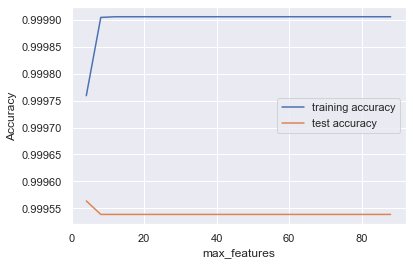

In [451]:
scores_mx = pd.DataFrame(xgmd.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_mx["param_max_depth"], 
         scores_mx["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_mx["param_max_depth"], 
         scores_mx["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above, the test score first achieves a peak at value of max depth of 5 and stabilizes at value of 10. Will first consider features to be 14

In [452]:
# tuning n_estimators


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(50,500 ,50)}

# instantiate the model
xg = XGBClassifier(max_depth = 5)


# fit tree on training data
xgn = GridSearchCV(xg, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgn.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=5, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'n_estimators': range(50, 500, 50)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose

In [455]:
scores_n.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_n_estimators', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

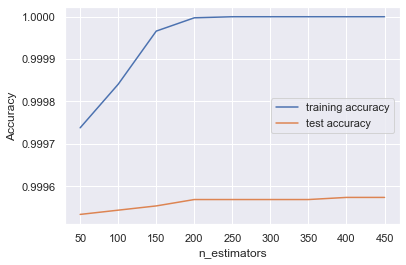

In [456]:
scores_n = pd.DataFrame(xgn.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_n["param_n_estimators"], 
         scores_n["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_n["param_n_estimators"], 
         scores_n["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above, the test score first achieves a peak at value of n_estiamtors of 200 and stabilizes at value of 400. Will first consider n_estimators to be 200

In [457]:
# tuning n_feature


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'num_feature': range(4,25,2)}

# instantiate the model
xg = XGBClassifier(max_depth = 5, n_estimators = 200)


# fit tree on training data
xgf = GridSearchCV(xg, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgf.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=5, min_child_weight=1,
                                     missing=None, n_estimators=200, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'num_feature': range(4, 25, 2)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=0)

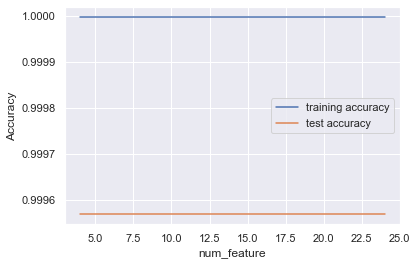

In [458]:
scores_f = pd.DataFrame(xgf.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_f["param_num_feature"], 
         scores_f["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_f["param_num_feature"], 
         scores_f["mean_test_score"], 
         label="test accuracy")
plt.xlabel("num_feature")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above, the test score is pretty much flat for all possible values of number of features in range set. Will first consider value to be 15

In [469]:
# tuning subsample


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'subsample': np.arange(0.1,1.1,0.1)}

# instantiate the model
xg = XGBClassifier(max_depth = 5, n_estimators = 200, num_feature = 15)


# fit tree on training data
xgs = GridSearchCV(xg, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgs.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=5, min_child_weight=1,
                                     missing=None, n_estimators=200, n_jobs=1,
                                     nthread=None, num_feature=15,
                                     objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'subsample': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             pre_dispatch=

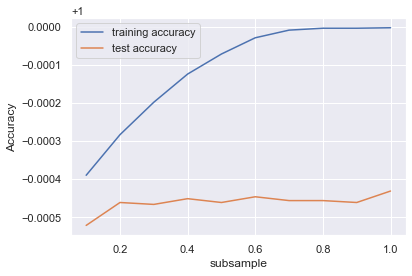

In [470]:
scores_s = pd.DataFrame(xgs.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_s["param_subsample"], 
         scores_s["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_s["param_subsample"], 
         scores_s["mean_test_score"], 
         label="test accuracy")
plt.xlabel("subsample")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [466]:
scores_s

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,48.770915,12.956643,0.275332,0.105544,0.1,{'subsample': 0.1},0.999549,0.999473,0.999348,0.999498,0.999523,0.999478,0.000070,10,0.999599,0.999611,0.999599,0.999611,0.999630,0.999610,0.000011
1,65.354456,9.347501,0.344298,0.080537,0.2,{'subsample': 0.2},0.999649,0.999498,0.999448,0.999523,0.999574,0.999539,0.000068,6,0.999680,0.999743,0.999737,0.999730,0.999693,0.999717,0.000025
2,95.202839,21.685654,0.395885,0.084678,0.3,{'subsample': 0.30000000000000004},0.999674,0.999448,0.999448,0.999523,0.999574,0.999534,0.000085,9,0.999812,0.999824,0.999818,0.999787,0.999768,0.999802,0.000021
3,104.172104,21.452549,0.427392,0.055714,0.4,{'subsample': 0.4},0.999624,0.999448,0.999498,0.999574,0.999599,0.999549,0.000065,3,0.999893,0.999875,0.999868,0.999875,0.999868,0.999876,0.000009
4,118.910298,27.279451,0.465613,0.125754,0.5,{'subsample': 0.5},0.999599,0.999423,0.999523,0.999574,0.999574,0.999539,0.000063,6,0.999931,0.999918,0.999944,0.999906,0.999944,0.999929,0.000015
5,117.454115,19.481842,0.453433,0.158400,0.6,{'subsample': 0.6},0.999624,0.999473,0.999523,0.999574,0.999574,0.999554,0.000051,2,0.999969,0.999962,0.999987,0.999969,0.999969,0.999971,0.000009
6,103.631913,18.028179,0.384084,0.041943,0.7,{'subsample': 0.7000000000000001},0.999649,0.999448,0.999523,0.999549,0.999549,0.999544,0.000064,4,0.999987,0.999994,0.999987,0.999994,0.999994,0.999991,0.000003
7,113.098409,6.547162,0.426572,0.094405,0.8,{'subsample': 0.8},0.999599,0.999473,0.999523,0.999574,0.999549,0.999544,0.000043,4,1.000000,1.000000,0.999994,0.999994,0.999994,0.999996,0.000003
8,118.166519,19.615372,0.439636,0.120654,0.9,{'subsample': 0.9},0.999624,0.999473,0.999498,0.999574,0.999523,0.999539,0.000054,8,1.000000,1.000000,0.999994,0.999994,0.999994,0.999996,0.000003
9,160.003967,42.580903,0.468532,0.094875,1,{'subsample': 1.0},0.999649,0.999523,0.999523,0.999574,0.999574,0.999569,0.000046,1,1.000000,1.000000,0.999994,1.000000,0.999994,0.999997,0.000003


In [ ]:
# From graph above, the test score is max at 1.0 value of subsample

In [471]:
# tuning learning rate


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'learning_rate': np.arange(0.1,1.1,0.1)}

# instantiate the model
xg = XGBClassifier(max_depth = 5, n_estimators = 200, num_feature = 15, subsample = 1)


# fit tree on training data
xgl = GridSearchCV(xg, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgl.fit(X_train, y_train)



GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=5, min_child_weight=1,
                                     missing=None, n_estimators=200, n_jobs=1,
                                     nthread=None, num_feature=15,
                                     objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             pre_dispa

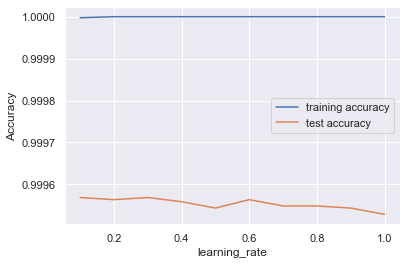

In [472]:
scores_l = pd.DataFrame(xgl.cv_results_)
# plotting accuracies with max_features
plt.figure()
plt.plot(scores_l["param_learning_rate"], 
         scores_l["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_l["param_learning_rate"], 
         scores_l["mean_test_score"], 
         label="test accuracy")
plt.xlabel("learning_rate")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [ ]:
# From graph above, the test score is max at learning rate value of 0.3 

As per the tuning exercise the best set of tuned parameters are as follows:
Learning rate : 0.3
Subsample : 1
num_feature : 15
n_estimators : 200
max_depth : 5

Below is the tuned Model with unbalance data

In [473]:
xgub=XGBClassifier(max_depth = 5, n_estimators=200, num_feature = 15, subsample=1,learning_rate=0.3)

In [474]:
xgub.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [475]:
predictions_train =xgub.predict(X_train)

In [476]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [477]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [478]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [479]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [480]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [481]:
predictions_test =xgub.predict(X_test)

In [482]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.77      0.84       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [483]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9619973534395241


In [484]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995201479348805


In [485]:
print(metrics.precision_score(y_test, predictions_test))

0.9243697478991597


In [486]:
print(metrics.recall_score(y_test, predictions_test))

0.7746478873239436


The test scores are almost consistent with train scores so overfiiting is not an issue. However, recall score can be better. So lets Lets try and tune model further 

In [565]:
xgub1=XGBClassifier(max_depth = 5, n_estimators=50, num_feature = 15, subsample=1,learning_rate=0.3)

In [566]:
xgub1.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=50, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [567]:
predictions_train =xgub1.predict(X_train)

In [568]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      0.97      0.98       350

    accuracy                           1.00    199364
   macro avg       1.00      0.98      0.99    199364
weighted avg       1.00      1.00      1.00    199364



In [569]:
metrics.roc_auc_score(predictions_train,y_train)

0.9999723652807436

In [570]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9999448245420437


In [571]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [572]:
print(metrics.recall_score(y_train, predictions_train))

0.9685714285714285


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [573]:
predictions_test =xgub1.predict(X_test)

In [574]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.75      0.83       142

    accuracy                           1.00     85443
   macro avg       0.96      0.88      0.91     85443
weighted avg       1.00      1.00      1.00     85443



In [575]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9610018032049524


In [576]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9994850368081645


In [577]:
print(metrics.precision_score(y_test, predictions_test))

0.9224137931034483


In [578]:
print(metrics.recall_score(y_test, predictions_test))

0.7535211267605634


The scores have reduced so clealy reducing number of estimators has not helped. Will try one more value of n_estimators and check the difference

In [579]:
xgub2=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=1,learning_rate=0.3)

In [580]:
xgub2.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [581]:
predictions_train =xgub2.predict(X_train)

In [582]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [583]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [584]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [585]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [586]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [587]:
predictions_test =xgub2.predict(X_test)

In [588]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.77      0.84       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [589]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9619973534395241


In [590]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995201479348805


In [591]:
print(metrics.precision_score(y_test, predictions_test))

0.9243697478991597


In [592]:
print(metrics.recall_score(y_test, predictions_test))

0.7746478873239436


The scores are almost same as original model. So will keep the estimators at this value. Will tune other parameters

In [593]:
xgub3=XGBClassifier(max_depth = 3, n_estimators=150, num_feature = 15, subsample=1,learning_rate=0.3)

In [594]:
xgub3.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [595]:
predictions_train =xgub3.predict(X_train)

In [596]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [597]:
metrics.roc_auc_score(predictions_train,y_train)

0.9999974876265608

In [598]:
print(metrics.accuracy_score(y_train, predictions_train))

0.9999949840492767


In [599]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [600]:
print(metrics.recall_score(y_train, predictions_train))

0.9971428571428571


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [601]:
predictions_test =xgub3.predict(X_test)

In [602]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.76      0.83       142

    accuracy                           1.00     85443
   macro avg       0.96      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [589]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9619973534395241


In [590]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995201479348805


In [591]:
print(metrics.precision_score(y_test, predictions_test))

0.9243697478991597


In [592]:
print(metrics.recall_score(y_test, predictions_test))

0.7746478873239436


The scores are not satisfactory. Will try see if increasing depth can increase recall

In [603]:
xgub4=XGBClassifier(max_depth = 10, n_estimators=150, num_feature = 15, subsample=1,learning_rate=0.3)

In [604]:
xgub4.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=1, verbosity=1)

In [605]:
predictions_train =xgub4.predict(X_train)

In [606]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [607]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [608]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [609]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [610]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [611]:
predictions_test =xgub4.predict(X_test)

In [612]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.77      0.85       142

    accuracy                           1.00     85443
   macro avg       0.97      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [613]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9659141766029189


In [614]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995318516437859


In [615]:
print(metrics.precision_score(y_test, predictions_test))

0.9322033898305084


In [616]:
print(metrics.recall_score(y_test, predictions_test))

0.7746478873239436


Recall score is not improving. Will focus on different parameter now

In [627]:
xgub5=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [628]:
xgub5.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [784]:
predictions_train =xgub5.predict(X_train)

In [785]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [786]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [787]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [788]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [789]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [790]:
predictions_test =xgub5.predict(X_test)

In [791]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [792]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [793]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [794]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [795]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


Recall score has indeed improved. Will see if tuning this further improves recall further

In [641]:
xgub6=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.7,learning_rate=0.3)

In [642]:
xgub6.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.7, verbosity=1)

In [643]:
predictions_train =xgub6.predict(X_train)

In [644]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [645]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [646]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [647]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [648]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [649]:
predictions_test =xgub6.predict(X_test)

In [650]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.91      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [651]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.955108744125416


In [652]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995201479348805


In [653]:
print(metrics.precision_score(y_test, predictions_test))

0.9105691056910569


In [654]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


Scores have reduced. So will not reduce this parameter. However, will try with 0.9 value

In [655]:
xgub7=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.9,learning_rate=0.3)

In [656]:
xgub7.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.9, verbosity=1)

In [657]:
predictions_train =xgub7.predict(X_train)

In [658]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [659]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [660]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [661]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [662]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [663]:
predictions_test =xgub7.predict(X_test)

In [664]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.94      0.79      0.86       142

    accuracy                           1.00     85443
   macro avg       0.97      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [665]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9704124348159403


In [666]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995669627705019


In [667]:
print(metrics.precision_score(y_test, predictions_test))

0.9411764705882353


In [669]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


Value of subsample of 0.8 is apt as recall is best at this value. Will now see if learning rate can be tuned

In [670]:
xgub8=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.2)

In [671]:
xgub8.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.2, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [672]:
predictions_train =xgub8.predict(X_train)

In [673]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [674]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [675]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [676]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [677]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [678]:
predictions_test =xgub8.predict(X_test)

In [679]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.77      0.84       142

    accuracy                           1.00     85443
   macro avg       0.96      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [680]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9616710285200654


In [681]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995084442259752


In [682]:
print(metrics.precision_score(y_test, predictions_test))

0.923728813559322


In [683]:
print(metrics.recall_score(y_test, predictions_test))

0.7676056338028169


Scores have reduced. Will see if incresaing the learning rate value has positive effect

In [684]:
xgub9=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.4)

In [685]:
xgub9.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.4, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [686]:
predictions_train =xgub9.predict(X_train)

In [687]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [688]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [689]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [690]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [691]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [692]:
predictions_test =xgub9.predict(X_test)

In [693]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.76      0.83       142

    accuracy                           1.00     85443
   macro avg       0.96      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [694]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9613392256666288


In [695]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9994967405170698


In [696]:
print(metrics.precision_score(y_test, predictions_test))

0.9230769230769231


In [697]:
print(metrics.recall_score(y_test, predictions_test))

0.7605633802816901


Incresaing the learning rate value also does not have positive effect. Will check if learning rate value of above 0.5, i.e., 0.6 also show the same trend

In [698]:
xgub10=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.6)

In [699]:
xgub10.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.6, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [700]:
predictions_train =xgub10.predict(X_train)

In [701]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [702]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [703]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [704]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [705]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [706]:
predictions_test =xgub10.predict(X_test)

In [707]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [708]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9588405867830668


In [709]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995318516437859


In [711]:
print(metrics.precision_score(y_test, predictions_test))

0.9180327868852459


In [712]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


Value of recall score increased. Lets see if it increases further with increase in learning rate value

In [713]:
xgub11=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.7)

In [714]:
xgub11.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.7, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [715]:
predictions_train =xgub11.predict(X_train)

In [716]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [717]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [718]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [719]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [720]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [721]:
predictions_test =xgub11.predict(X_test)

In [722]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.91      0.77      0.83       142

    accuracy                           1.00     85443
   macro avg       0.95      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [723]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9539732838742191


In [724]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9994850368081645


In [725]:
print(metrics.precision_score(y_test, predictions_test))

0.9083333333333333


In [726]:
print(metrics.recall_score(y_test, predictions_test))

0.7676056338028169


Scores have reduced. Will just check value at 0.5

In [727]:
xgub12=XGBClassifier(max_depth = 5, n_estimators=150, num_feature = 15, subsample=0.8,learning_rate=0.5)

In [728]:
xgub12.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.5, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [729]:
predictions_train =xgub12.predict(X_train)

In [730]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [731]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [732]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [733]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [734]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [735]:
predictions_test =xgub12.predict(X_test)

In [736]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.92      0.76      0.83       142

    accuracy                           1.00     85443
   macro avg       0.96      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443



In [737]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9574278804372116


In [738]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9994850368081645


In [739]:
print(metrics.precision_score(y_test, predictions_test))

0.9152542372881356


In [740]:
print(metrics.recall_score(y_test, predictions_test))

0.7605633802816901


Its clear that learning rate value of 0.3 is best. Lets now try few iterations by fixing num_feature, learning rate and subsample

In [741]:
xgub13=XGBClassifier(max_depth = 5, n_estimators=100, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [742]:
xgub13.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [743]:
predictions_train =xgub13.predict(X_train)

In [744]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [745]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [746]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [747]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [748]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [749]:
predictions_test =xgub13.predict(X_test)

In [750]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [751]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9626341127563236


In [752]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995435553526912


In [753]:
print(metrics.precision_score(y_test, predictions_test))

0.9256198347107438


In [754]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


Scores have deteriorated after decreasing the n_estimators value. Lets try with increased value to original value

In [774]:
xgub14=XGBClassifier(max_depth = 5, n_estimators=200, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [775]:
xgub14.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [776]:
predictions_train =xgub14.predict(X_train)

In [777]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [778]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [779]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [780]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [781]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [782]:
predictions_test =xgub14.predict(X_test)

In [783]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [751]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9626341127563236


In [752]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995435553526912


In [753]:
print(metrics.precision_score(y_test, predictions_test))

0.9256198347107438


In [754]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


Scores at n_estimator value of 150 is still best. Lets try with slightly lower value of n_estimator than 150

In [796]:
xgub15=XGBClassifier(max_depth = 5, n_estimators=140, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [797]:
xgub15.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=140, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [798]:
predictions_train =xgub15.predict(X_train)

In [799]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [800]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [801]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [802]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [803]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [804]:
predictions_test =xgub15.predict(X_test)

In [805]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [806]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [807]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [808]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [809]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


Scores are same as received at n_estimator value of 150. Lets reduce value further

In [810]:
xgub16=XGBClassifier(max_depth = 5, n_estimators=130, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [811]:
xgub16.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [812]:
predictions_train =xgub16.predict(X_train)

In [813]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [814]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [815]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [816]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [817]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [818]:
predictions_test =xgub16.predict(X_test)

In [819]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [820]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [821]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [822]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [823]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


Scores are same as received at n_estimator value of 150. Lets reduce value further

In [838]:
xgub17=XGBClassifier(max_depth = 5, n_estimators=110, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [840]:
xgub17.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=110, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [841]:
predictions_train =xgub17.predict(X_train)

In [842]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [843]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [844]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [845]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [846]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [847]:
predictions_test =xgub17.predict(X_test)

In [848]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [849]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9626341127563236


In [851]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995435553526912


In [852]:
print(metrics.precision_score(y_test, predictions_test))

0.9256198347107438


In [853]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


The recall score has reduced at n_estimator value of 120. However, till value of 130, scores remained the same. Lets see we can get better value at n_estimator value of 170 and 180

In [854]:
xgub18=XGBClassifier(max_depth = 5, n_estimators=170, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [855]:
xgub18.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=170, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [856]:
predictions_train =xgub18.predict(X_train)

In [857]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [858]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [859]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [860]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [861]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [862]:
predictions_test =xgub18.predict(X_test)

In [863]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [864]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [865]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [866]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [867]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


The recall score has reduced at n_estimator value of 120. However, till value of 130, scores remained the same. Lets see we can get better value at n_estimator value of 170 and 180

In [868]:
xgub19=XGBClassifier(max_depth = 5, n_estimators=180, num_feature = 15, subsample=0.8,learning_rate=0.3)

In [869]:
xgub19.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=180, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [870]:
predictions_train =xgub19.predict(X_train)

In [871]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [872]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [873]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [874]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [875]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [876]:
predictions_test =xgub19.predict(X_test)

In [877]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.79      0.85       142

    accuracy                           1.00     85443
   macro avg       0.96      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [878]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9626341127563236


In [879]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995435553526912


In [880]:
print(metrics.precision_score(y_test, predictions_test))

0.9256198347107438


In [881]:
print(metrics.recall_score(y_test, predictions_test))

0.7887323943661971


The scores have reduced at n_estimator value of 180. Will keep the value of n_estimator at 130. Lets see now if max_depth manipulation can be done which could increase recall score further  

In [883]:
# tuning Max_depth
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(3, 122, 2)}
xgub20=XGBClassifier(n_estimators=130, num_feature = 15, subsample=0.8,learning_rate=0.3)
# fit tree on training data
xgf = GridSearchCV(xgub20, parameters, 
                    cv=n_folds, 
                   scoring="accuracy", return_train_score=True)
xgf.fit(X_train, y_train)


GridSearchCV(cv=5, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.3, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=130, n_jobs=1,
                                     nthread=None, num_feature=15,
                                     objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=0.8, verbosity=1),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(3, 122, 2)},
             pre_dispatch='2*n_jobs', refit=True, return_train_sc

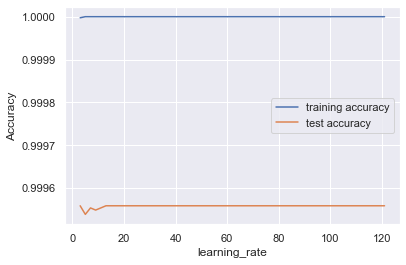

In [885]:
scores_f = pd.DataFrame(xgf.cv_results_)
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores_f["param_max_depth"], 
         scores_f["mean_train_score"], 
         label="training accuracy")
plt.plot(scores_f["param_max_depth"], 
         scores_f["mean_test_score"], 
         label="test accuracy")
plt.xlabel("learning_rate")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


From the above graph, test score gets maximum and stabilized at max_depth value of around 15

In [886]:
xgf = XGBClassifier(max_depth = 15, n_estimators = 130, num_feature = 15, subsample = 0.8, learning_rate = 0.3)

In [887]:
xgf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=15,
              min_child_weight=1, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [888]:
predictions_train =xgf.predict(X_train)

In [889]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [890]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [891]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [892]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [893]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [894]:
predictions_test =xgf.predict(X_test)

In [895]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [896]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [897]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [898]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [899]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


The scores are the same as the best model attained so far. Will now try with higher value of max_depth

In [914]:
xgf1 = XGBClassifier(max_depth = 17, n_estimators = 130, num_feature = 15, subsample = 0.8, learning_rate = 0.3)

In [915]:
xgf1.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=17,
              min_child_weight=1, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [916]:
predictions_train =xgf1.predict(X_train)

In [917]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [918]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [919]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [920]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [921]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [922]:
predictions_test =xgf1.predict(X_test)

In [923]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [910]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [911]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [912]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [913]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


The scores are the same as the best model attained so far. Will now try with higher value of max_depth

In [924]:
xgf2 = XGBClassifier(max_depth = 19, n_estimators = 130, num_feature = 15, subsample = 0.8, learning_rate = 0.3)

In [925]:
xgf2.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=19,
              min_child_weight=1, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [926]:
predictions_train =xgf2.predict(X_train)

In [927]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199014
           1       1.00      1.00      1.00       350

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [928]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [929]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [930]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [931]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [932]:
predictions_test =xgf2.predict(X_test)

In [933]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85301
           1       0.93      0.80      0.86       142

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [934]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9629448076607896


In [935]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995552590615966


In [936]:
print(metrics.precision_score(y_test, predictions_test))

0.9262295081967213


In [937]:
print(metrics.recall_score(y_test, predictions_test))

0.795774647887324


The scores are the same as the best model attained so far. This shows that value of max_depth of 5 gives best results as attained by models with max_depth value of 15 or greater

1. The best performance of XGBoost classifier over unbalanced data is with parameters : (max_depth = 5, n_estimators = 130, num_feature = 15, subsample = 0.8, learning_rate = 0.3)
2. The scores attained were : Test AuC: 96%, Recall: 90%, precision: 96% and f1: 93%.
3. This is also the best scores attained by any model analysed over balanced or unbalanced data.
4. Therefore, will select this model as the best and main model to calculate the "cost-benefit" analysis

In [ ]:
# Getting performance result over the enitire dataset using the best model, based on XGBoost and data being unbalanced

In [42]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

In [23]:
y

0         0
1         0
2         0
3         0
4         0
         ..
284802    0
284803    0
284804    0
284805    0
284806    0
Name: Class, Length: 284807, dtype: int64

In [58]:
# Normalizing the "Amount" column
X_train[cola] = st.fit_transform(X_train[cola])

In [59]:
X_test[cola] = st.transform(X_test[cola])

In [60]:
# Correcting the skewness in the respective columns
X_train[colp] = pt.fit_transform(X_train[colp])

In [61]:
X_test[colp] = pt.transform(X_test[colp])

In [62]:
X_train.index = pd.RangeIndex(0, len(X_train.index))
y_train.index = pd.RangeIndex(0, len(y_train.index))

In [63]:
X_test.index = pd.RangeIndex(0, len(X_test.index))
y_test.index = pd.RangeIndex(0, len(y_test.index))

In [74]:
xgbfin = XGBClassifier(max_depth = 5, n_estimators = 130, num_feature = 15, subsample = 0.8, learning_rate = 0.3)

In [75]:
xgbfin.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.3, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=130, n_jobs=1,
              nthread=None, num_feature=15, objective='binary:logistic',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=None, subsample=0.8, verbosity=1)

In [76]:
predictions_train =xgbfin.predict(X_train)

In [77]:
print(classification_report(y_train,predictions_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199020
           1       1.00      1.00      1.00       344

    accuracy                           1.00    199364
   macro avg       1.00      1.00      1.00    199364
weighted avg       1.00      1.00      1.00    199364



In [78]:
metrics.roc_auc_score(predictions_train,y_train)

1.0

In [79]:
print(metrics.accuracy_score(y_train, predictions_train))

1.0


In [80]:
print(metrics.precision_score(y_train, predictions_train))

1.0


In [81]:
print(metrics.recall_score(y_train, predictions_train))

1.0


All macro scores are exceptionally good. However, class label-'1' recall score can better. Lets see the test scores


In [82]:
predictions_test =xgbfin.predict(X_test)

In [83]:
print(classification_report(y_test,predictions_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.92      0.80      0.86       148

    accuracy                           1.00     85443
   macro avg       0.96      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



In [84]:
print('auc score is : ',metrics.roc_auc_score(predictions_test,y_test))

auc score is :  0.9607616809763817


In [85]:
print(metrics.accuracy_score(y_test, predictions_test))

0.9995318516437859


In [86]:
print(metrics.precision_score(y_test, predictions_test))

0.921875


In [87]:
print(metrics.recall_score(y_test, predictions_test))

0.7972972972972973


In [ ]:
# We can see the test macro and auc scores are in line with those stated above.
# Will now use this model to predict 'class' for entire data as a whole

In [142]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 28 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

In [145]:
X[cola] = st.fit_transform(X[cola])

In [146]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,0.244964
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,-0.342475
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,1.160686
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.140534
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,-0.073403


In [147]:
X[colp] = pt.fit_transform(X[colp])

In [148]:
y

0         0
1         0
2         0
3         0
4         0
         ..
284802    0
284803    0
284804    0
284805    0
284806    0
Name: Class, Length: 284807, dtype: int64

In [149]:
predictions_fn = xgbfin.predict(X)

In [150]:
print(classification_report(y,predictions_fn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.98      0.93      0.96       492

    accuracy                           1.00    284807
   macro avg       0.99      0.97      0.98    284807
weighted avg       1.00      1.00      1.00    284807



In [151]:
print('auc score is : ',metrics.roc_auc_score(predictions_fn,y))

auc score is :  0.989280989661528


In [152]:
print(metrics.accuracy_score(y, predictions_fn))

0.9998490205648035


In [153]:
print(metrics.precision_score(y, predictions_fn))

0.9786780383795309


In [154]:
print(metrics.recall_score(y, predictions_fn))

0.9329268292682927


1. We can see that the scores are even better using the fitted model over the entire data.
2. The macro scores are exceptional and even the class '1' label scores are lot better, infact above 90.
3. The macro scores are near perfect which means that model attains state of the art accuracy levels on the data
3. Will now conduct cost-benefit analysis


In [97]:
len(predictions_fn)

284807

In [155]:
predictions_fn_1 = predictions_fn.reshape(-1)

In [156]:
predictions_fn_1 = pd.DataFrame(predictions_fn_1, columns = ['predicted_y'])

In [157]:
predictions_fn_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 1 columns):
 #   Column       Non-Null Count   Dtype
---  ------       --------------   -----
 0   predicted_y  284807 non-null  int64
dtypes: int64(1)
memory usage: 2.2 MB


In [158]:
X = pd.concat([X,y], axis = 1)

In [159]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 29 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   V1      284807 non-null  float64
 1   V2      284807 non-null  float64
 2   V3      284807 non-null  float64
 3   V4      284807 non-null  float64
 4   V5      284807 non-null  float64
 5   V6      284807 non-null  float64
 6   V7      284807 non-null  float64
 7   V8      284807 non-null  float64
 8   V9      284807 non-null  float64
 9   V10     284807 non-null  float64
 10  V11     284807 non-null  float64
 11  V12     284807 non-null  float64
 12  V13     284807 non-null  float64
 13  V14     284807 non-null  float64
 14  V15     284807 non-null  float64
 15  V16     284807 non-null  float64
 16  V17     284807 non-null  float64
 17  V18     284807 non-null  float64
 18  V19     284807 non-null  float64
 19  V20     284807 non-null  float64
 20  V21     284807 non-null  float64
 21  V22     28

In [160]:
X = pd.concat([X,predictions_fn_1], axis = 1)

In [161]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 30 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   V1           284807 non-null  float64
 1   V2           284807 non-null  float64
 2   V3           284807 non-null  float64
 3   V4           284807 non-null  float64
 4   V5           284807 non-null  float64
 5   V6           284807 non-null  float64
 6   V7           284807 non-null  float64
 7   V8           284807 non-null  float64
 8   V9           284807 non-null  float64
 9   V10          284807 non-null  float64
 10  V11          284807 non-null  float64
 11  V12          284807 non-null  float64
 12  V13          284807 non-null  float64
 13  V14          284807 non-null  float64
 14  V15          284807 non-null  float64
 15  V16          284807 non-null  float64
 16  V17          284807 non-null  float64
 17  V18          284807 non-null  float64
 18  V19          284807 non-

In [162]:
X.head(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount,Class,predicted_y
0,-0.904815,-0.072781,2.536347,0.983588,-0.338321,0.459227,0.239599,0.020305,0.363787,0.127074,-0.551600,-0.774671,-0.991390,-0.311169,1.711206,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.007670,0.277838,-0.189647,0.015102,0.128539,-0.189115,0.133558,1.438680,0,0
1,0.626390,0.266151,0.166480,0.387928,0.060018,0.045846,-0.078803,0.006711,-0.255425,-0.115195,1.612727,1.296242,0.489095,-0.143772,0.674890,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.298760,-0.638672,0.153342,-0.637483,0.167170,0.125895,-0.008983,-0.979904,0,0
2,-0.904242,-1.340163,1.773209,0.341811,-0.503198,1.320901,0.791461,0.172348,-1.514654,0.234324,0.624501,-0.104954,0.717293,-0.165946,2.872435,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.357879,0.771679,1.501808,-1.133450,-0.327642,-0.139097,-0.055353,1.942107,0,0
3,-0.742857,-0.185226,1.792993,-0.581136,-0.010309,0.983351,0.237609,0.309141,-1.387024,-0.008922,-0.226487,0.026987,0.507757,-0.287924,-0.720269,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.133275,0.005274,-0.317680,-1.756645,0.647376,-0.221929,0.062723,1.269186,0,0
4,-0.823641,0.877737,1.548718,0.357540,-0.407193,0.187360,0.592941,-0.331706,0.817739,0.718432,-0.822843,0.496185,1.345852,-1.119670,0.138162,-0.451449,-0.237033,-0.038195,0.803487,0.408542,0.004660,0.798278,-0.232990,0.145885,-0.206010,0.502292,0.219422,0.674248,0,0
5,-0.492264,0.960523,1.141109,-0.044977,0.420987,0.088357,0.476201,0.185498,-0.568671,-0.312658,1.341262,0.255374,-0.358091,-0.137134,0.534541,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.273973,-0.559825,-0.054090,-0.684382,-0.232794,0.105915,0.253844,-0.945499,0,0
6,0.659485,0.141004,0.045371,0.874920,0.191881,0.321319,-0.005159,0.002832,0.464960,-0.050776,-1.416907,-0.342836,-0.751063,0.167372,-0.001800,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.216766,-0.270710,-0.259689,-1.254994,0.750137,-0.257237,0.034507,-0.899729,0,0
7,-0.598250,1.417964,1.074380,-0.289364,0.948934,0.434710,1.120631,-2.895120,0.615375,1.141071,-0.619468,0.167291,1.757964,-1.323865,0.735623,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,2.549814,-1.015455,0.082000,-1.079607,-0.415267,-0.051634,-1.206921,0.115612,0,0
8,-0.711587,0.286157,-0.113192,-0.121722,2.669599,2.369750,0.370145,0.838802,-0.392048,-0.350827,-0.705117,-0.297985,-0.286254,0.074355,-0.409405,-0.210077,-0.499768,0.118765,0.570328,0.052736,-0.084474,-0.268092,-0.339922,1.918734,0.373205,-0.384157,0.011747,0.986837,0,0
9,-0.447490,1.119593,1.044367,-0.084913,0.499361,-0.090699,0.651583,-0.008789,-0.736727,-0.308206,1.017614,0.933342,1.006844,-0.443523,0.110057,0.739453,-0.540980,0.476677,0.451773,0.203711,-0.328710,-0.633753,-0.206233,-0.704474,-0.069733,0.094199,0.246219,-0.945150,0,0


In [163]:
X['flag'] = ''

In [164]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount,Class,predicted_y,flag
0,-0.904815,-0.072781,2.536347,0.983588,-0.338321,0.459227,0.239599,0.020305,0.363787,0.127074,-0.551600,-0.774671,-0.991390,-0.311169,1.711206,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.007670,0.277838,-0.189647,0.015102,0.128539,-0.189115,0.133558,1.438680,0,0,
1,0.626390,0.266151,0.166480,0.387928,0.060018,0.045846,-0.078803,0.006711,-0.255425,-0.115195,1.612727,1.296242,0.489095,-0.143772,0.674890,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.298760,-0.638672,0.153342,-0.637483,0.167170,0.125895,-0.008983,-0.979904,0,0,
2,-0.904242,-1.340163,1.773209,0.341811,-0.503198,1.320901,0.791461,0.172348,-1.514654,0.234324,0.624501,-0.104954,0.717293,-0.165946,2.872435,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.357879,0.771679,1.501808,-1.133450,-0.327642,-0.139097,-0.055353,1.942107,0,0,
3,-0.742857,-0.185226,1.792993,-0.581136,-0.010309,0.983351,0.237609,0.309141,-1.387024,-0.008922,-0.226487,0.026987,0.507757,-0.287924,-0.720269,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.133275,0.005274,-0.317680,-1.756645,0.647376,-0.221929,0.062723,1.269186,0,0,
4,-0.823641,0.877737,1.548718,0.357540,-0.407193,0.187360,0.592941,-0.331706,0.817739,0.718432,-0.822843,0.496185,1.345852,-1.119670,0.138162,-0.451449,-0.237033,-0.038195,0.803487,0.408542,0.004660,0.798278,-0.232990,0.145885,-0.206010,0.502292,0.219422,0.674248,0,0,


In [165]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   V1           284807 non-null  float64
 1   V2           284807 non-null  float64
 2   V3           284807 non-null  float64
 3   V4           284807 non-null  float64
 4   V5           284807 non-null  float64
 5   V6           284807 non-null  float64
 6   V7           284807 non-null  float64
 7   V8           284807 non-null  float64
 8   V9           284807 non-null  float64
 9   V10          284807 non-null  float64
 10  V11          284807 non-null  float64
 11  V12          284807 non-null  float64
 12  V13          284807 non-null  float64
 13  V14          284807 non-null  float64
 14  V15          284807 non-null  float64
 15  V16          284807 non-null  float64
 16  V17          284807 non-null  float64
 17  V18          284807 non-null  float64
 18  V19          284807 non-

In [166]:
for i in range(len(X.index)):
    #print(X.loc[i,['Class']])
    #print(X.loc[i,['predicted_y']])
    if int(X.loc[i,['Class']]) == 1:
        if int(X.loc[i, 'predicted_y']) == 1:
            X.loc[i,['flag']] = 'TP'
        elif int(X.loc[i,['predicted_y']]) == 0:
            X.loc[i, ['flag']] = 'FN'
    elif int(X.loc[i, ['Class']]) == 0:
        if int(X.loc[i, 'predicted_y']) == 0:
            X.loc[i,['flag']] = 'TN'
        elif int(X.loc[i,['predicted_y']]) == 1:
            X.loc[i, ['flag']] = 'FP'
X.head(10)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount,Class,predicted_y,flag
0,-0.904815,-0.072781,2.536347,0.983588,-0.338321,0.459227,0.239599,0.020305,0.363787,0.127074,-0.551600,-0.774671,-0.991390,-0.311169,1.711206,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.007670,0.277838,-0.189647,0.015102,0.128539,-0.189115,0.133558,1.438680,0,0,TN
1,0.626390,0.266151,0.166480,0.387928,0.060018,0.045846,-0.078803,0.006711,-0.255425,-0.115195,1.612727,1.296242,0.489095,-0.143772,0.674890,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.298760,-0.638672,0.153342,-0.637483,0.167170,0.125895,-0.008983,-0.979904,0,0,TN
2,-0.904242,-1.340163,1.773209,0.341811,-0.503198,1.320901,0.791461,0.172348,-1.514654,0.234324,0.624501,-0.104954,0.717293,-0.165946,2.872435,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.357879,0.771679,1.501808,-1.133450,-0.327642,-0.139097,-0.055353,1.942107,0,0,TN
3,-0.742857,-0.185226,1.792993,-0.581136,-0.010309,0.983351,0.237609,0.309141,-1.387024,-0.008922,-0.226487,0.026987,0.507757,-0.287924,-0.720269,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.133275,0.005274,-0.317680,-1.756645,0.647376,-0.221929,0.062723,1.269186,0,0,TN
4,-0.823641,0.877737,1.548718,0.357540,-0.407193,0.187360,0.592941,-0.331706,0.817739,0.718432,-0.822843,0.496185,1.345852,-1.119670,0.138162,-0.451449,-0.237033,-0.038195,0.803487,0.408542,0.004660,0.798278,-0.232990,0.145885,-0.206010,0.502292,0.219422,0.674248,0,0,TN
5,-0.492264,0.960523,1.141109,-0.044977,0.420987,0.088357,0.476201,0.185498,-0.568671,-0.312658,1.341262,0.255374,-0.358091,-0.137134,0.534541,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.273973,-0.559825,-0.054090,-0.684382,-0.232794,0.105915,0.253844,-0.945499,0,0,TN
6,0.659485,0.141004,0.045371,0.874920,0.191881,0.321319,-0.005159,0.002832,0.464960,-0.050776,-1.416907,-0.342836,-0.751063,0.167372,-0.001800,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.216766,-0.270710,-0.259689,-1.254994,0.750137,-0.257237,0.034507,-0.899729,0,0,TN
7,-0.598250,1.417964,1.074380,-0.289364,0.948934,0.434710,1.120631,-2.895120,0.615375,1.141071,-0.619468,0.167291,1.757964,-1.323865,0.735623,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,2.549814,-1.015455,0.082000,-1.079607,-0.415267,-0.051634,-1.206921,0.115612,0,0,TN
8,-0.711587,0.286157,-0.113192,-0.121722,2.669599,2.369750,0.370145,0.838802,-0.392048,-0.350827,-0.705117,-0.297985,-0.286254,0.074355,-0.409405,-0.210077,-0.499768,0.118765,0.570328,0.052736,-0.084474,-0.268092,-0.339922,1.918734,0.373205,-0.384157,0.011747,0.986837,0,0,TN
9,-0.447490,1.119593,1.044367,-0.084913,0.499361,-0.090699,0.651583,-0.008789,-0.736727,-0.308206,1.017614,0.933342,1.006844,-0.443523,0.110057,0.739453,-0.540980,0.476677,0.451773,0.203711,-0.328710,-0.633753,-0.206233,-0.704474,-0.069733,0.094199,0.246219,-0.945150,0,0,TN


Now that we have the dataFrame with the 'TN', 'FN', 'TP' and 'FP' flags by the side of respective row entries, we can estimate the cost-benefir analysis as per following:
1. Savings, S = Sum of all the "amount" entries predicted correctly to be positive (TP) for credit fraud
2. Loss by predicting "amount" entries falsely negative or non-fraud, would be, Ln = sum of "amount" of all such entries
3. Loss by predicting entries as false positive (FP), taking Rs 10 per call entry, Lp = 10x(total number of False positive entries(FP))
4. Net Saving = S - (Ln + Lp) 

In [167]:
X = X.drop(["Amount"], axis = 1)

In [168]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Class,predicted_y,flag
0,-0.904815,-0.072781,2.536347,0.983588,-0.338321,0.459227,0.239599,0.020305,0.363787,0.127074,-0.551600,-0.774671,-0.991390,-0.311169,1.711206,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.007670,0.277838,-0.189647,0.015102,0.128539,-0.189115,0.133558,0,0,TN
1,0.626390,0.266151,0.166480,0.387928,0.060018,0.045846,-0.078803,0.006711,-0.255425,-0.115195,1.612727,1.296242,0.489095,-0.143772,0.674890,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.298760,-0.638672,0.153342,-0.637483,0.167170,0.125895,-0.008983,0,0,TN
2,-0.904242,-1.340163,1.773209,0.341811,-0.503198,1.320901,0.791461,0.172348,-1.514654,0.234324,0.624501,-0.104954,0.717293,-0.165946,2.872435,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.357879,0.771679,1.501808,-1.133450,-0.327642,-0.139097,-0.055353,0,0,TN
3,-0.742857,-0.185226,1.792993,-0.581136,-0.010309,0.983351,0.237609,0.309141,-1.387024,-0.008922,-0.226487,0.026987,0.507757,-0.287924,-0.720269,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.133275,0.005274,-0.317680,-1.756645,0.647376,-0.221929,0.062723,0,0,TN
4,-0.823641,0.877737,1.548718,0.357540,-0.407193,0.187360,0.592941,-0.331706,0.817739,0.718432,-0.822843,0.496185,1.345852,-1.119670,0.138162,-0.451449,-0.237033,-0.038195,0.803487,0.408542,0.004660,0.798278,-0.232990,0.145885,-0.206010,0.502292,0.219422,0,0,TN


In [135]:
df.head(8)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,149.62,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,2.69,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,378.66,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,123.50,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,69.99,0
5,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,1.341262,0.359894,-0.358091,-0.137134,0.517617,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,3.67,0
6,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,-1.416907,-0.153826,-0.751063,0.167372,0.050144,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,4.99,0
7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,-0.619468,0.291474,1.757964,-1.323865,0.686133,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,40.80,0


In [169]:
# Inserting the original "Amount" column into the dataFrame "X"
X["Amount"] = df["Amount"]

In [170]:
X.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,Class,predicted_y,flag,Amount
0,-0.904815,-0.072781,2.536347,0.983588,-0.338321,0.459227,0.239599,0.020305,0.363787,0.127074,-0.551600,-0.774671,-0.991390,-0.311169,1.711206,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.007670,0.277838,-0.189647,0.015102,0.128539,-0.189115,0.133558,0,0,TN,149.62
1,0.626390,0.266151,0.166480,0.387928,0.060018,0.045846,-0.078803,0.006711,-0.255425,-0.115195,1.612727,1.296242,0.489095,-0.143772,0.674890,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.298760,-0.638672,0.153342,-0.637483,0.167170,0.125895,-0.008983,0,0,TN,2.69
2,-0.904242,-1.340163,1.773209,0.341811,-0.503198,1.320901,0.791461,0.172348,-1.514654,0.234324,0.624501,-0.104954,0.717293,-0.165946,2.872435,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.357879,0.771679,1.501808,-1.133450,-0.327642,-0.139097,-0.055353,0,0,TN,378.66
3,-0.742857,-0.185226,1.792993,-0.581136,-0.010309,0.983351,0.237609,0.309141,-1.387024,-0.008922,-0.226487,0.026987,0.507757,-0.287924,-0.720269,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.133275,0.005274,-0.317680,-1.756645,0.647376,-0.221929,0.062723,0,0,TN,123.50
4,-0.823641,0.877737,1.548718,0.357540,-0.407193,0.187360,0.592941,-0.331706,0.817739,0.718432,-0.822843,0.496185,1.345852,-1.119670,0.138162,-0.451449,-0.237033,-0.038195,0.803487,0.408542,0.004660,0.798278,-0.232990,0.145885,-0.206010,0.502292,0.219422,0,0,TN,69.99


In [175]:
len(X.loc[X['flag'] == 'TP', 'Amount'])

459

In [173]:
X['flag'].value_counts()

TN    284305
TP       459
FN        33
FP        10
Name: flag, dtype: int64

In [179]:
# Total savings
S = round(X.loc[X['flag'] == 'TP', 'Amount'].sum(),2)

In [180]:
S

55521.66

In [181]:
# Loss due to false negatives predicted by model and hence genuine fraud missed
Ln = round(X.loc[X['flag'] == 'FN', 'Amount'].sum(),2)

In [182]:
Ln

4606.31

In [183]:
# Loss due to false positives predicted and hence unnecessary cost incurred due to calling for false fraud detection 
Lp = 10*len(X.loc[X['flag'] == 'FP', 'Amount'])

In [184]:
Lp

100

In [186]:
#Net Saving
Ns = round(S - (Ln+Lp),2)
print("The net saving achiebved using the model = ", Ns)

The net saving achiebved using the model =  50815.35


# Highlighting the top features

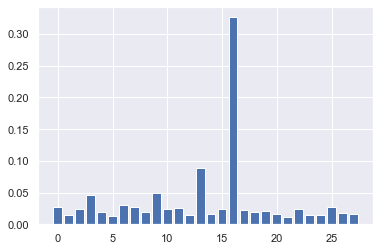

In [187]:
# plot
plt.bar(range(len(xgbfin.feature_importances_)), xgbfin.feature_importances_)
plt.show()

In [188]:
imp_features = xgbfin.feature_importances_

In [189]:
imp_features.transpose()

array([0.02759294, 0.01502603, 0.02356276, 0.04604863, 0.01964574,
       0.01330666, 0.03077831, 0.02797964, 0.01944988, 0.04876626,
       0.02367496, 0.02618102, 0.01461107, 0.08861046, 0.01672449,
       0.02436496, 0.32659283, 0.02311254, 0.0198441 , 0.0204412 ,
       0.01656941, 0.01196443, 0.02432678, 0.01424832, 0.01434841,
       0.02781485, 0.01830183, 0.01611148], dtype=float32)

In [194]:
len(imp_features)

28

In [195]:
col

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'Amount'],
      dtype='object')

In [196]:
imp_ft_dat = pd.DataFrame(imp_features, index = col, columns = ["imp_values"])

In [199]:
imp_ft_dat.sort_values(by = ['imp_values'], ascending = False, inplace = True)

In [204]:
imp_ft_dat

,imp_values
V17,0.326593
V14,0.088610
V10,0.048766
V4,0.046049
V7,0.030778
V8,0.027980
V26,0.027815
V1,0.027593
V12,0.026181
V16,0.024365


In [205]:
# Following are the top 15 features
imp_ft_dat.head(15)

,imp_values
V17,0.326593
V14,0.088610
V10,0.048766
V4,0.046049
V7,0.030778
V8,0.027980
V26,0.027815
V1,0.027593
V12,0.026181
V16,0.024365
